# LSE Data Analytics Online Career Accelerator 

## DA301:  Advanced Analytics for Organisational Impact

### Dhondee_Kelvin_DA301_Assignment_Notebook

#### Scenario
You are a data analyst working for Turtle Games, a game manufacturer and retailer. They manufacture and sell their own products, along with sourcing and selling products manufactured by other companies. Their product range includes books, board games, video games and toys. They have a global customer base and have a business objective of improving overall sales performance by utilising customer trends. In particular, Turtle Games wants to understand: 
- how customers accumulate loyalty points (Week 1)
- exploring the structure using decision trees (Week 2)
- exploring clusters in customer behaviour (Week 3)
- can social data (e.g. customer reviews) be used in marketing campaigns (Week 4)
- loading, transforming and visualising data in R (Week 5)
- statistical analysis and modelling in R (Week 6)

# Week 1 assignment: Linear regression using Python
The marketing department of Turtle Games prefers Python for data analysis. As you are fluent in Python, they asked you to assist with data analysis of social media data. The marketing department wants to better understand how users accumulate loyalty points. Therefore, you need to investigate the possible relationships between the loyalty points, age, remuneration, and spending scores. Note that you will use this data set in future modules as well and it is, therefore, strongly encouraged to first clean the data as per provided guidelines and then save a copy of the clean data for future use.

*Instructions*
1. Load and explore the data.
    1. Create a new DataFrame (e.g. reviews).
    2. Sense-check the DataFrame.
    3. Determine if there are any missing values in the DataFrame.
    4. Create a summary of the descriptive statistics.
2. Remove redundant columns (`language` and `platform`).
3. Change column headings to names that are easier to reference (e.g. `renumeration` and `spending_score`).
4. Save a copy of the clean DataFrame as a CSV file. Import the file to sense-check.
5. Use linear regression and goodness of fit metrics to evaluate possible linear relationships between loyalty points and age/renumeration/spending scores to determine whether these can be used to predict the loyalty points.
    1. Specify the independent and dependent variables.
    2. Create the OLS model.
    3. Extract the estimated parameters, standard errors, and predicted values.
    4. Generate the regression table based on the X coefficient and constant values.
    5. Plot the linear regression and add a regression line.
6. Include your insights and observations.

## 1. Load and explore the data

In [1]:
# Core Data Libraries
import numpy as np
import pandas as pd
import math
import os
import re
from collections import Counter, defaultdict

# Data Visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import seaborn as sns

# Statistical Analysis
import scipy.stats as stats
from scipy.stats import shapiro, norm
from scipy.spatial.distance import cdist
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.graphics.gofplots import qqplot

# Machine Learning
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, r2_score,
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, ConfusionMatrixDisplay, classification_report,
    silhouette_score
)
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.utils.validation import column_or_1d
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.svm import SVC

# Natural Language Processing
import nltk
import contractions
from nltk import word_tokenize, pos_tag
from nltk.corpus import stopwords, wordnet as wn
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.probability import FreqDist
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud
from textblob import TextBlob

# Hierarchical Clustering
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# NLTK Downloads (uncomment if needed)
# nltk.download('punkt')
# nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger_eng')

# Visualization Settings
plt.rcParams['figure.figsize'] = [15, 10]

# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /Users/kelvin/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


In [2]:
# Function to validate data.
def validate_data(df):
    """
    Performs comprehensive data validation and exploration on a pandas DataFrame.
    
    This function provides multiple views of the data to help identify potential issues
    and understand the dataset structure. It displays the first and last rows, shape,
    metadata, missing values, unique values, duplicates, and summary statistics.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame to be validated.
        
    Returns:
    --------
    None
        Results are printed to the console.
        
    Notes:
    ------
    The function performs the following checks:
    - Displays first and last 5 rows of the DataFrame
    - Shows the shape (rows, columns)
    - Provides DataFrame metadata via info()
    - Counts missing values in each column
    - Counts unique values in each column
    - Counts duplicate rows
    - Displays summary statistics using describe()
    """
    # view DataFrame.
    print("\nFirst 5 rows of DataFrame:")
    display(df.head())
    print("\nLast 5 rows of Dataframe:")
    display(df.tail())
    
    shape = df.shape
    print("\nShape of DataFrame:")
    print(shape)
    
    # review metadata.
    print("\nDataFrame Info:")
    info = df.info()
    # check for missing values.
    missing_values = df.isnull().sum()
    print("\nNumber of nulls per column:")
    print(missing_values)
          
    # check for unique values.
    unique_counts = df.nunique()
    print("\nUnique values per column:")
    print(unique_counts)
    # check for duplicates.
    duplicate_counts = df.duplicated().sum()
    print("\nNumber of duplicate rows:")
    print(duplicate_counts)
    # summary statistics.
    summary_stats = df.describe().round(2)
    print("\nSummary statistics:")
    print(summary_stats)

In [3]:
# Load the CSV file(s) as reviews.
reviews =pd.read_csv('turtle_reviews.csv')

In [4]:
validate_data(reviews)


First 5 rows of DataFrame:


,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap



Last 5 rows of Dataframe:


,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
1995,Female,37,84.46,69,4031,PhD,EN,Web,977,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Female,43,92.66,8,539,PhD,EN,Web,979,Great game. Did not think I would like it whe...,Super fun
1997,Male,34,92.66,91,5614,graduate,EN,Web,1012,Great game for all.........\nKeeps the mind ni...,Great Game
1998,Male,34,98.40,16,1048,PhD,EN,Web,1031,fun game!,Four Stars
1999,Male,32,92.66,8,479,PhD,EN,Web,453,This game is fun. A lot like scrabble without ...,Love this game



Shape of DataFrame:
(2000, 11)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   language                2000 non-null   object 
 7   platform                2000 non-null   object 
 8   product                 2000 non-null   int64  
 9   review                  2000 non-null   object 
 10  summary                 2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB

Number of nulls per column:
gender                    0
age                       0
remune

## 2. Drop columns

In [5]:
# Drop unnecessary columns.
reviews.drop(['language', 'platform'], axis=1, inplace=True)

## 3. Rename columns

In [6]:
# Rename the column headers to simplify code.
reviews.rename(columns={'remuneration (k£)':'remuneration',\
                       'spending_score (1-100)':'spending_score'\
                       }, inplace=True)

# View column names.
reviews.columns

Index(['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'product', 'review', 'summary'],
      dtype='object')

## 4. Save the DataFrame as a CSV file

In [7]:
# Create a CSV file as output.
reviews.to_csv('reviews.csv', index=False)

In [8]:
# Import new CSV file with Pandas.
reviews = pd.read_csv('reviews.csv')

In [9]:
validate_data(reviews)


First 5 rows of DataFrame:


,gender,age,remuneration,spending_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap



Last 5 rows of Dataframe:


,gender,age,remuneration,spending_score,loyalty_points,education,product,review,summary
1995,Female,37,84.46,69,4031,PhD,977,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Female,43,92.66,8,539,PhD,979,Great game. Did not think I would like it whe...,Super fun
1997,Male,34,92.66,91,5614,graduate,1012,Great game for all.........\nKeeps the mind ni...,Great Game
1998,Male,34,98.40,16,1048,PhD,1031,fun game!,Four Stars
1999,Male,32,92.66,8,479,PhD,453,This game is fun. A lot like scrabble without ...,Love this game



Shape of DataFrame:
(2000, 9)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   remuneration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   product         2000 non-null   int64  
 7   review          2000 non-null   object 
 8   summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 140.8+ KB

Number of nulls per column:
gender            0
age               0
remuneration      0
spending_score    0
loyalty_points    0
education         0
product           0
review            0
summary           0
dtype: int64

Unique values per column:
gender               2
age            

## 5. Exploratory Data Analysis

### 5a) Correlation Matrix

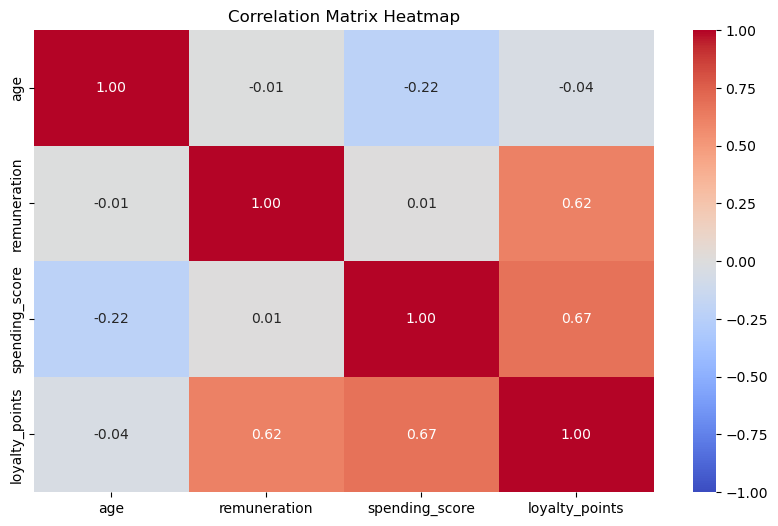

In [10]:
# Check for correlation between the numerical variables.
numeric_reviews = pd.DataFrame(reviews, columns=['age', 'remuneration', 'spending_score', 'loyalty_points'])

# View any correlations between the variables in question
correlation_matrix = numeric_reviews.corr()

correlation_matrix

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title("Correlation Matrix Heatmap")
plt.show()

- Spending Score and Loyalty Points (0.6723): Moderately strong positive correlation.
- Remuneration and Loyalty Points (0.6161): Moderately strong positive correlation.

### 5b) Joint Plots

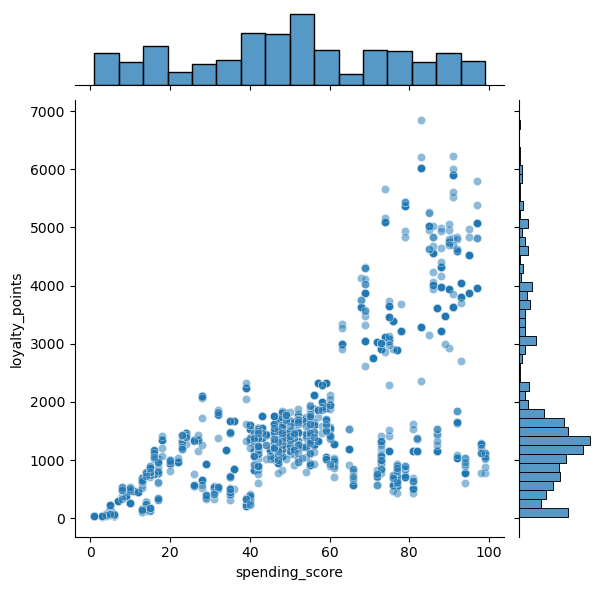

In [11]:
sns.jointplot(x="spending_score", y="loyalty_points", data=reviews, alpha=0.5)
plt.show()

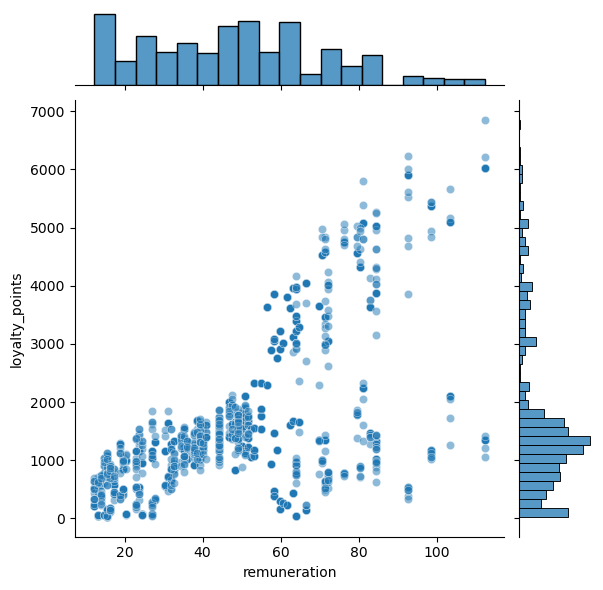

In [12]:
sns.jointplot(x="remuneration", y="loyalty_points", data=reviews, alpha=0.5)
plt.show()

### 5c) Pair Plots

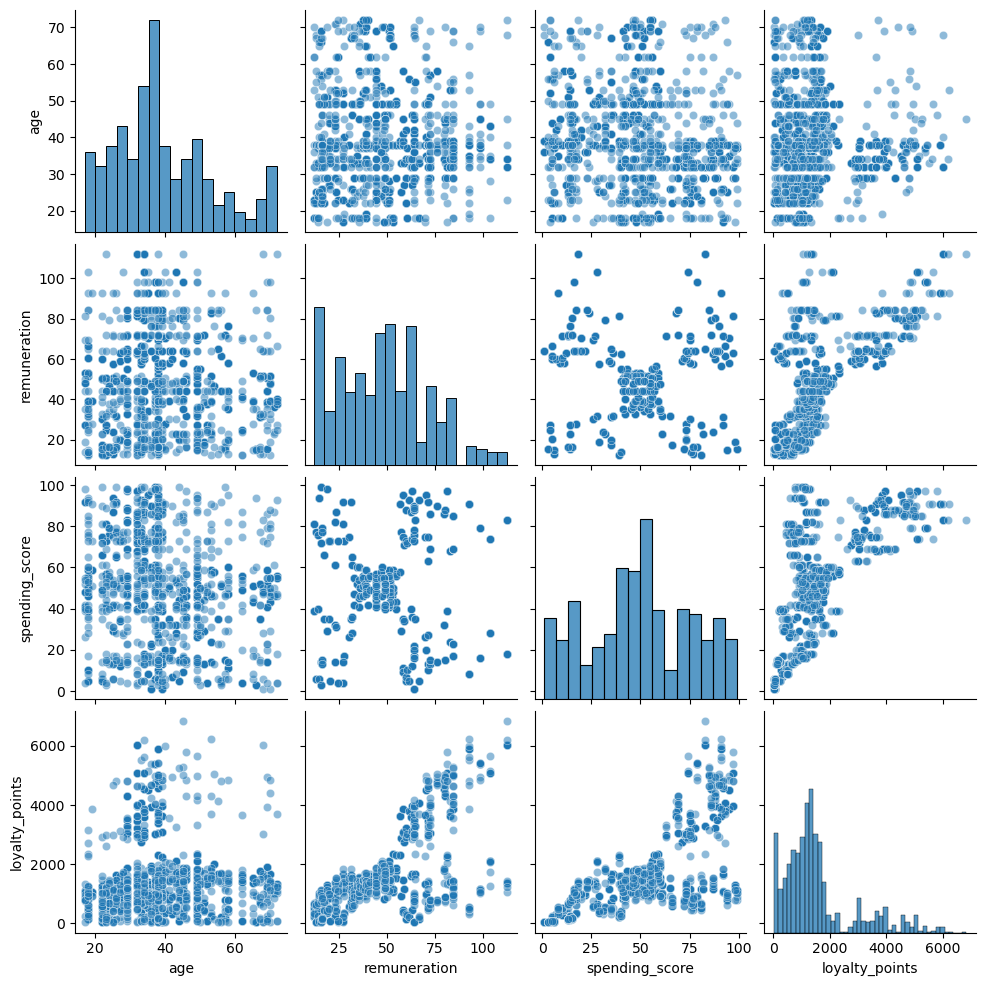

In [13]:
sns.pairplot(numeric_reviews, kind='scatter', plot_kws={'alpha':0.5})
plt.show()

### 5d) Histogram for loyalty_points

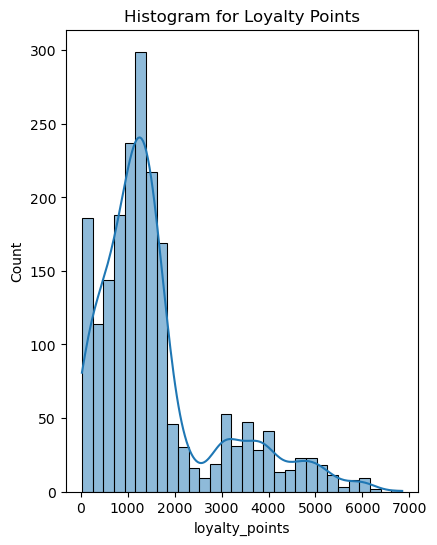

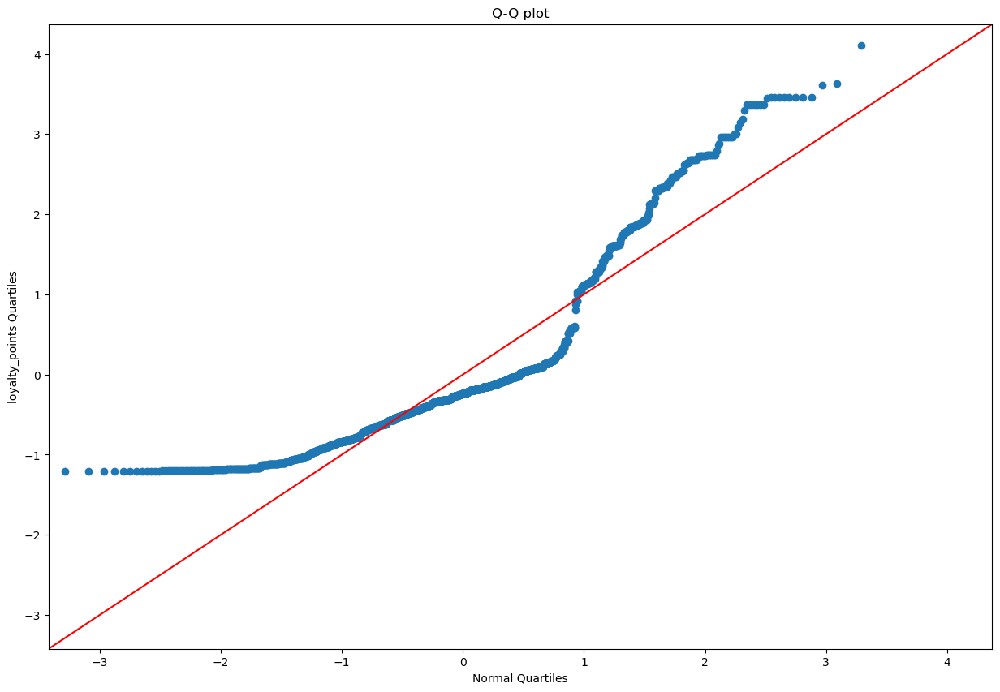

ShapiroResult(statistic=0.8430727369718951, pvalue=1.2431393983403577e-40)


In [14]:
# Histogram of dependant variable loyalty_points
plt.figure(figsize=(10, 6), dpi=100)

plt.subplot(1,2,1)
sns.histplot(reviews, x='loyalty_points', bins=30, kde=True)
plt.title("Histogram for Loyalty Points")

# Plot the loyalty_points versus the quartiles of the N(0,1)
# The fit=True argument first Standardises loyalty_points before plotting them

#plt.subplot(1,2,2)
sm.qqplot(reviews['loyalty_points'], fit=True, line='45')
plt.ylabel("loyalty_points Quartiles")
plt.xlabel("Normal Quartiles")
plt.title("Q-Q plot")
plt.show()

print(shapiro(reviews['loyalty_points']))

Postive (right) skew.
Be mindful of heteroscedasticity.

## 6. Simple Linear regression

### 6a) spending_score vs loyalty_points (OLS Method)

In [15]:
# Define independent variable.
X = reviews['spending_score']

# Define dependent variable.
y = reviews['loyalty_points']

# Create model and print summary of metrics.
# Add a constant to the regression model.
X = sm.add_constant(X)

# Fit the model.
model1 = sm.OLS(y, X).fit()

print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.452
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     1648.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):          2.92e-263
Time:                        13:31:15   Log-Likelihood:                -16550.
No. Observations:                2000   AIC:                         3.310e+04
Df Residuals:                    1998   BIC:                         3.312e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -75.0527     45.931     -1.

- spending_score explains 45% of the variance in loyalty_points. The estimate of the intercept is not significant (p=0.102). The slope estimate is significant (p=0.000). If spending_score changes by 1 unit, then loyalty_points will change by 33.06 units.
- Durbin-Watson test statistic not <1 or >3. Residuals are not autocorrelated
- Jarque_Bera: (p-value is < 0.05): There is significant evidence to suggest that the data does not follow a normal distribution.

In [16]:
# Extract the estimated parameters.
print("Parameters: ", model1.params)

# Extract the standard errors.
print("Standard errors: ", model1.bse)

# Extract the predicted values.
print("Predicted values: ", model1.predict())

Parameters:  const            -75.052663
spending_score    33.061693
dtype: float64
Standard errors:  const             45.930554
spending_score     0.814419
dtype: float64
Predicted values:  [1214.35337415 2602.94449102  123.31749662 ... 2933.56142361  453.93442921
  189.44088314]


In [17]:
# Set the X coefficient and the constant to generate the regression table.
predicts1 = (-75.0527) + 33.0617 * reviews['spending_score']

# View the output.
predicts1

0       1214.3536
1       2602.9450
2        123.3175
3       2470.6982
4       1247.4153
          ...    
1995    2206.2046
1996     189.4409
1997    2933.5620
1998     453.9345
1999     189.4409
Name: spending_score, Length: 2000, dtype: float64

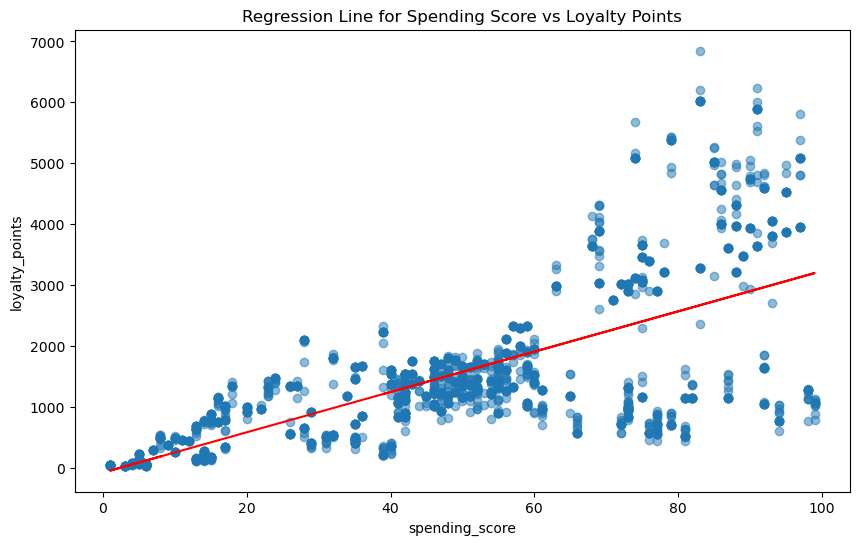

In [18]:
# Plot the graph with a regression line.
plt.figure(figsize=(10, 6))
plt.scatter(reviews['spending_score'], reviews['loyalty_points'], alpha=0.5)
plt.plot(reviews['spending_score'], predicts1, color='red')
plt.xlabel('spending_score')
plt.ylabel('loyalty_points')
plt.title('Regression Line for Spending Score vs Loyalty Points')
plt.show()

**Checking model1 for normality of residuals**

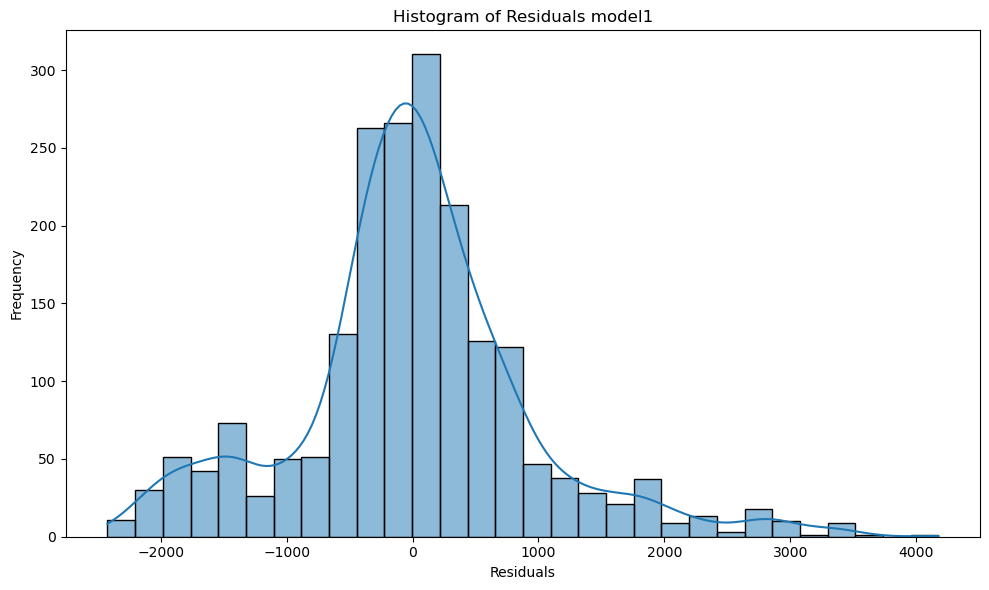

<Figure size 1000x600 with 0 Axes>

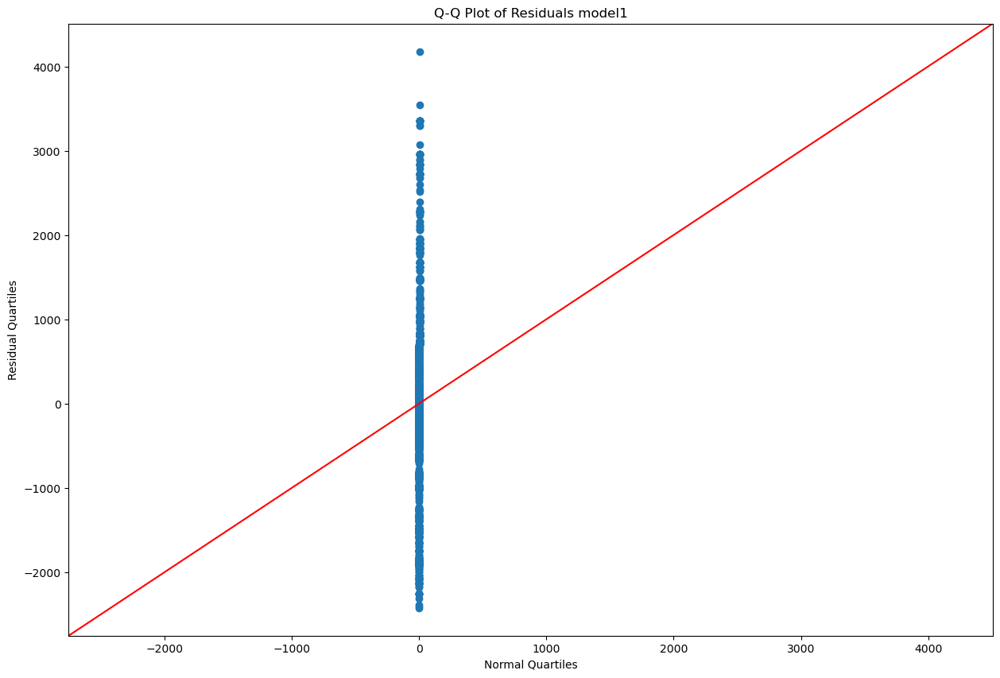

Shapiro-Wilk Test: Stat=0.9554014968359433, p-value=2.92487968205126e-24
Residuals are not normally distributed.


In [19]:
# Calculate the residuals
residuals_model1 = model1.resid

# Plot the residuals
plt.figure(figsize=(10,6))
sns.histplot(residuals_model1, kde=True, bins=30)
plt.title('Histogram of Residuals model1')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Q-Q plot for normality of residuals
plt.figure(figsize=(10, 6))
sm.qqplot(residuals_model1, line ='45')
plt.title('Q-Q Plot of Residuals model1')
plt.ylabel("Residual Quartiles")
plt.xlabel("Normal Quartiles")
plt.show()

# Shapiro-Wilk Test for normality of residuals
stat, p_value = stats.shapiro(residuals_model1)
print(f"Shapiro-Wilk Test: Stat={stat}, p-value={p_value}")

# If p-value < 0.05, it suggests residuals are not normally distributed
if p_value < 0.05:
    print("Residuals are not normally distributed.")
else:
    print("Residuals are normally distributed.")

**Testing model1 for homoscedasticity**

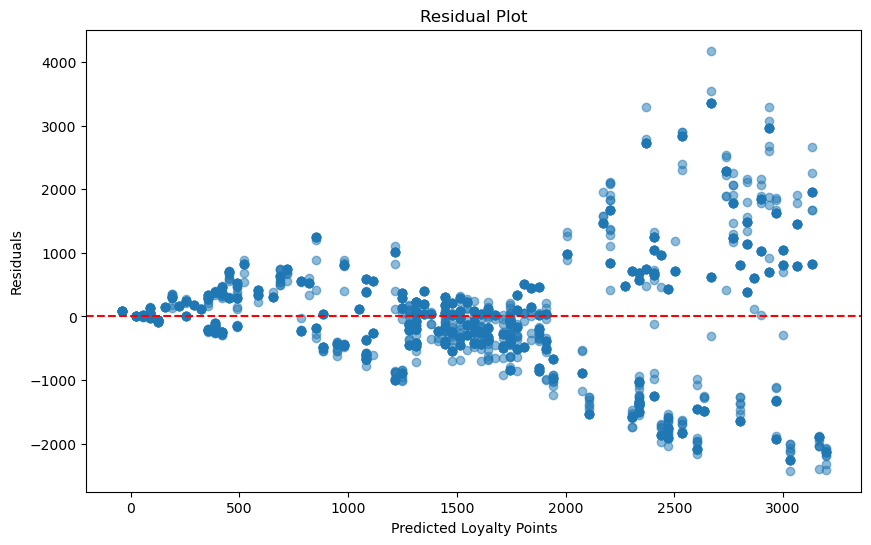

In [20]:
# Residual plot
plt.figure(figsize=(10, 6))
plt.scatter(predicts1, model1.resid, alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--') #adds a horizontal line at y=0 represents the zero residual line
plt.xlabel('Predicted Loyalty Points')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

In [21]:
# Run the Breusch-Pagan test function model1
test = sms.het_breuschpagan(model1.resid, model1.model.exog)

# Print the results of the Breusch-Pagan test.
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, test)))

{'LM stat': 629.9823360215923, 'LM Test p-value': 5.042699614939363e-139, 'F-stat': 918.7507142907754, 'F-test p-value': 2.3037887924479145e-166}


P < 0.05. Reject the null hypothesis and conclude that the data has heteroscedasticity.

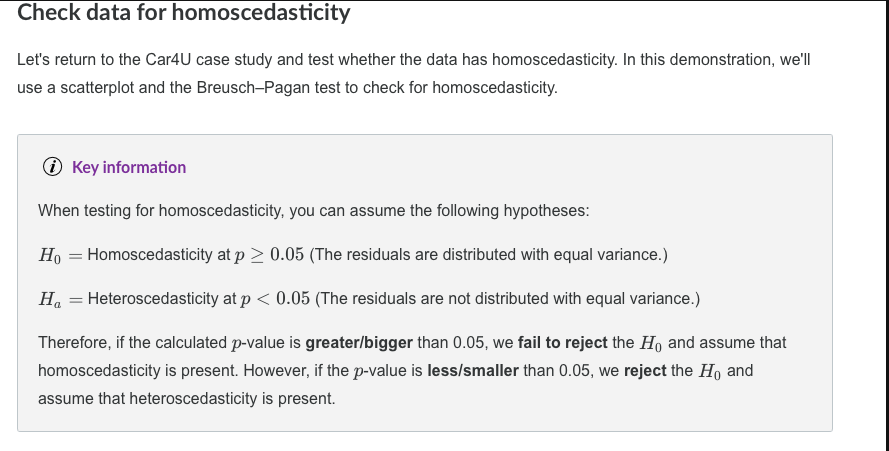

### 6b) Transforming loyalty_points to natural log loyalty_points.

- Reason 1: loyalty_points not normally distributed (positive skew).
- Reason 2: Residuals of model1 not normally distributed.
- Reason 3: Breusch-Pagan test on model1 displayed clear evidence of heteroscedasticity.

In [22]:
# Transform loyalty_points to natural log loyalty_points.
# Reason 1: loyalty_points not normally distributed (positive skew).
# Reason 2: Residuals of model1 not normally distributed.
# Reason 3: Breusch-Pagan test on model1 displayed clear evidence of heteroscedasticity.
reviews['log_loyalty_points'] = np.log(reviews['loyalty_points'])

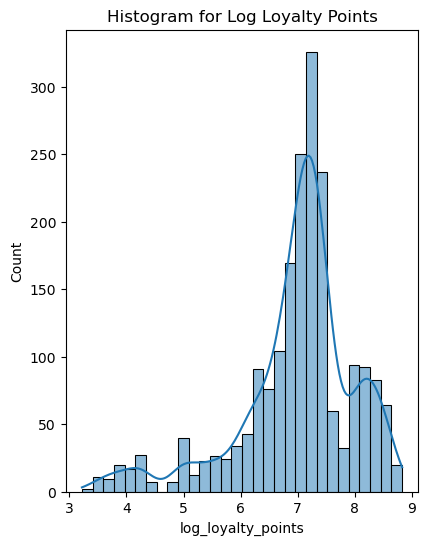

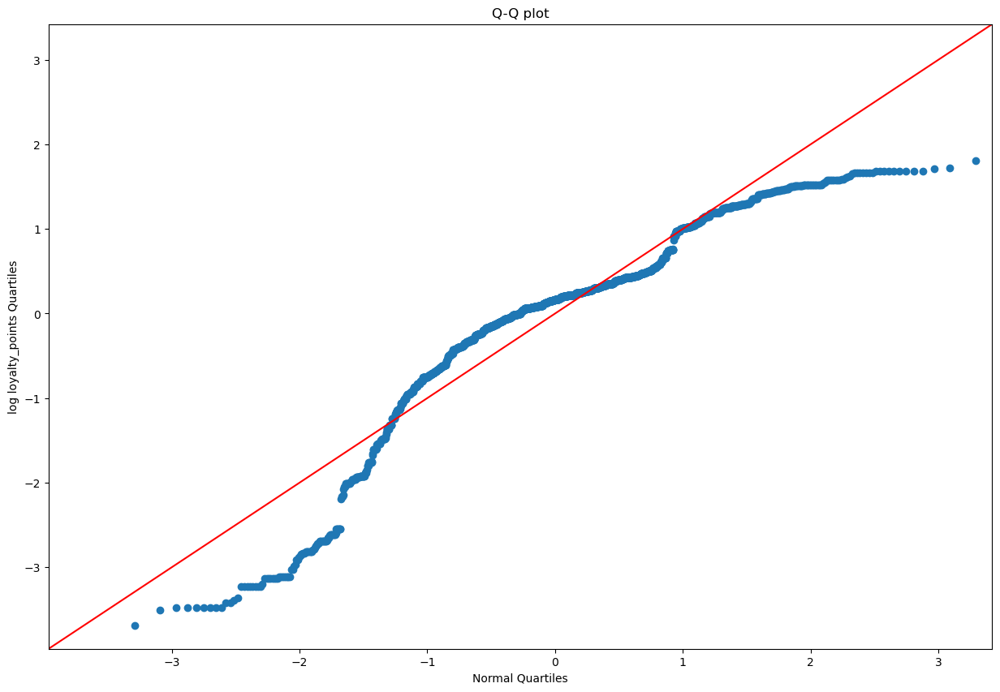

ShapiroResult(statistic=0.9045411555916092, pvalue=1.2331497598614564e-33)


In [23]:
# Histogram of dependant variable loyalty_points
plt.figure(figsize=(10, 6), dpi=100)

plt.subplot(1,2,1)
sns.histplot(reviews, x='log_loyalty_points', bins=30, kde=True)
plt.title("Histogram for Log Loyalty Points")

# Plot the loyalty_points versus the quartiles of the N(0,1)
# The fit=True argument first Standardises loyalty_points before plotting them

#plt.subplot(1,2,2)

sm.qqplot(reviews['log_loyalty_points'], fit=True, line='45')
plt.ylabel("log loyalty_points Quartiles")
plt.xlabel("Normal Quartiles")
plt.title("Q-Q plot")
plt.show()

print(shapiro(reviews['log_loyalty_points']))

For loyalty_points (above): ShapiroResult(statistic=0.8430727369718951, pvalue=1.2431393983403577e-40)

As per the above histogram and Q-Q plot, the log-transformed variable loyalty_points depicts a much closer-to-normal distribution than the loyalty_point variable.

The closer the Shapiro-Wilk test statistic is to 1, the more the data resembles a normal distribution. We can see an improvement in this regard (0.84 ~ 0.90).

Interpretation of the Shapiro-Wilk statistical test of normality: A small p-value suggests a significant departure from normality. The p-value ≈ 1.23e-33, which indicates a significant departure from normality for the log-transformed variable loyalty_points.

### 6c) spending_score vs log_loyalty_points (OLS Method)

In [24]:
# Define independent variable.
X = reviews['spending_score']

# Define dependent variable.
y = reviews['log_loyalty_points']

# Create model and print summary of metrics.
# Add a constant to the regression model.
X = sm.add_constant(X)

# Fit the model.
model2 = sm.OLS(y, X).fit()

print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:     log_loyalty_points   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                     2153.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):          1.44e-319
Time:                        13:31:16   Log-Likelihood:                -2146.7
No. Observations:                2000   AIC:                             4297.
Df Residuals:                    1998   BIC:                             4309.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              5.5740      0.034    162.

- spending_score explains 52% of the variation in log_loyalty_points. This is an improvement on model1
- Both p-values now statiscally significant (p=0.000).
- The model suggests that changes in spending_score explain about 51.9% of the proportional (percentage) changes in loyalty points rather than absolute changes.
- Durbin-Watson test statistic now <1 or >3. Residuals are autocorrelated.
- Jarque_Bera: (p-value is < 0.05): There is significant evidence to suggest that the data does not follow a normal distribution.

In [25]:
# Set the X coefficient and the constant to generate the regression table.
predicts2 = (5.5759) + 0.0282 * reviews['spending_score']

# View the output.
predicts2

0       6.6757
1       7.8601
2       5.7451
3       7.7473
4       6.7039
         ...  
1995    7.5217
1996    5.8015
1997    8.1421
1998    6.0271
1999    5.8015
Name: spending_score, Length: 2000, dtype: float64

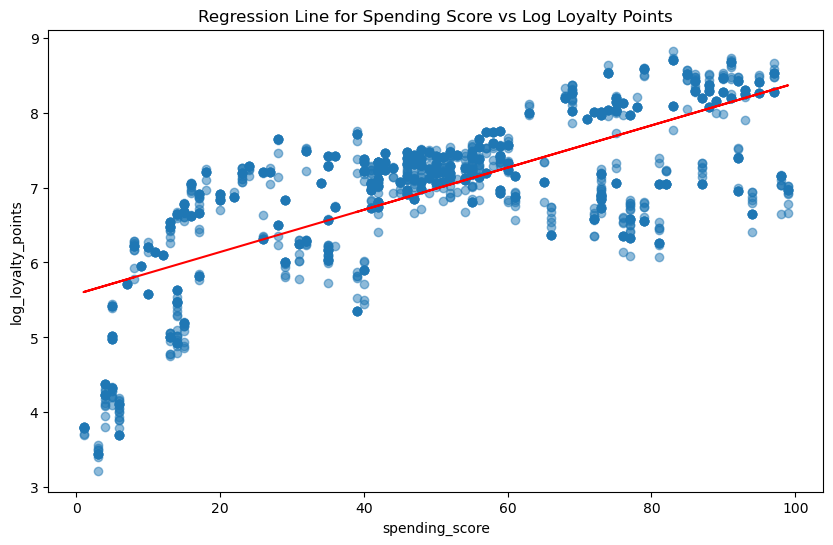

In [26]:
# Plot the graph with a regression line.
plt.figure(figsize=(10, 6))
plt.scatter(reviews['spending_score'], reviews['log_loyalty_points'], alpha=0.5)
plt.plot(reviews['spending_score'], predicts2, color='red')
plt.xlabel('spending_score')
plt.ylabel('log_loyalty_points')
plt.title('Regression Line for Spending Score vs Log Loyalty Points')
plt.show()

**Checking model2 for normality of residuals**

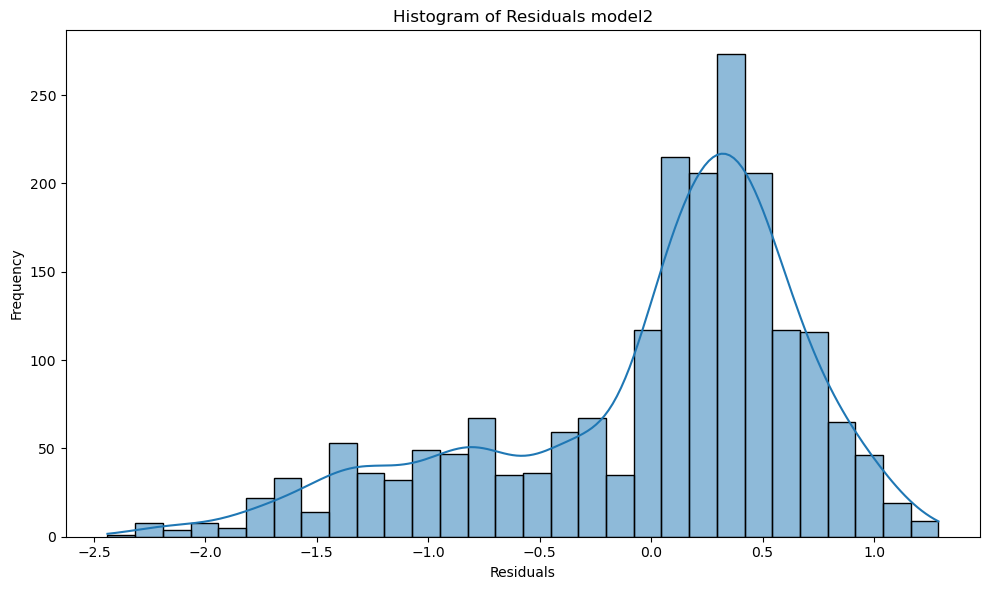

<Figure size 1000x600 with 0 Axes>

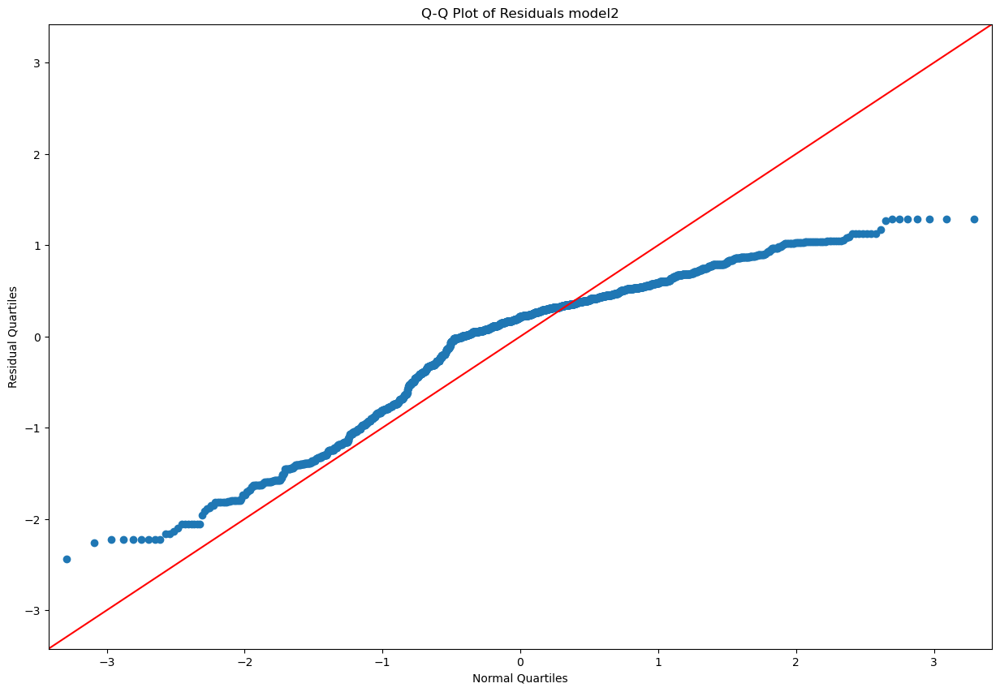

Shapiro-Wilk Test: Stat=0.9108115943449006, p-value=9.856548603081051e-33
Residuals are not normally distributed.


In [27]:
# Calculate the residuals
residuals_model2 = model2.resid

# Plot the residuals
plt.figure(figsize=(10,6))
sns.histplot(residuals_model2, kde=True, bins=30)
plt.title('Histogram of Residuals model2')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Q-Q plot for normality of residuals
plt.figure(figsize=(10, 6))
sm.qqplot(residuals_model2, line ='45')
plt.ylabel("Residual Quartiles")
plt.xlabel("Normal Quartiles")
plt.title('Q-Q Plot of Residuals model2')
plt.show()

# Shapiro-Wilk Test for normality of residuals
stat, p_value = stats.shapiro(residuals_model2)
print(f"Shapiro-Wilk Test: Stat={stat}, p-value={p_value}")

# If p-value < 0.05, it suggests residuals are not normally distributed
if p_value < 0.05:
    print("Residuals are not normally distributed.")
else:
    print("Residuals are normally distributed.")

**Testing model2 for homoscedasticity**

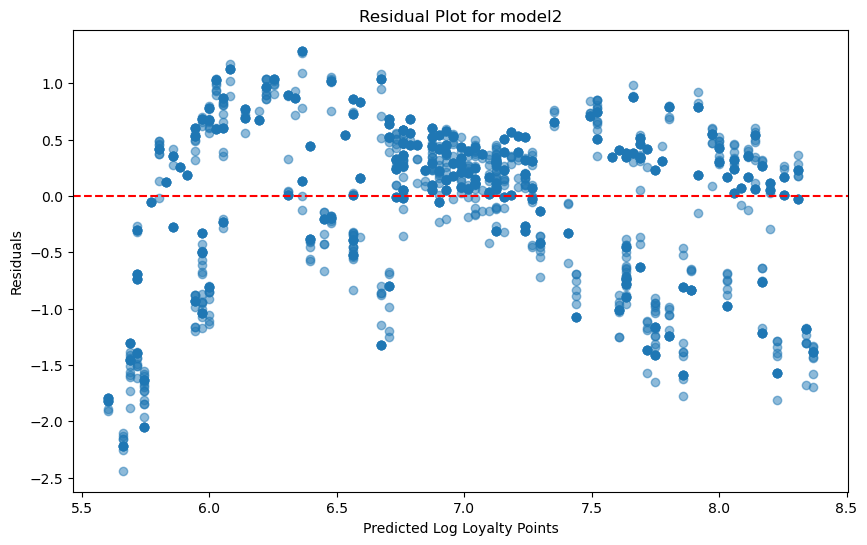

In [28]:
# Residual plot
plt.figure(figsize=(10, 6))
plt.scatter(predicts2, model2.resid, alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--') #adds a horizontal line at y=0 represents the zero residual line
plt.xlabel('Predicted Log Loyalty Points')
plt.ylabel('Residuals')
plt.title('Residual Plot for model2')
plt.show()

In [29]:
# Run the Breusch-Pagan test function model2
test = sms.het_breuschpagan(model2.resid, model2.model.exog)

# Print the results of the Breusch-Pagan test.
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, test)))

{'LM stat': 92.4511694198491, 'LM Test p-value': 6.900660585152313e-22, 'F-stat': 96.83497142491481, 'F-test p-value': 2.4043577159860197e-22}


Heteroscedasticity is still a problem with model2 (p<0.05).

This compromises the reliability and validity of model2 (may result in biased standard errors, incorrect statistical inference, and inefficient parameter estimates).

### 6d) remumeration vs loyalty (OLS Method)

In [30]:
# Define independent variable.
X = reviews['remuneration']

# Define dependent variable.
y = reviews['loyalty_points']

# Create model and print summary of metrics.
# Add a constant to the regression model.
X = sm.add_constant(X)

# Fit the model.
model3 = sm.OLS(y, X).fit()

print(model3.summary())


                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.380
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     1222.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):          2.43e-209
Time:                        13:31:16   Log-Likelihood:                -16674.
No. Observations:                2000   AIC:                         3.335e+04
Df Residuals:                    1998   BIC:                         3.336e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const          -65.6865     52.171     -1.259   

- Model3 suggests that remuneration explains 38% of the variance in loyalty_points.
- The estimate of the intercept is not statistically significant (p=0.208).
- The slope coefficient is statistically significant (p=0.000).
- Durbin-Watson test statistic <1 or >3. Residuals are autocorrelated
- Jarque_Bera: (p-value is < 0.05): There is significant evidence to suggest that the data does not follow a normal distribution.

In [31]:
# Extract the estimated parameters.
print("Parameters: ", model3.params)

# Extract the standard errors.
print("Standard errors: ", model3.bse)

# Extract the predicted values.
print("Predicted values: ", model3.predict())

Parameters:  const          -65.686513
remuneration    34.187825
dtype: float64
Standard errors:  const           52.170717
remuneration     0.977925
dtype: float64
Predicted values:  [ 354.82374068  354.82374068  382.85775758 ... 3102.15739671 3298.39551499
 3102.15739671]


In [32]:
# Set the X coefficient and the constant to generate the regression table.
predicts3 = (-65.686513) + 34.187825 * reviews['remuneration']

# View the output.
predicts3

0        354.823735
1        354.823735
2        382.857751
3        382.857751
4        410.891767
           ...     
1995    2821.817186
1996    3102.157351
1997    3102.157351
1998    3298.395467
1999    3102.157351
Name: remuneration, Length: 2000, dtype: float64

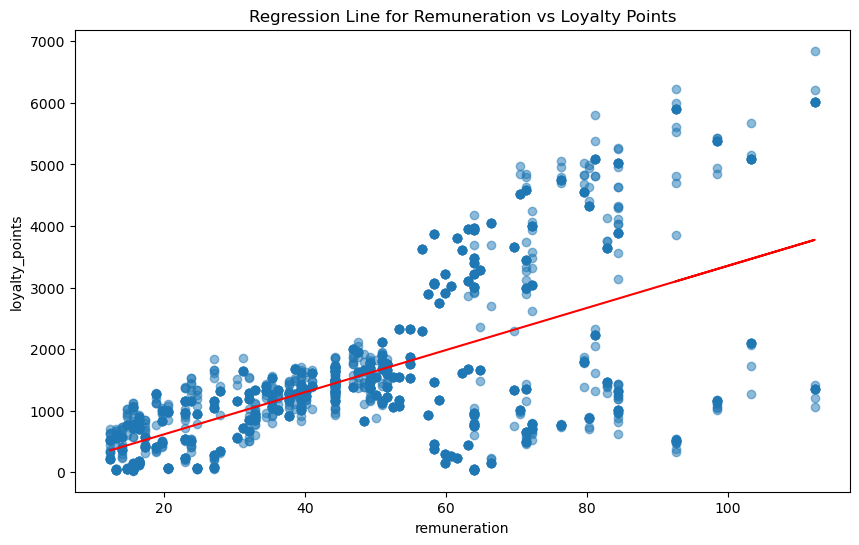

In [33]:
# Plot the graph with a regression line.
plt.figure(figsize=(10, 6))
plt.scatter(reviews['remuneration'], reviews['loyalty_points'], alpha=0.5)
plt.plot(reviews['remuneration'], predicts3, color='red')
plt.xlabel('remuneration')
plt.ylabel('loyalty_points')
plt.title('Regression Line for Remuneration vs Loyalty Points')
plt.show()

**Checking model3 for normality of residuals**

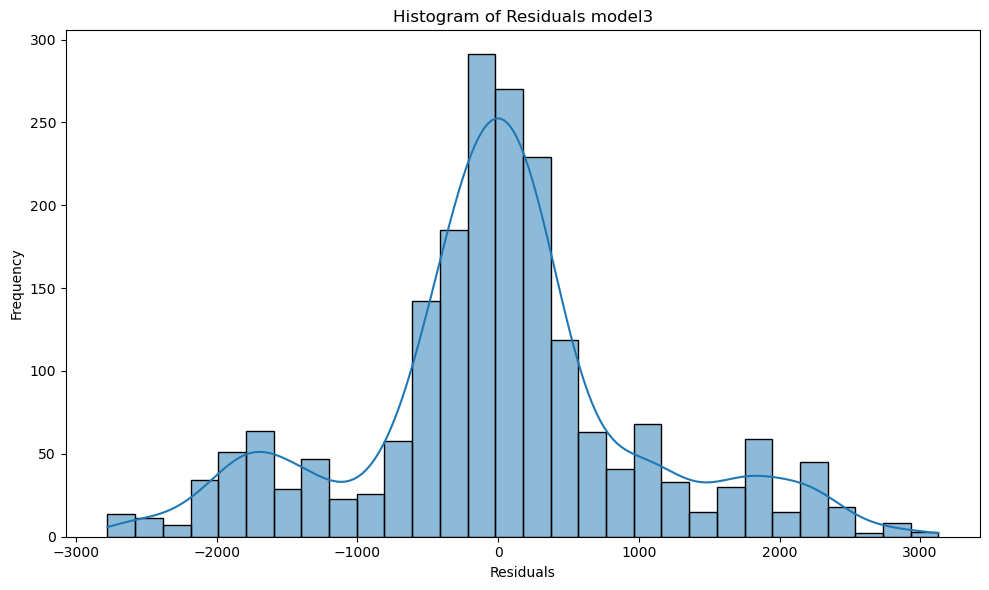

<Figure size 1000x600 with 0 Axes>

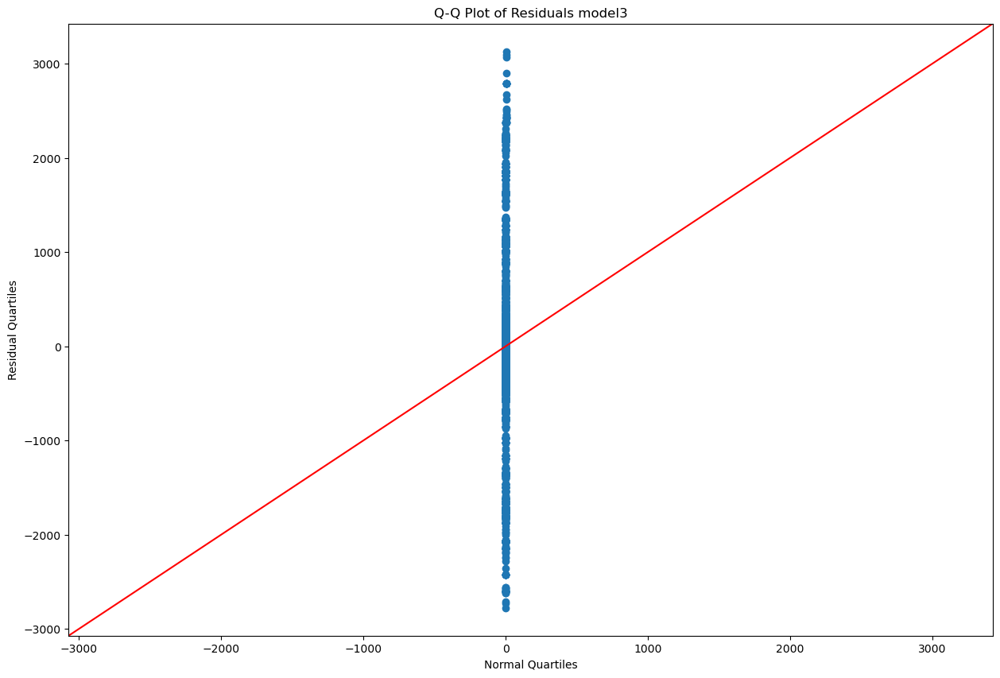

Shapiro-Wilk Test: Stat=0.96093791799781, p-value=8.590692253104703e-23
Residuals are not normally distributed.


In [34]:
# Calculate the residuals
residuals_model3 = model3.resid

# Plot the residuals
plt.figure(figsize=(10,6))
sns.histplot(residuals_model3, kde=True, bins=30)
plt.title('Histogram of Residuals model3')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Q-Q plot for normality of residuals
plt.figure(figsize=(10, 6))
sm.qqplot(residuals_model3, line ='45')
plt.title('Q-Q Plot of Residuals model3')
plt.ylabel("Residual Quartiles")
plt.xlabel("Normal Quartiles")
plt.show()

# Shapiro-Wilk Test for normality of residuals
stat, p_value = stats.shapiro(residuals_model3)
print(f"Shapiro-Wilk Test: Stat={stat}, p-value={p_value}")

# If p-value < 0.05, it suggests residuals are not normally distributed
if p_value < 0.05:
    print("Residuals are not normally distributed.")
else:
    print("Residuals are normally distributed.")

**Testing model3 for homoscedasticity**

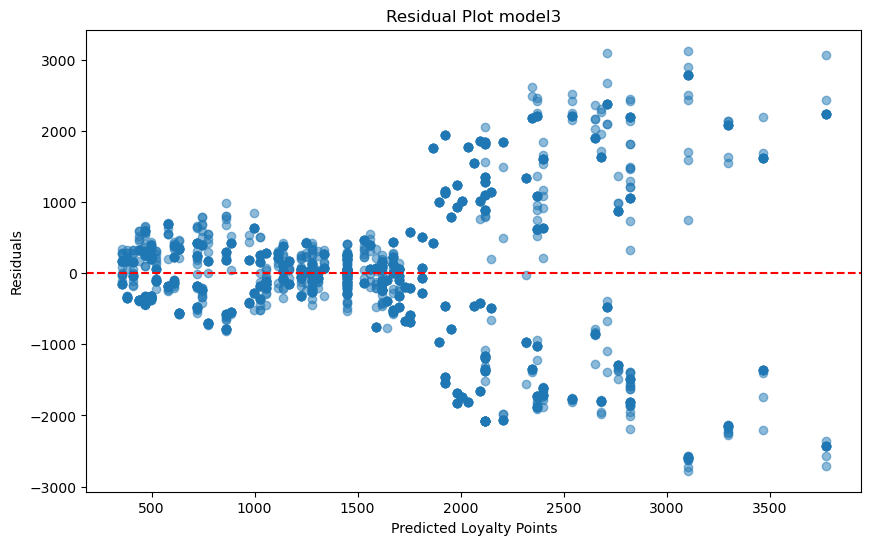

In [35]:
# Residual plot
plt.figure(figsize=(10, 6))
plt.scatter(predicts3, model3.resid, alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--') #adds a horizontal line at y=0 represents the zero residual line
plt.xlabel('Predicted Loyalty Points')
plt.ylabel('Residuals')
plt.title('Residual Plot model3')
plt.show()

In [36]:
# Run the Breusch-Pagan test function model3
test = sms.het_breuschpagan(model3.resid, model3.model.exog)

# Print the results of the Breusch-Pagan test.
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, test)))

{'LM stat': 1038.6445487288277, 'LM Test p-value': 7.153051772824646e-228, 'F-stat': 2158.6311344219303, 'F-test p-value': 3.68e-320}


Breusch-Pagan test for model3 confirms heteroscedasticity.

### 6e) remuneration vs log_loyalty_points (OLS Method)

In [37]:
# Define independent variable.
X = reviews['remuneration']

# Define dependent variable.
y = reviews['log_loyalty_points']

# Create model and print summary of metrics.
# Add a constant to the regression model.
X = sm.add_constant(X)

# Fit the model.
model4 = sm.OLS(y, X).fit()

print(model4.summary())

                            OLS Regression Results                            
Dep. Variable:     log_loyalty_points   R-squared:                       0.284
Model:                            OLS   Adj. R-squared:                  0.284
Method:                 Least Squares   F-statistic:                     794.3
Date:                Mon, 14 Apr 2025   Prob (F-statistic):          1.98e-147
Time:                        13:31:16   Log-Likelihood:                -2543.1
No. Observations:                2000   AIC:                             5090.
Df Residuals:                    1998   BIC:                             5101.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            5.8505      0.045    131.318   

- The model suggests that changes in remuneration explain about 28.4% of the proportional (percentage) changes in loyalty points rather than absolute changes.
  
- P-values for both the intercept and slope <0.05, therefore, statistically significant relationship.

- Durbin-Watson test statistic not <1 or >3. Residuals are not autocorrelated
- Jarque_Bera: (p-value is < 0.05): There is significant evidence to suggest that the data does not follow a normal distribution.

In [38]:
# Extract the estimated parameters.
print("Parameters: ", model4.params)

# Extract the standard errors.
print("Standard errors: ", model4.bse)

# Extract the predicted values.
print("Predicted values: ", model4.predict())

Parameters:  const           5.850516
remuneration    0.023537
dtype: float64
Standard errors:  const           0.044552
remuneration    0.000835
dtype: float64
Predicted values:  [6.14002166 6.14002166 6.15932201 ... 8.0314559  8.16655834 8.0314559 ]


In [39]:
# Set the X coefficient and the constant to generate the regression table.
predicts4 = (5.850516) + 0.023537 * reviews['remuneration']

# View the output.
predicts4

0       6.140021
1       6.140021
2       6.159321
3       6.159321
4       6.178622
          ...   
1995    7.838451
1996    8.031454
1997    8.031454
1998    8.166557
1999    8.031454
Name: remuneration, Length: 2000, dtype: float64

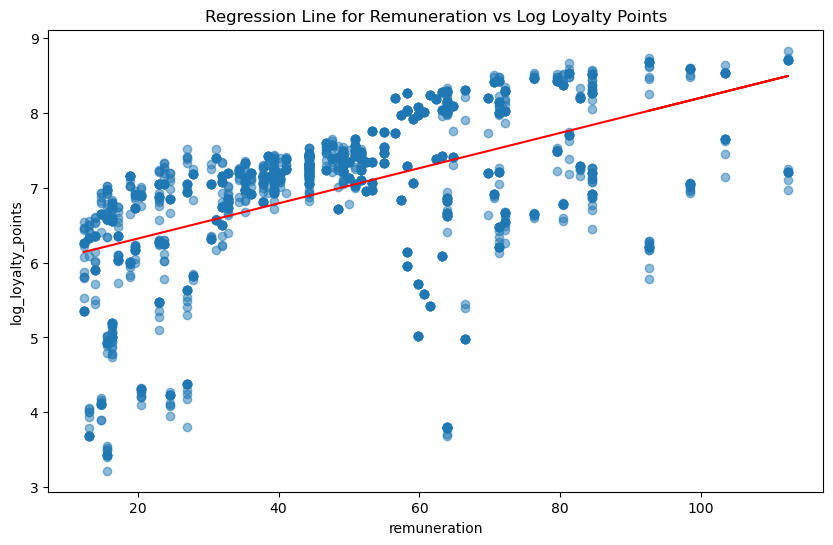

In [40]:
# Plot the graph with a regression line.
plt.figure(figsize=(10, 6))
plt.scatter(reviews['remuneration'], reviews['log_loyalty_points'], alpha=0.5)
plt.plot(reviews['remuneration'], predicts4, color='red')
plt.xlabel('remuneration')
plt.ylabel('log_loyalty_points')
plt.title('Regression Line for Remuneration vs Log Loyalty Points')
plt.show()

**Checking model4 for normality of residuals**

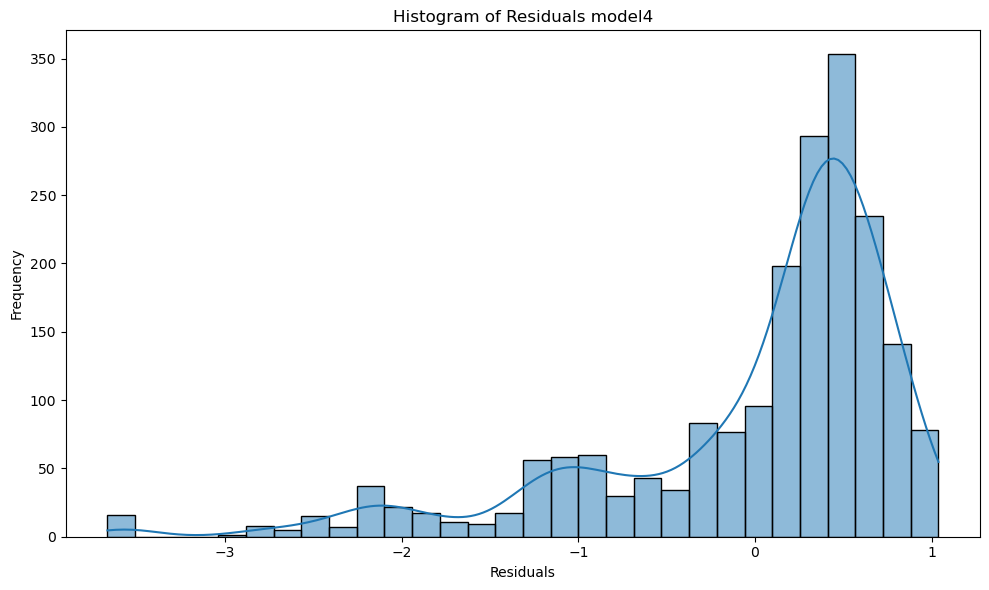

<Figure size 1000x600 with 0 Axes>

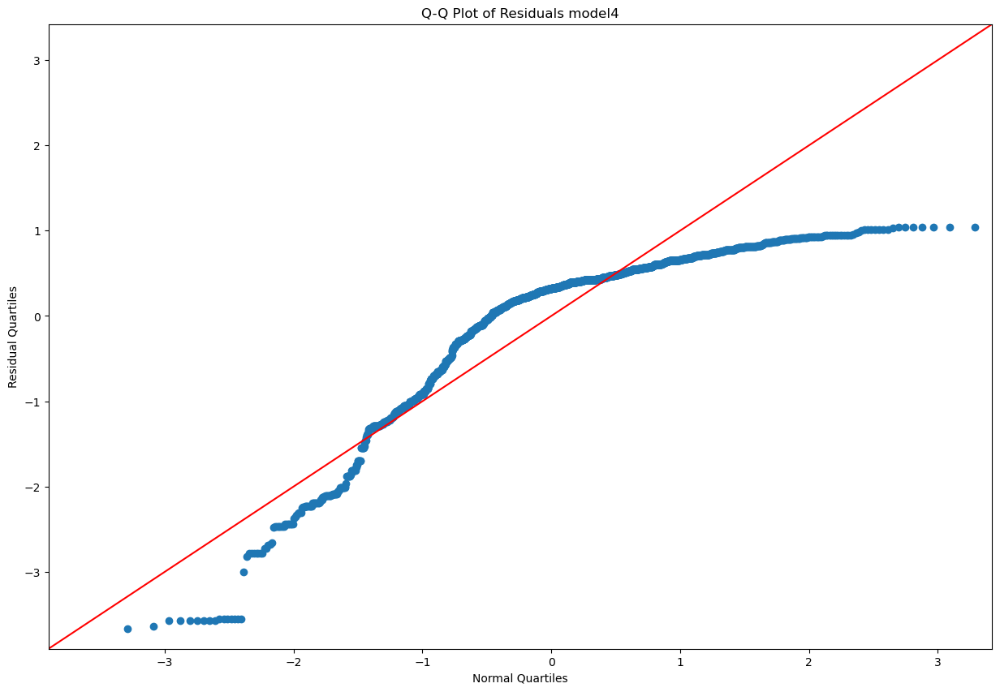

Shapiro-Wilk Test: Stat=0.8172125684992221, p-value=6.442554628346283e-43
Residuals are not normally distributed.


In [41]:
# Calculate the residuals
residuals_model4 = model4.resid

# Plot the residuals
plt.figure(figsize=(10,6))
sns.histplot(residuals_model4, kde=True, bins=30)
plt.title('Histogram of Residuals model4')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Q-Q plot for normality of residuals
plt.figure(figsize=(10, 6))
sm.qqplot(residuals_model4, line ='45')
plt.title('Q-Q Plot of Residuals model4')
plt.ylabel("Residual Quartiles")
plt.xlabel("Normal Quartiles")
plt.show()

# Shapiro-Wilk Test for normality of residuals
stat, p_value = stats.shapiro(residuals_model4)
print(f"Shapiro-Wilk Test: Stat={stat}, p-value={p_value}")

# If p-value < 0.05, it suggests residuals are not normally distributed
if p_value < 0.05:
    print("Residuals are not normally distributed.")
else:
    print("Residuals are normally distributed.")

**Testing model4 for homoscedasticity**

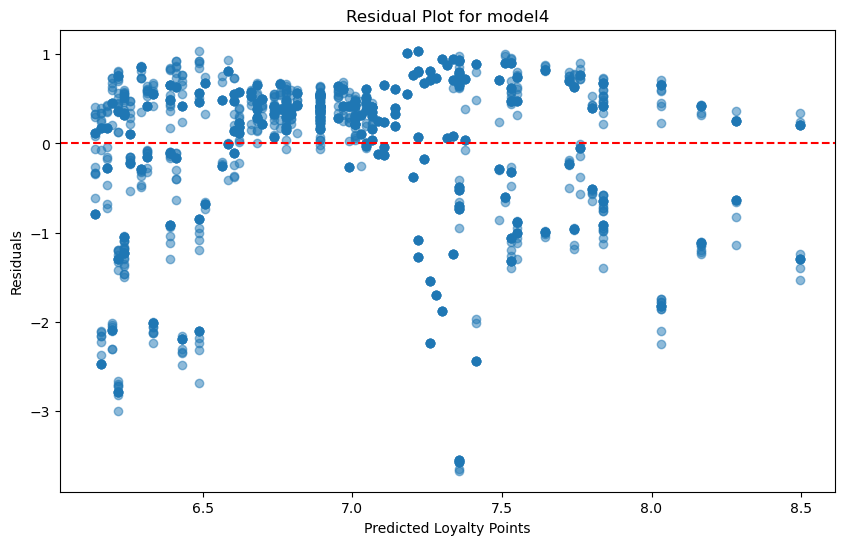

In [42]:
# Residual plot
plt.figure(figsize=(10, 6))
plt.scatter(predicts4, model4.resid, alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--') #adds a horizontal line at y=0 represents the zero residual line
plt.xlabel('Predicted Loyalty Points')
plt.ylabel('Residuals')
plt.title('Residual Plot for model4')
plt.show()

In [43]:
# Run the Breusch-Pagan test function model3
test = sms.het_breuschpagan(model4.resid, model4.model.exog)

# Print the results of the Breusch-Pagan test.
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, test)))

{'LM stat': 0.04764626018016749, 'LM Test p-value': 0.8272107748073636, 'F-stat': 0.047599747894973926, 'F-test p-value': 0.8273160836365927}


Breush-Pagan test for model4 shows a p value >0.05. Therefore, we fail to reject the null and assume homoscedasticity. 

### 6f) age vs loyalty (OLS Method)

**Age v loyalty_points failed to display a linear relationship during EDA above**

In [44]:
# Define independent variable.
X = reviews['age']

# Define dependent variable.
y = reviews['loyalty_points']

# Create model and print summary of metrics.
# Add a constant to the regression model.
X = sm.add_constant(X)

# Fit the model.
model5 = sm.OLS(y, X).fit()

print(model5.summary())


                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     3.606
Date:                Mon, 14 Apr 2025   Prob (F-statistic):             0.0577
Time:                        13:31:17   Log-Likelihood:                -17150.
No. Observations:                2000   AIC:                         3.430e+04
Df Residuals:                    1998   BIC:                         3.431e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1736.5177     88.249     19.678      0.0

- OLS model suggests that age only explains 0.2% of the variance in loyalty_points. 
- The intercept coefficient is significant (p<0.05).
- The slope coefficientis not statiscally significant (p=0.058).

In [45]:
# Extract the estimated parameters.
print("Parameters: ", model5.params)

# Extract the standard errors.
print("Standard errors: ", model5.bse)

# Extract the predicted values.
print("Predicted values: ", model5.predict())

Parameters:  const    1736.517739
age        -4.012805
dtype: float64
Standard errors:  const    88.248731
age       2.113177
dtype: float64
Predicted values:  [1664.2872467  1644.22322095 1648.2360261  ... 1600.0823643  1600.0823643
 1608.1079746 ]


In [46]:
# Set the X coefficient and the constant to generate the regression table.
predicts5 = (1736.5177) + -4.012805 * reviews['age']

# View the output.
predicts5

0       1664.287210
1       1644.223185
2       1648.235990
3       1636.197575
4       1604.095135
           ...     
1995    1588.043915
1996    1563.967085
1997    1600.082330
1998    1600.082330
1999    1608.107940
Name: age, Length: 2000, dtype: float64

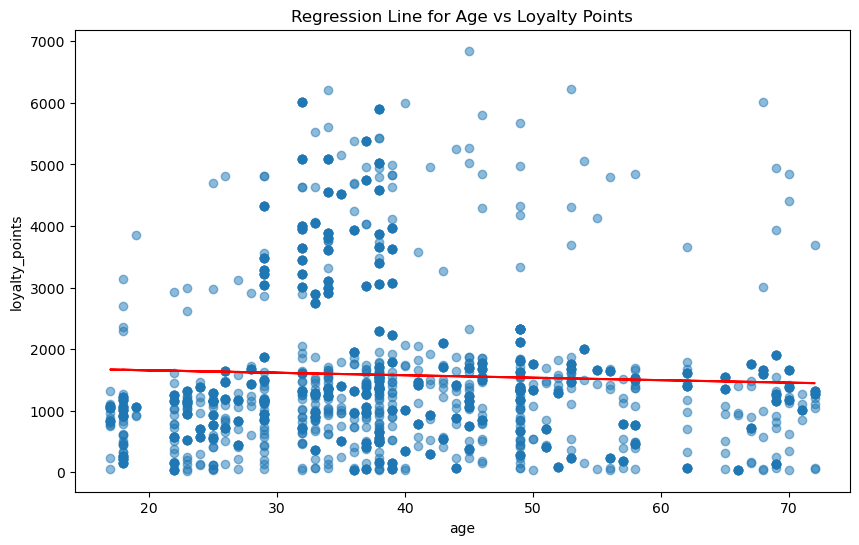

In [47]:
# Plot the graph with a regression line.
plt.figure(figsize=(10, 6))
plt.scatter(reviews['age'], reviews['loyalty_points'], alpha=0.5)
plt.plot(reviews['age'], predicts5, color='red')
plt.xlabel('age')
plt.ylabel('loyalty_points')
plt.title('Regression Line for Age vs Loyalty Points')
plt.show()

Tests for normality of residuals and homscedasticity will not be performed for model5 as there does not appear to be a linear relationship between the two variables

## 7. Multiple Linear Regression X = spending_score, remuneration, y = loyalty_points

### 7a) Using sklearn.LinearRegression

In [48]:
# Define variables.
X = reviews[['spending_score', 'remuneration']]
y = reviews['loyalty_points']

# Call and fit the mutiple linear regression model.
model6lm = LinearRegression()
model6lm.fit(X, y)

LinearRegression()

In [49]:
# Call the predictions for X.
predicts6lm = model6lm.predict(X)
predicts6lm

array([ 4.57831319e-01,  1.38195101e+03, -1.05713790e+03, ...,
        4.44147048e+03,  2.16956070e+03,  1.71137682e+03])

In [50]:
model6_actualvpredicted = pd.DataFrame(columns=['actual_loyalty_points', 'predicted_loyalty_points'])
model6_actualvpredicted ['actual_loyalty_points'] = reviews['loyalty_points']
model6_actualvpredicted ['predicted_loyalty_points'] = predicts6lm
model6_actualvpredicted

,actual_loyalty_points,predicted_loyalty_points
0,210,0.457831
1,524,1381.951008
2,40,-1057.137904
3,562,1278.243418
4,366,89.076904
...,...,...
1995,4031,3439.199307
1996,539,1711.376821
1997,5614,4441.470480
1998,1048,2169.560702


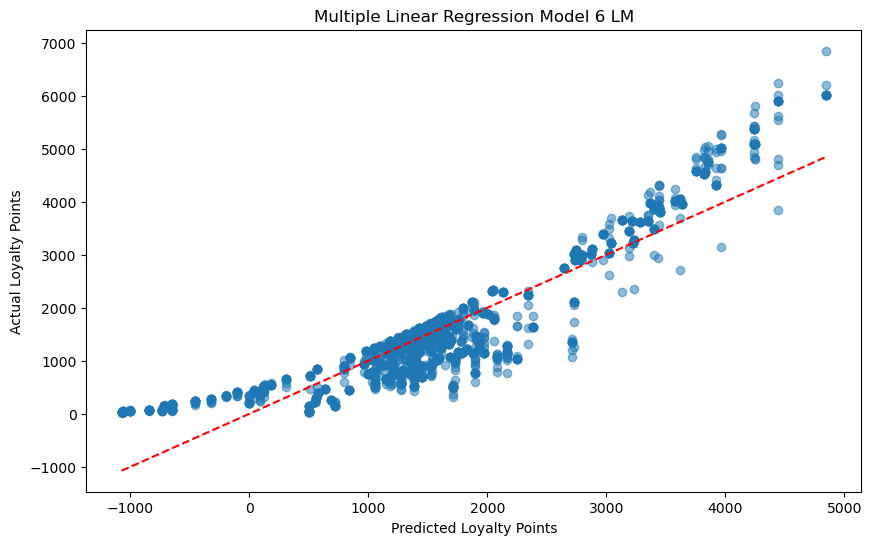

In [51]:
# Plotting the actual vs predicted loyalty points
plt.figure(figsize=(10, 6))

# Scatter plot of actual vs predicted loyalty points (Actual on Y-axis, Predicted on X-axis)
plt.scatter(model6_actualvpredicted['predicted_loyalty_points'], 
            model6_actualvpredicted['actual_loyalty_points'], alpha=0.5)

# Plotting the ideal line (45-degree line, perfect prediction)
plt.plot([model6_actualvpredicted['predicted_loyalty_points'].min(), 
          model6_actualvpredicted['predicted_loyalty_points'].max()],
         [model6_actualvpredicted['predicted_loyalty_points'].min(), 
          model6_actualvpredicted['predicted_loyalty_points'].max()], 
         color='red', linestyle='--')

# Adding labels and title
plt.xlabel('Predicted Loyalty Points')
plt.ylabel('Actual Loyalty Points')
plt.title('Multiple Linear Regression Model 6 LM')

# Show the plot
plt.show()

There's visible scatter around the red line, indicating prediction errors:

- Points above the line represent underestimation (actual values higher than predicted)
- Points below the line represent overestimation (actual values lower than predicted

In [52]:
# Print the R-squared value (coefficient of determination). 

print("R-squared: ", model6lm.score(X,y))  

# Print the intercept.
print("Intercept: ", model6lm.intercept_) 

# Print the coefficients.
print("Coefficients:")
list(zip(X, model6lm.coef_))

R-squared:  0.8269134701989259
Intercept:  -1700.3050970144384
Coefficients:


[('spending_score', 32.892694687821), ('remuneration', 33.97949882180285)]

### 7b) Using statsmodels.OLS

In [53]:
# Fit the OLS model
model6ols = smf.ols('loyalty_points ~ spending_score + remuneration', data=reviews).fit()

# Output model summary
print(model6ols.summary())

                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.827
Model:                            OLS   Adj. R-squared:                  0.827
Method:                 Least Squares   F-statistic:                     4770.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):               0.00
Time:                        13:31:17   Log-Likelihood:                -15398.
No. Observations:                2000   AIC:                         3.080e+04
Df Residuals:                    1997   BIC:                         3.082e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -1700.3051     35.740    -47.

### 7c) Evaluate predictive performance of model6a using statsmodels.OLS

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [55]:
# Add a constant term for OLS model (statsmodels)
X_train_ols = sm.add_constant(X_train)
X_test_ols = sm.add_constant(X_test)

In [56]:
# Training the model using the 'statsmodel' OLS library.

model6aols = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector.
predictions6a_OLS = model6aols.predict(sm.add_constant(X_test_ols)) 

# Call a summary of the OLS model
print("OLS Model Summary:\n", model6aols.summary())

OLS Model Summary:
                             OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     3895.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):               0.00
Time:                        13:31:17   Log-Likelihood:                -12307.
No. Observations:                1600   AIC:                         2.462e+04
Df Residuals:                    1597   BIC:                         2.464e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -1700.323

### 7d) Evaluate predictive performance of model 6a using sklearn.LinearRegression

In [57]:
# Specify the model.
model6alm = LinearRegression()  

# Fit the data to the model.
model6alm.fit(X_train, y_train)

LinearRegression()

In [58]:
predictions6a_LM = model6alm.predict(X_test)

predictions6a_LM

array([ -725.11711735,  2976.65149188,  2644.50590347,  1416.28990278,
        1434.2479047 ,  1535.45165243,   709.53845826,  1358.38381754,
        1577.07452533,  3212.92022784,  1170.66219209,  1588.48826342,
        1589.70563198,  2360.07003078,  1201.63127443,  1582.78139438,
        1642.74224297,   657.71921584,  -106.10091912,  -833.24510268,
        1354.27429082,  -188.12929636,  1754.52233399,  1256.34267501,
        1422.83416662,  1616.64263488,  3855.98127081,  1541.53849524,
        1742.27120111,  1956.16988192,   128.11305348,   859.2893165 ,
        1075.54528717,  1575.01976198,  1484.84977857,  1179.64119305,
         979.28846095,  1756.19712359,  1517.4936505 ,   979.28846095,
        1217.15453924,  1577.07452533,  1440.79216854,  4253.41460309,
        4257.06670877,  -454.98714089,  1575.01976198,  1434.2479047 ,
        1474.65340904,  1468.94654   ,  1548.46273285,   960.11309046,
         796.89373078,  -647.57824059,  1640.30750585,  1527.31004626,
      

Text(0.5, 1.0, 'Evaluation of Model 6a LM')

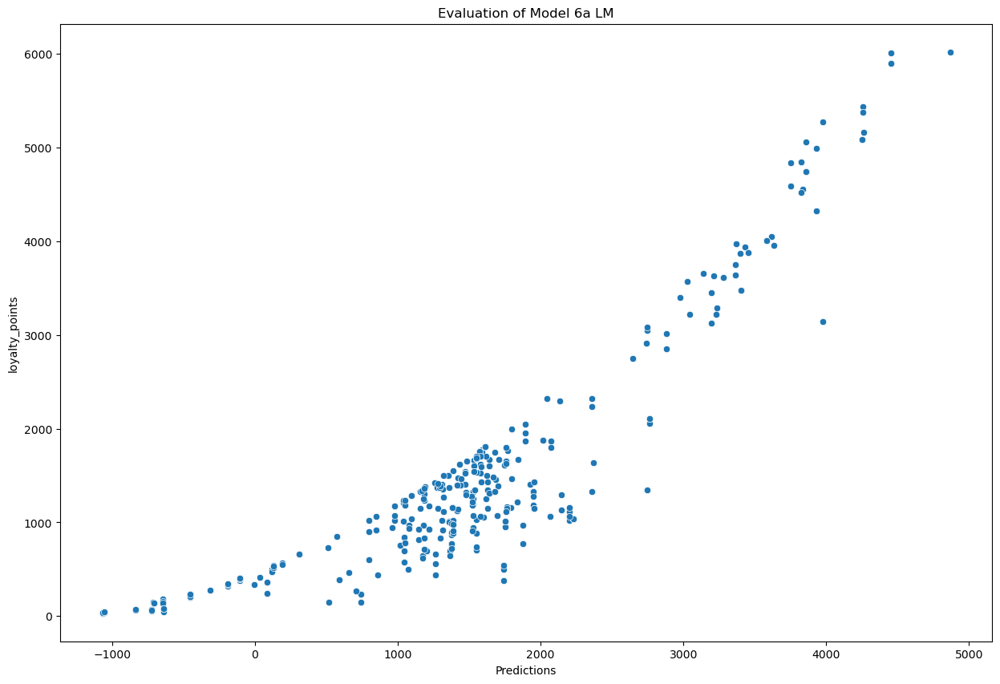

In [59]:
# Plotting the predictions of the Linear Regression Model
sns.scatterplot(x=predictions6a_LM, y=y_test)
plt.xlabel("Predictions")
plt.title("Evaluation of Model 6a LM")

In [60]:
# Compare R-squared values
print("R-squared (OLS model): ", model6aols.rsquared)
print("R-squared (Sklearn LM model): ", model6alm.score(X_test, y_test))

R-squared (OLS model):  0.8298594267896443
R-squared (Sklearn LM model):  0.8144236432529975


In [61]:
# Evaluate performance of OLS model
print("Mean Absolute Error (OLS): ", mean_absolute_error(y_test, predictions6a_OLS))
print("Mean Squared Error (OLS): ", mean_squared_error(y_test, predictions6a_OLS)) 
print("RMSE (OLS): ", math.sqrt(mean_squared_error(y_test, predictions6a_OLS)))

Mean Absolute Error (OLS):  429.6636201690913
Mean Squared Error (OLS):  300944.0917834269
RMSE (OLS):  548.5837144715716


In [62]:
# Evaluate performance of Linear Regression model
print("Mean Absolute Error (LM): ", mean_absolute_error(y_test, predictions6a_LM))
print("Mean Squared Error (LM): ", mean_squared_error(y_test, predictions6a_LM)) 
print("RMSE (LM): ", math.sqrt(mean_squared_error(y_test, predictions6a_LM)))

Mean Absolute Error (LM):  429.6636201690913
Mean Squared Error (LM):  300944.09178342693
RMSE (LM):  548.5837144715717


**Check for normality of residuals**

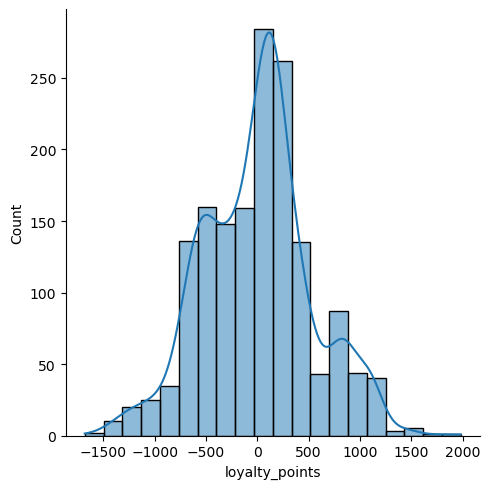

In [63]:
# To properly check for normality of residuals, need to compute residuals based on training data.
predictions_train6a = model6alm.predict(X_train)
residuals_train6a = y_train - predictions_train6a  
sns.displot(residuals_train6a, bins=20, kde=True)

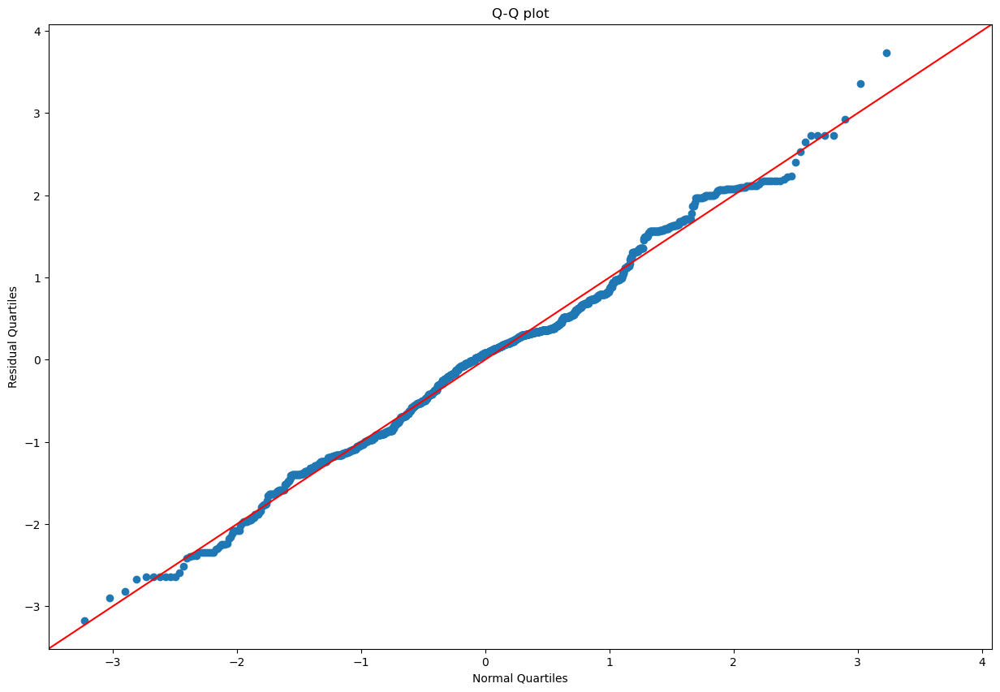

In [64]:
# Plot the quartiles of the residuals versus the quartiles of the N(0,1)
# The fit=True argument first Standardises the observed data (Residuals) before plotting them

sm.qqplot(residuals_train6a, fit=True, line='45')
plt.ylabel("Residual Quartiles")
plt.xlabel("Normal Quartiles")
plt.title("Q-Q plot")
plt.show()

In [65]:
# Shapiro-Wilk test for normality of residuals.

stat, p_value = shapiro(residuals_train6a)
print(f"Shapiro-Wilk Test statistic: {stat}, p-value: {p_value}")

Shapiro-Wilk Test statistic: 0.9906378229868674, p-value: 1.346811344309297e-08


**Check for multicollinearity using  VIF (Variance Inflation Factor)**

In [66]:
# Check for multicollinearity using VIF

# Need to add a constant (intercept) to the independent variables in the training set. This is necessary for calculating VIF.
x_temp = sm.add_constant(X_train) 

# Initializes an empty DataFrame to store VIF values and corresponding features.
vif = pd.DataFrame()

# Uses a list comprehension to calculate the VIF for each independent variable (including the constant) in the training set
vif['VIF Factor'] = [variance_inflation_factor(x_temp.values, i) for i in range(x_temp.shape[1])]

#Adds the feature names to the VIF DataFrame.
vif['features'] = x_temp.columns

# Print VIF values
print(vif.round(1))

   VIF Factor        features
0         8.9           const
1         1.0  spending_score
2         1.0    remuneration


VIF < 10, therefore no multicollinearity.

**Testing model for homoscedasticity**

In [67]:
# Add a constant to X_test for the intercept term (statsmodels requires this)
X_train_with_const = sm.add_constant(X_train)

# Perform the Breusch-Pagan test
bp_test = sms.het_breuschpagan(residuals_train6a, X_train_with_const)

# Print the results of the Breusch-Pagan test.
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, bp_test)))

{'LM stat': 45.093019717503324, 'LM Test p-value': 1.6150098749705804e-10, 'F-stat': 23.156868353555545, 'F-test p-value': 1.219460638513682e-10}


LM test p-value smaller than 0.05. Therefore, residuals are not distributed with equal variance(heteroscedasticity)

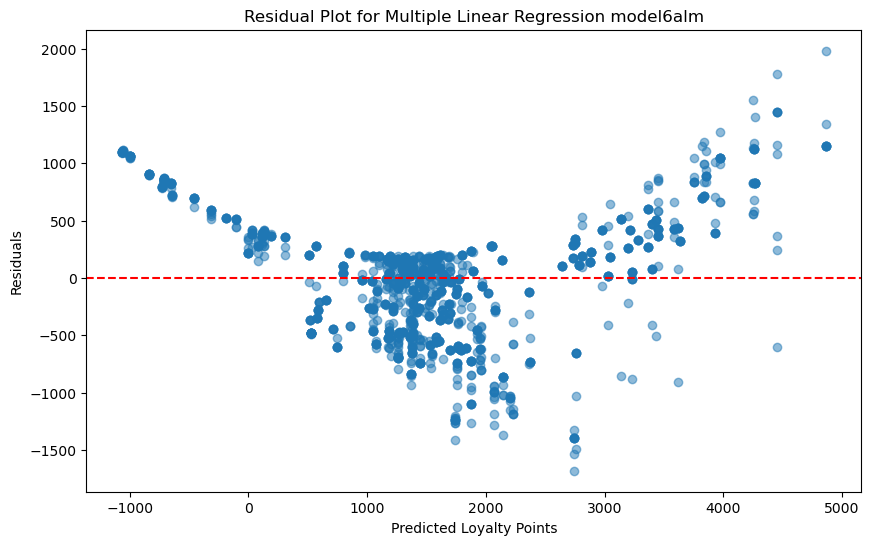

In [68]:
# Plot the residuals
plt.figure(figsize=(10, 6))
plt.scatter(predictions_train6a, residuals_train6a, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')  # Zero line to indicate no residuals
plt.xlabel('Predicted Loyalty Points')
plt.ylabel('Residuals')
plt.title('Residual Plot for Multiple Linear Regression model6alm')
plt.show()

## 8. Multiple Linear Regression X = spending_score, remuneration, y = log_loyalty_points

### 8a) Using sklearn.LinearRegression

In [69]:
# Define variables.
X = reviews[['spending_score', 'remuneration']]
y = reviews['log_loyalty_points']

# Call and fit the mutiple linear regression model using sklearn.
model7lm = LinearRegression()
model7lm.fit(X, y)

LinearRegression()

In [70]:
# Call the predictions for X.
predicts7lm = model7lm.predict(X)
predicts7lm

array([5.83785743, 7.0158427 , 4.93145226, ..., 9.17347463, 7.2040123 ,
       6.84555135])

In [71]:
model7_actualvpredicted = pd.DataFrame(columns=['actual_log_loyalty_points', 'predicted_log_loyalty_points'])
model7_actualvpredicted ['actual_log_loyalty_points'] = reviews['log_loyalty_points']
model7_actualvpredicted ['predicted_log_loyalty_points'] = predicts7lm
model7_actualvpredicted

,actual_log_loyalty_points,predicted_log_loyalty_points
0,5.347108,5.837857
1,6.261492,7.015843
2,3.688879,4.931452
3,6.331502,6.922808
4,5.902633,5.904214
...,...,...
1995,8.301770,8.364888
1996,6.289716,6.845551
1997,8.633019,9.173475
1998,6.954639,7.204012


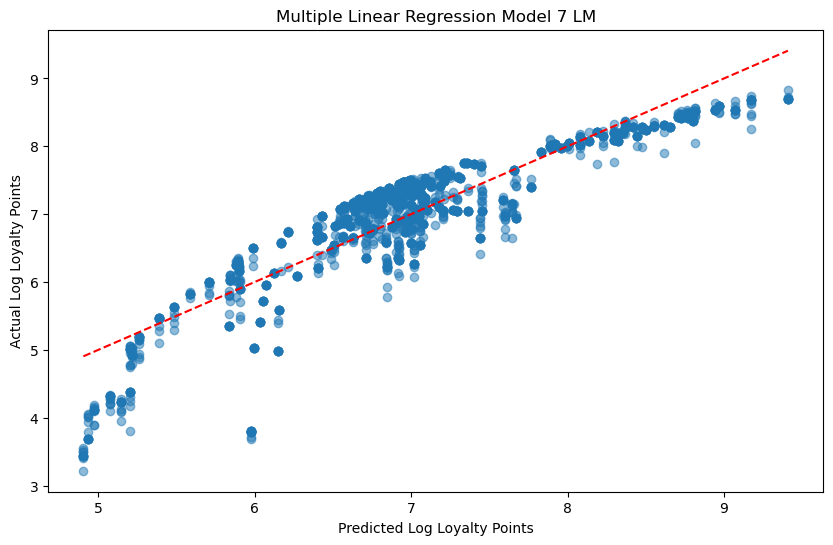

In [72]:
# Plotting the actual vs predicted loyalty points
plt.figure(figsize=(10, 6))

# Scatter plot of actual vs predicted loyalty points (Actual on Y-axis, Predicted on X-axis)
plt.scatter(model7_actualvpredicted['predicted_log_loyalty_points'], 
            model7_actualvpredicted['actual_log_loyalty_points'], alpha=0.5)

# Plotting the ideal line (45-degree line, perfect prediction)
plt.plot([model7_actualvpredicted['predicted_log_loyalty_points'].min(), 
          model7_actualvpredicted['predicted_log_loyalty_points'].max()],
         [model7_actualvpredicted['predicted_log_loyalty_points'].min(), 
          model7_actualvpredicted['predicted_log_loyalty_points'].max()], 
         color='red', linestyle='--')

# Adding labels and title
plt.xlabel('Predicted Log Loyalty Points')
plt.ylabel('Actual Log Loyalty Points')
plt.title('Multiple Linear Regression Model 7 LM')

# Show the plot
plt.show()

In [73]:
# Print the R-squared value (coefficient of determination). 

print("R-squared: ", model7lm.score(X,y))  

# Print the intercept.
print("Intercept: ", model7lm.intercept_) 

# Print the coefficients.
print("Coefficients:")
list(zip(X, model7lm.coef_))

R-squared:  0.7988505988825918
Intercept:  4.456693665767278
Coefficients:


[('spending_score', 0.028047268432936825),
 ('remuneration', 0.023359373384854522)]

### 8b) Using statsmodels.OLS

In [74]:
# Fit the OLS model
model7ols = smf.ols('log_loyalty_points ~ spending_score + remuneration', data=reviews).fit()

# Output model summary
print(model7ols.summary())

                            OLS Regression Results                            
Dep. Variable:     log_loyalty_points   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     3965.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):               0.00
Time:                        13:31:18   Log-Likelihood:                -1274.2
No. Observations:                2000   AIC:                             2554.
Df Residuals:                    1997   BIC:                             2571.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          4.4567      0.031    145.

### 8c) Evaluate predictive performance of model 7a using stasmodels.OLS

In [75]:
# Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [76]:
# Add a constant term for OLS model (statsmodels)
X_train_ols = sm.add_constant(X_train)
X_test_ols = sm.add_constant(X_test)

In [77]:
# Train the OLS model using statsmodels
model7aols = sm.OLS(y_train, X_train_ols).fit()

In [78]:
# Set the predicted response vector for OLS model
predictions7a_OLS = model7aols.predict(X_test_ols)

In [79]:
# Call a summary of the OLS model
print("OLS Model Summary:\n", model7aols.summary())

OLS Model Summary:
                             OLS Regression Results                            
Dep. Variable:     log_loyalty_points   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     3102.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):               0.00
Time:                        13:31:18   Log-Likelihood:                -1048.6
No. Observations:                1600   AIC:                             2103.
Df Residuals:                    1597   BIC:                             2119.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              4.442

### 8d) Evaluate predictive performance of model 7a using sklearn.LinearRegression

In [80]:
# Train the Linear Regression model using sklearn
model7alm = LinearRegression()
model7alm.fit(X_train, y_train)

LinearRegression()

In [81]:
# Predict with the Linear Regression model
predictions7a_LM = model7alm.predict(X_test)

predictions7a_LM

array([5.12879945, 8.08396964, 7.82778697, 6.81587889, 6.85264873,
       6.9827952 , 6.13950134, 6.96706853, 7.02948352, 8.33652218,
       6.69830914, 6.97578082, 6.939737  , 7.43807356, 6.49196474,
       7.00263217, 6.93272262, 6.11047191, 5.7026079 , 5.06154814,
       6.80450836, 5.57318745, 6.89184249, 6.71959815, 6.90635143,
       6.99489176, 8.7668814 , 6.80257614, 6.8282213 , 7.45887087,
       5.87388036, 6.25344097, 6.3879436 , 6.94820344, 6.91772197,
       6.71669406, 6.53768118, 7.12649029, 6.94602537, 6.53768118,
       6.60082221, 7.02948352, 6.94312127, 9.07967087, 8.97153944,
       5.37361158, 6.94820344, 6.85264873, 6.93538086, 6.96223221,
       6.73968097, 6.53695516, 6.39543815, 5.24902745, 7.00481024,
       7.08173418, 5.98007958, 8.81647382, 6.73968097, 8.30120439,
       6.78467139, 6.94602537, 6.77475291, 6.85264873, 7.18842512,
       6.71161189, 8.2970941 , 6.13176093, 7.17463066, 7.17317861,
       6.7924118 , 8.80582931, 8.97153944, 6.53768118, 8.45191

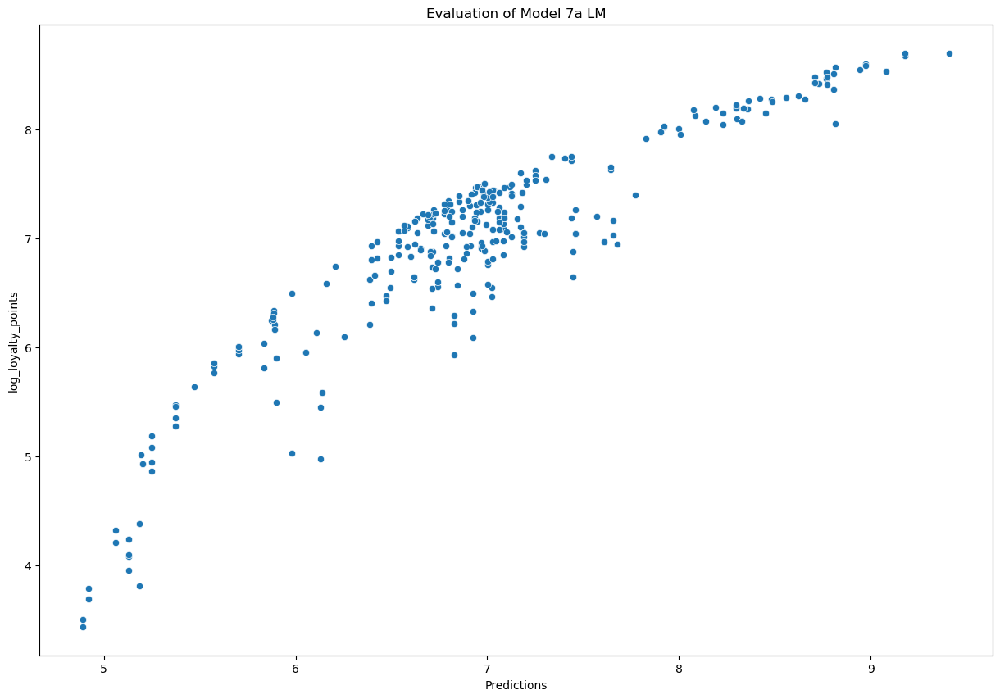

In [82]:
# Plotting the predictions of the Linear Regression model
sns.scatterplot(x=predictions7a_LM, y=y_test)
plt.xlabel("Predictions")
plt.title("Evaluation of Model 7a LM")
plt.show()

In [83]:
# Compare R-squared values
print("R-squared (OLS model): ", model7aols.rsquared)
print("R-squared (Sklearn LM model): ", model7alm.score(X_test, y_test))

R-squared (OLS model):  0.7952860387636151
R-squared (Sklearn LM model):  0.8142573833960147


In [84]:
# Evaluate performance of OLS model
print("Mean Absolute Error (OLS): ", mean_absolute_error(y_test, predictions7a_OLS))
print("Mean Squared Error (OLS): ", mean_squared_error(y_test, predictions7a_OLS)) 
print("RMSE (OLS): ", math.sqrt(mean_squared_error(y_test, predictions7a_OLS)))

Mean Absolute Error (OLS):  0.33996151779891304
Mean Squared Error (OLS):  0.17845375504696245
RMSE (OLS):  0.42243787122719295


In [85]:
# Evaluate performance of Linear Regression model
print("Mean Absolute Error (LM): ", mean_absolute_error(y_test, predictions7a_LM))
print("Mean Squared Error (LM): ", mean_squared_error(y_test, predictions7a_LM)) 
print("RMSE (LM): ", math.sqrt(mean_squared_error(y_test, predictions7a_LM)))

Mean Absolute Error (LM):  0.33996151779891276
Mean Squared Error (LM):  0.17845375504696243
RMSE (LM):  0.4224378712271929


**Check for normality of residuals**

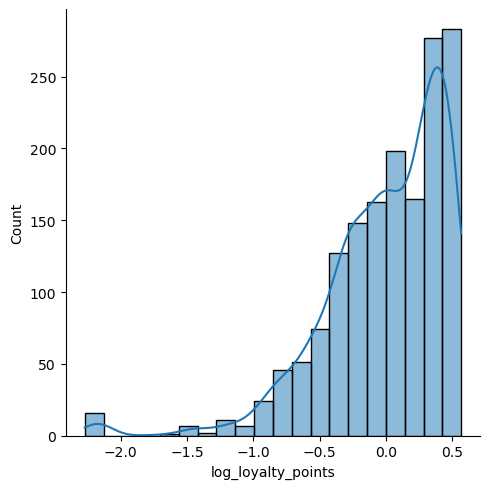

In [86]:
# To properly check for normality of residuals, need to compute residuals based on training data.
predictions_train7a = model7alm.predict(X_train)
residuals_train7a = y_train - predictions_train7a 
sns.displot(residuals_train7a, bins=20, kde=True)

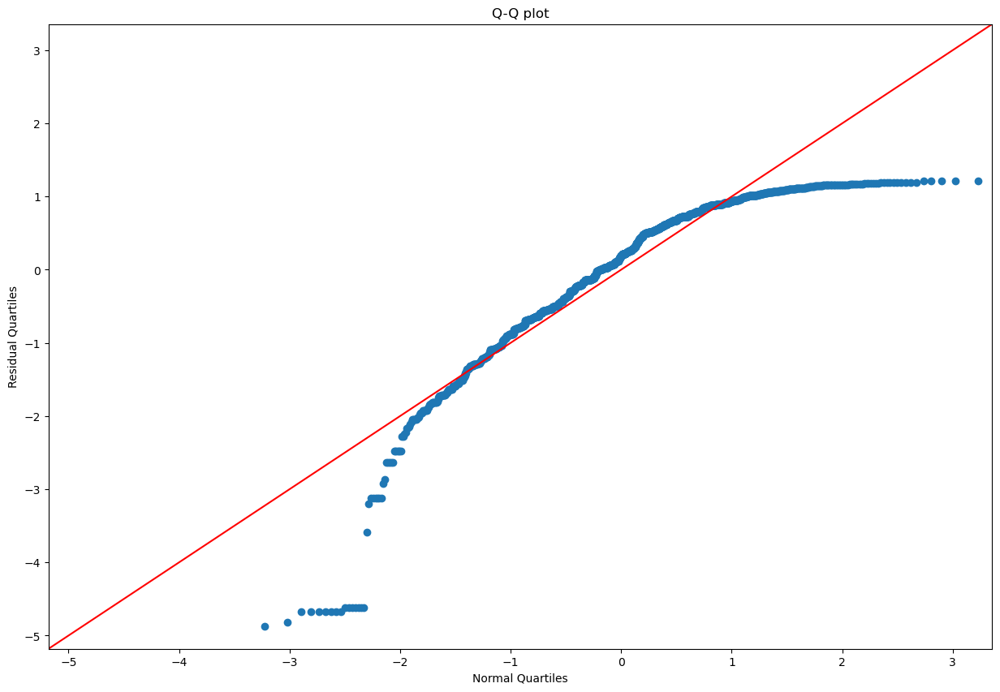

In [87]:
# Plot the quartiles of the residuals versus the quartiles of the N(0,1)
# The fit=True argument first Standardises the observed data (Residuals) before plotting them

sm.qqplot(residuals_train7a, fit=True, line='45')
plt.ylabel("Residual Quartiles")
plt.xlabel("Normal Quartiles")
plt.title("Q-Q plot")
plt.show()

In [88]:
# Shapiro-Wilk test for normality of residuals.

stat, p_value = shapiro(residuals_train7a)
print(f"Shapiro-Wilk Test statistic: {stat}, p-value: {p_value}")

Shapiro-Wilk Test statistic: 0.880899836712261, p-value: 2.3679183349846463e-33


**Check for multicollinearity using VIF (Variance Inflation Factor)**

In [89]:
# Check for multicollinearity using VIF

# Need to add a constant (intercept) to the independent variables in the training set. This is necessary for calculating VIF.
x_temp = sm.add_constant(X_train) 

# Initializes an empty DataFrame to store VIF values and corresponding features.
vif = pd.DataFrame()

# Uses a list comprehension to calculate the VIF for each independent variable (including the constant) in the training set
vif['VIF Factor'] = [variance_inflation_factor(x_temp.values, i) for i in range(x_temp.shape[1])]

#Adds the feature names to the VIF DataFrame.
vif['features'] = x_temp.columns

# Print VIF values
print(vif.round(1))

   VIF Factor        features
0         8.9           const
1         1.0  spending_score
2         1.0    remuneration


**Testing model for homoscedasticity**

In [90]:
# Add a constant to X_test for the intercept term (statsmodels requires this)
X_train_with_const = sm.add_constant(X_train)

# Perform the Breusch-Pagan test
bp_test = sms.het_breuschpagan(residuals_train7a, X_train_with_const)

# Print the results of the Breusch-Pagan test.
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, bp_test)))

{'LM stat': 128.6311708904808, 'LM Test p-value': 1.169758314412158e-28, 'F-stat': 69.80709929692534, 'F-test p-value': 8.626856148576087e-30}


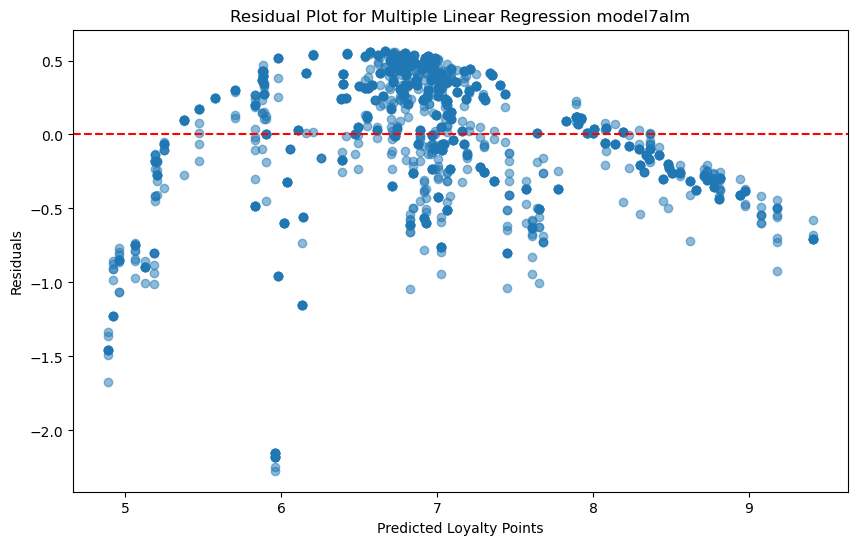

In [91]:
# Plot the residuals
plt.figure(figsize=(10, 6))
plt.scatter(predictions_train7a, residuals_train7a, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')  # Zero line to indicate no residuals
plt.xlabel('Predicted Loyalty Points')
plt.ylabel('Residuals')
plt.title('Residual Plot for Multiple Linear Regression model7alm')
plt.show()

## 9. Discuss Insights and observations

**Key Findings from Exploratory Data Analysis and Linear Regression Models**

**Strong Linear Relationships Identified:**
- spending_score and remuneration demonstrated significant positive linear relationships with loyalty_points, with correlation coefficients of 0.6723 and 0.6161, respectively.
- 
**age Not a Significant Predictor:**
- There was no significant linear relationship between age and loyalty_points.
- model5 (loyalty_points ~ age) explained only 0.2% of the variance in loyalty points, indicating very poor predictive power.
  
**Distribution of Loyalty Points:**
- The distribution is right-skewed, whereas Turtle Games would ideally prefer a left-skewed distribution.
- While normality of the dependent variable is not required for linear regression, residuals must be normally distributed for valid hypothesis testing and confidence intervals.

**Heteroskedasticity Concerns:**
- The right skew also raises concerns about heteroskedasticity, which can lead to:
    - Inefficient coefficient estimates
    - Incorrect standard errors
    - Invalid confidence intervals
    - Poor model fit and reduced predictive accuracy
      
**Model Residuals and Transformations:**
- All models exhibited signs of heteroskedasticity (except model4), and residuals were not normally distributed.
- Based on the results of model1 (loyalty_points ~ spending_score), a decision was made to apply a log transformation to the dependent variable for the following reasons:
1) loyalty_points were not normally distributed (positive skew).
2) model1 residuals were not normally distributed.
3) Clear evidence of heteroskedasticity.
   
**Effectiveness of Log Transformation:**
- The log-transformed loyalty_points variable had a distribution much closer to normal.
- The Shapiro-Wilk statistic improved from 0.84 to ~0.90 (closer to 1), indicating increased normality.
- Despite the transformation, the p-value (~1.23e-33) still indicated significant departure from normality.
- Heteroskedasticity was notably reduced.
  
**model2 (log_Loyalty_Points ~ spending_score):**
- spending_score explained 52% of the variation in the log-transformed loyalty points.
- Both predictors had statistically significant p-values (p = 0.000).
- The model interprets changes in spending_score as percentage changes in loyalty_points, rather than absolute changes.
- However, residuals remained autocorrelated (as indicated by the Durbin-Watson test), and heteroskedasticity persisted.
  
**model3 (loyalty_points ~ remuneration):**
The regression line showed a poor fit, especially at higher remuneration values, again indicating heteroskedasticity.

**model4 (log_loyalty_points ~ remuneration):**
- remuneration explained approximately 28.4% of the variation in the log-transformed loyalty_points.
- The Breusch-Pagan test yielded a p-value > 0.05, suggesting no significant heteroskedasticity (i.e., homoscedasticity assumed).
- 
**Multiple Regression Models:**
- model6 (loyalty_points ~ spending_score + remuneration) produced some negative predicted values for loyalty_points when applied to test data, which is not meaningful from a business standpoint. 
- Possible causes:
    - Extrapolation outside the training data range
    - Poor model fit
    - Large negative intercept (-1700.32)

**model7 (log_Loyalty_points ~ spending_score + remuneration) was deemed more appropriate for several reasons:**
- Log transformation prevents negative predictions, ensuring that when transformed back to the original scale, all predicted loyalty_points are positive.
- **Business logic alignment:** Negative loyalty_points are not valid; customers either have zero or a positive number of points.
- **Distribution normalization:** Loyalty programs typically show a right-skewed distribution, which the log transformation helps normalize.
- **More intuitive interpretation:** The log model enables interpretation in terms of percentage changes, which is more meaningful for stakeholders.

**Multicollinearity:**
- Variance Inflation Factor (VIF) results for both multiple regression models indicated no concerns with multicollinearity.


# Week 2 assignment: Exploring the structure using decision trees

The team wants you to use decision trees to attempt to better understand the structure found in the data. You need to grow and prune a decision tree regressor and then visualise and interpret the output.
Make sure to comment on the potential usefulness in decision-making processes and your observations regarding the model.

**Instructions**
1. Prepare the data for creating your decision tree. 
    1. Import the CSV file you have prepared in Week 1.
    2. Create a new DataFrame with the appropriate columns.
        1. Specify that loyalty points is the target variable (Y) and should be excluded from your input data.
        2. Specify X for the independent variables and y as the dependent variable. Therefore, df\[cols\] will be the independent variables and the column containing loyalty points the dependent variable.
        3. Explore the new DataFrame. 
2. Split the data set into a train and test sets for both X and y at a 70:30 ratio. As previously, random_state=42.
3. Create a decision tree regressor to explore the impact of other features on the loyalty points.
    1. Import the DecisionTreeRegressor class from the sklearn.tree library. 
    2. Create a variable (e.g. regressor) to store the DecisionTreeRegressor() class. (As previously, random_state=42.).
    3. Fit the regressor object to the data set with the fit() function.
    4. Remember to prune your tree using basic pruning strategies and compare the performance before and after applying the pruning strategy.
    5. Plot the final decision tree.
4. Fit a final model and interpret the output.
    1. Justify your selection of pruning strategy implemented and interpret the output.
    2. Evaluate the usefulness of the obtained result and interpret the tree and how it could be used to inform business decisions in the organisation.
5. Summarise (150–200 words) the most important business insights, anything you would like to explore further, and suggested future actions.
 
Back up your work to a safe location. This will allow you to revert to a previous state in the case of making a mistake in the code or deleting a section by mistake. (A simple way of doing this is to save or email a compressed version to yourself at frequent intervals.)


## 1. Load and prepare the data

In [92]:
# Create new DataFrame.

df2 = pd.read_csv('reviews.csv')
#df2.head()
df2.tail()

,gender,age,remuneration,spending_score,loyalty_points,education,product,review,summary
1995,Female,37,84.46,69,4031,PhD,977,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Female,43,92.66,8,539,PhD,979,Great game. Did not think I would like it whe...,Super fun
1997,Male,34,92.66,91,5614,graduate,1012,Great game for all.........\nKeeps the mind ni...,Great Game
1998,Male,34,98.40,16,1048,PhD,1031,fun game!,Four Stars
1999,Male,32,92.66,8,479,PhD,453,This game is fun. A lot like scrabble without ...,Love this game


In [93]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   remuneration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   product         2000 non-null   int64  
 7   review          2000 non-null   object 
 8   summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 140.8+ KB


In [94]:
df2.drop(columns=['product', 'review', 'summary'], inplace=True)
df2

,gender,age,remuneration,spending_score,loyalty_points,education
0,Male,18,12.30,39,210,graduate
1,Male,23,12.30,81,524,graduate
2,Female,22,13.12,6,40,graduate
3,Female,25,13.12,77,562,graduate
4,Female,33,13.94,40,366,graduate
...,...,...,...,...,...,...
1995,Female,37,84.46,69,4031,PhD
1996,Female,43,92.66,8,539,PhD
1997,Male,34,92.66,91,5614,graduate
1998,Male,34,98.40,16,1048,PhD


In [95]:
df2['education'].value_counts()

education
graduate        900
PhD             460
postgraduate    400
diploma         190
Basic            50
Name: count, dtype: int64

In [96]:
# Combine 'Basic' and 'Diploma' into one category
df2['education'] = df2['education'].replace({'Basic': 'low', 'diploma': 'low'})

In [97]:
# Create a class and write a user-defined function.
class MyLabelEncoder(LabelEncoder):
    """
    A custom LabelEncoder that overrides the default `fit` method
    to use the order of unique values as they appear in the input.

    This differs from the standard LabelEncoder, which sorts the
    classes alphabetically.

    Attributes
    ----------
    classes_ : ndarray of shape (n_classes,)
        Holds the label for each class.
    """

    def fit(self, y):
        """
        Fit label encoder by finding unique classes in the input `y`,
        preserving the order of first appearance.

        Parameters
        ----------
        y : array-like of shape (n_samples,)
            Target values.

        Returns
        -------
        self : object
            Fitted label encoder.
        """
        # Ensure y is a 1D array-like structure
        y = column_or_1d(y, warn=True)

        # Get unique labels in the order they appear
        self.classes_ = pd.Series(y).unique()

        return self

# Order lists of the values for the education column.
Edu_order = ['low', 'graduate', 'postgraduate', 'uni', 'PhD']

# Create an instance of MyLabelEncoder.
le = MyLabelEncoder()

# Fit the encoder with the ordered values.
le.fit(Edu_order)

# Apply the LabelEncoder to the Edu column in the DataFrame.
df2['education'] = df2['education'].apply(lambda x: x if x in Edu_order else 'low')
df2['education'] = le.transform(df2['education'])

# View the DataFrame
print(df2.head())

   gender  age  remuneration  spending_score  loyalty_points  education
0    Male   18         12.30              39             210          1
1    Male   23         12.30              81             524          1
2  Female   22         13.12               6              40          1
3  Female   25         13.12              77             562          1
4  Female   33         13.94              40             366          1


In [98]:
df2= pd.get_dummies(df2, columns=['gender'], drop_first=True) 
# if we have columns that is binary, we can just say yes/no (in one column).

In [99]:
df2

,age,remuneration,spending_score,loyalty_points,education,gender_Male
0,18,12.30,39,210,1,True
1,23,12.30,81,524,1,True
2,22,13.12,6,40,1,False
3,25,13.12,77,562,1,False
4,33,13.94,40,366,1,False
...,...,...,...,...,...,...
1995,37,84.46,69,4031,4,False
1996,43,92.66,8,539,4,False
1997,34,92.66,91,5614,1,True
1998,34,98.40,16,1048,4,True


- Standardisation is not necessary for a Decision Tree Regressor because it does not use distance-based calculations.
- Even when comparing with Random Forest Regressor, there is no need to standardise numerical features.
- Tree-based models do not require standardisation of numerical features.


In [100]:
print(df2.isnull().sum())

age               0
remuneration      0
spending_score    0
loyalty_points    0
education         0
gender_Male       0
dtype: int64


In [101]:
# Specify Y.
y = df2['loyalty_points']

# Specify X.
X = df2.drop('loyalty_points', axis=1)

In [102]:
# Review X and Y.
X

,age,remuneration,spending_score,education,gender_Male
0,18,12.30,39,1,True
1,23,12.30,81,1,True
2,22,13.12,6,1,False
3,25,13.12,77,1,False
4,33,13.94,40,1,False
...,...,...,...,...,...
1995,37,84.46,69,4,False
1996,43,92.66,8,4,False
1997,34,92.66,91,1,True
1998,34,98.40,16,4,True


In [103]:
y

0        210
1        524
2         40
3        562
4        366
        ... 
1995    4031
1996     539
1997    5614
1998    1048
1999     479
Name: loyalty_points, Length: 2000, dtype: int64

In [104]:
# keep the name of the X columns to use later.
feature_cols = [c for c in X.columns]
feature_cols

['age', 'remuneration', 'spending_score', 'education', 'gender_Male']

## 2. Create train and test data sets

In [105]:
# Split the data into test and train data.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## 3. Create Decision tree regressor

In [106]:
# Create decision tree regressor.
dtr = DecisionTreeRegressor(random_state=42)

# Train Decision Tree Regressor
dtr.fit(X_train, y_train)

# Predict loyalty_points for full tree
y_pred_full_train = dtr.predict(X_train) # Training set predictions
y_pred_full_test = dtr.predict(X_test) # Test set predictions 

In [107]:
# Calculate Training and Test Errors for Full Tree (dtr)

mse_full_train = mean_squared_error(y_train, y_pred_full_train) # Training error (MSE)
mse_full_test = mean_squared_error(y_test, y_pred_full_test) # Test error (MSE)

mae_full_train = mean_absolute_error(y_train, y_pred_full_train) # Training error (MAE)
mae_full_test = mean_absolute_error(y_test, y_pred_full_test) # Test error (MAE)

rmse_full_train = mean_squared_error(y_train, y_pred_full_train, squared=False) # Training error (RMSE)
rmse_full_test = mean_squared_error(y_test, y_pred_full_test, squared=False) # Test error (RMSE)

r2_full_train = r2_score(y_train, y_pred_full_train) # Training R²
r2_full_test = r2_score(y_test, y_pred_full_test) # Test R²

# Output the results for  full tree
print("Full Tree - Training Error (MSE):", mse_full_train)
print("Full Tree - Test Error (MSE):", mse_full_test)
print("Full Tree - Training Error (MAE):", mae_full_train)
print("Full Tree - Test Error (MAE):", mae_full_test)
print("Full Tree - Training Error (RMSE):", rmse_full_train)
print("Full Tree - Test Error (RMSE):", rmse_full_test)
print("Full Tree - Training R²:", r2_full_train)
print("Full Tree - Test R²:", r2_full_test)

Full Tree - Training Error (MSE): 0.0
Full Tree - Test Error (MSE): 8431.62
Full Tree - Training Error (MAE): 0.0
Full Tree - Test Error (MAE): 31.636666666666667
Full Tree - Training Error (RMSE): 0.0
Full Tree - Test Error (RMSE): 91.82385311018048
Full Tree - Training R²: 1.0
Full Tree - Test R²: 0.9947946438509497


**Signs of overfitting evident:**

- Training errors are zero for MSE, MAE and RMSE.
- Test errors much higher than training errors which suggests that while the training data fits very well, it struggles to generalise to new data.
- A deep, full tree - captures too many small patterns in the data (often noise).

In [108]:
# Get the max depth of the tree
max_depth = dtr.get_depth()

# Display the max depth
print("Max depth of the decision tree:", max_depth)

Max depth of the decision tree: 22


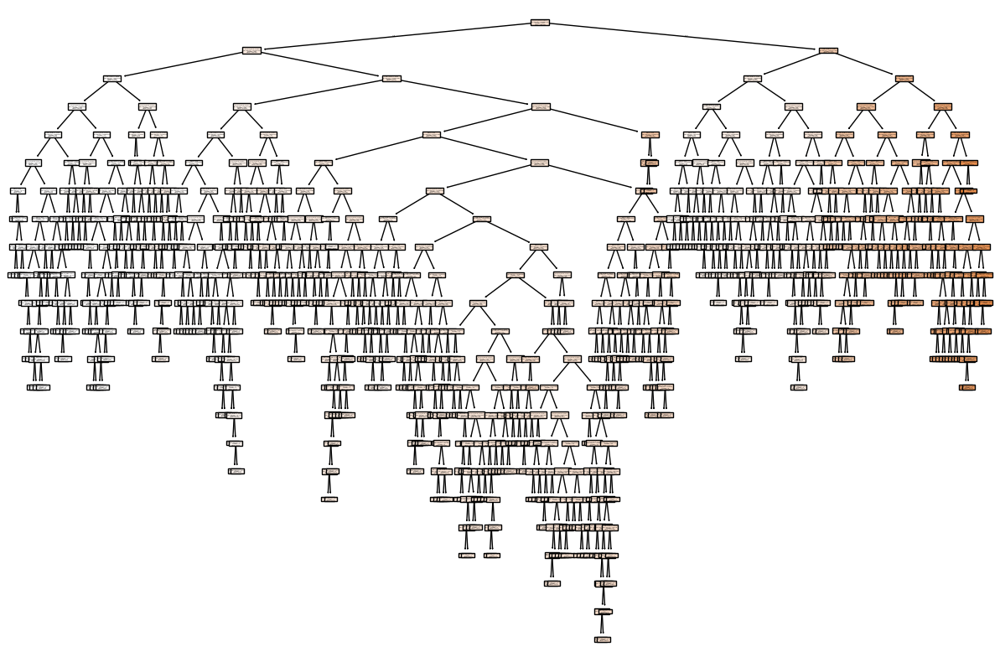

In [109]:
# Visualize the decision tree

plt.figure(figsize=(15, 10))
plot_tree(dtr, feature_names=feature_cols, filled=True)
plt.show()

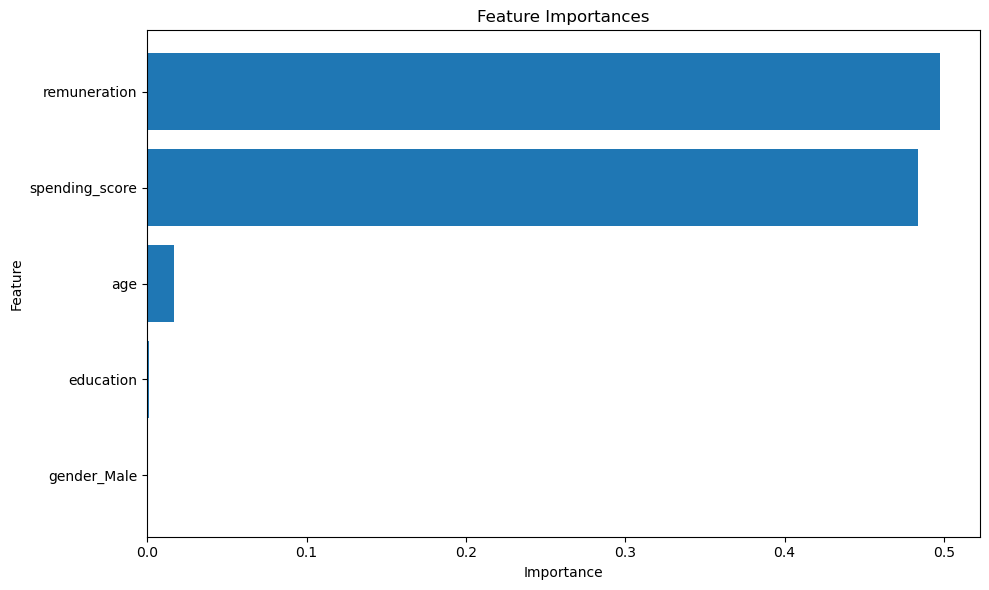

In [110]:
#Extract feature importances
feature_importances = dtr.feature_importances_

#Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_cols, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)

#Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

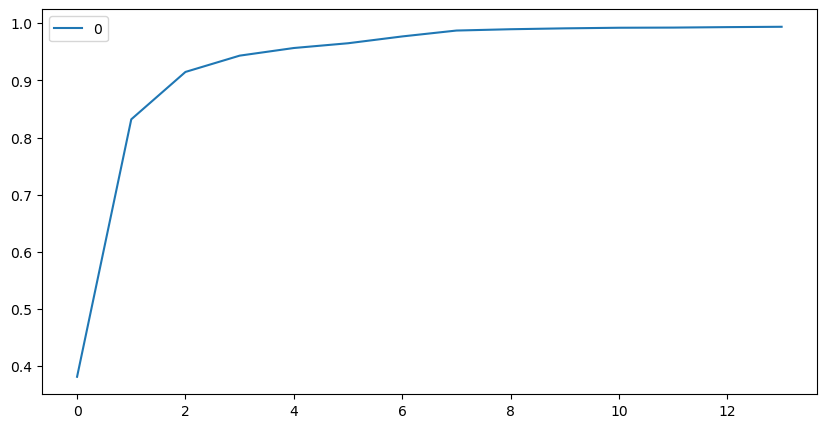

In [111]:
# Determine the optimal value for max depth, then prune the decision tree
# One approach often applied is to look at a range of values for the parameter under investigation

# List of values to try for max_depth:
max_depth_range = list(range(1, 15))

# have a loop that fits decision trees for different 'max_depth', and calculate/store the accuracy of each tree
accuracy = []
for depth in max_depth_range:    
    dtr2 = DecisionTreeRegressor(max_depth = depth, random_state = 42)
    dtr2.fit(X_train, y_train)
    score = dtr2.score(X_test, y_test)
    accuracy.append(score)
    
# Plot accuracy values across the range of depth values evaluated
plt.rcParams['figure.figsize'] = [10, 5]
accuracy = pd.DataFrame(accuracy)
accuracy.plot()
plt.show()

Based on the plot, the optimal max_depth appears to be around 5-6.
Looking at the accuracy curve, there's a steep improvement in performance as max_depth increases from 1 to about 5, after which the curve begins to flatten.

## 4. Fit and plot final model.

In [112]:
# Create new X vector and y, with reduced number of columns
feature_cols = ['remuneration','spending_score', 'age']

X_train_reduced = X_train[feature_cols]
X_test_reduced = X_test[feature_cols]

In [113]:
# Pruned model (with max_depth)

# Create decision tree regressor.
dtr_pruned = DecisionTreeRegressor(max_depth=14, random_state=42)

# Train Decision Tree Regressor
dtr_pruned.fit(X_train_reduced, y_train)

DecisionTreeRegressor(max_depth=14, random_state=42)

In [114]:
# Make predictions for pruned tree.

y_pred_pruned_train = dtr_pruned.predict(X_train_reduced)
y_pred_pruned_test = dtr_pruned.predict(X_test_reduced)

In [115]:
# Calculate Training and Test Errors for pruned Tree (dtr_pruned)

mse_pruned_train = mean_squared_error(y_train, y_pred_pruned_train) # Training error (MSE)
mse_pruned_test = mean_squared_error(y_test, y_pred_pruned_test) # Test error (MSE)

mae_pruned_train = mean_absolute_error(y_train, y_pred_pruned_train) # Training error (MAE)
mae_pruned_test = mean_absolute_error(y_test, y_pred_pruned_test) # Test error (MAE)

rmse_pruned_train = mean_squared_error(y_train, y_pred_pruned_train, squared=False) # Training error (RMSE)
rmse_pruned_test = mean_squared_error(y_test, y_pred_pruned_test, squared=False) # Test error (RMSE)

r2_pruned_train = r2_score(y_train, y_pred_pruned_train) # Training R²
r2_pruned_test = r2_score(y_test, y_pred_pruned_test) # Test R²

# Output the results for pruned tree
print("Pruned Tree - Training Error (MSE):", mse_pruned_train)
print("Pruned Tree - Test Error (MSE):", mse_pruned_test)
print("Pruned Tree - Training Error (MAE):", mae_pruned_train)
print("Pruned Tree - Test Error (MAE):", mae_pruned_test)
print("Pruned Tree - Training Error (RMSE):", rmse_pruned_train)
print("Pruned Tree - Test Error (RMSE):", rmse_pruned_test)
print("Pruned Tree - Training R²:", r2_pruned_train)
print("Pruned Tree - Test R²:", r2_pruned_test)

Pruned Tree - Training Error (MSE): 1108.7726715115036
Pruned Tree - Test Error (MSE): 8296.772192337798
Pruned Tree - Training Error (MAE): 9.28421893282184
Pruned Tree - Test Error (MAE): 37.474222885586485
Pruned Tree - Training Error (RMSE): 33.29823826438125
Pruned Tree - Test Error (RMSE): 91.08661917283898
Pruned Tree - Training R²: 0.9993308134529675
Pruned Tree - Test R²: 0.9948778936730243


In [116]:
# Make predictions on new data
new_customer = pd.DataFrame({'remuneration': [19.68],
                             'spending_score': [73],
                             'age': [27]})

predicted_points = dtr_pruned.predict(new_customer)
print(f"Predicted Loyalty Points for new customer: {predicted_points[0]:.2f}")

Predicted Loyalty Points for new customer: 840.00


In [117]:
# Get the max depth of the tree
max_depth = dtr2.get_depth()

# Display the max depth
print("Max depth of the decision tree:", max_depth)

Max depth of the decision tree: 14


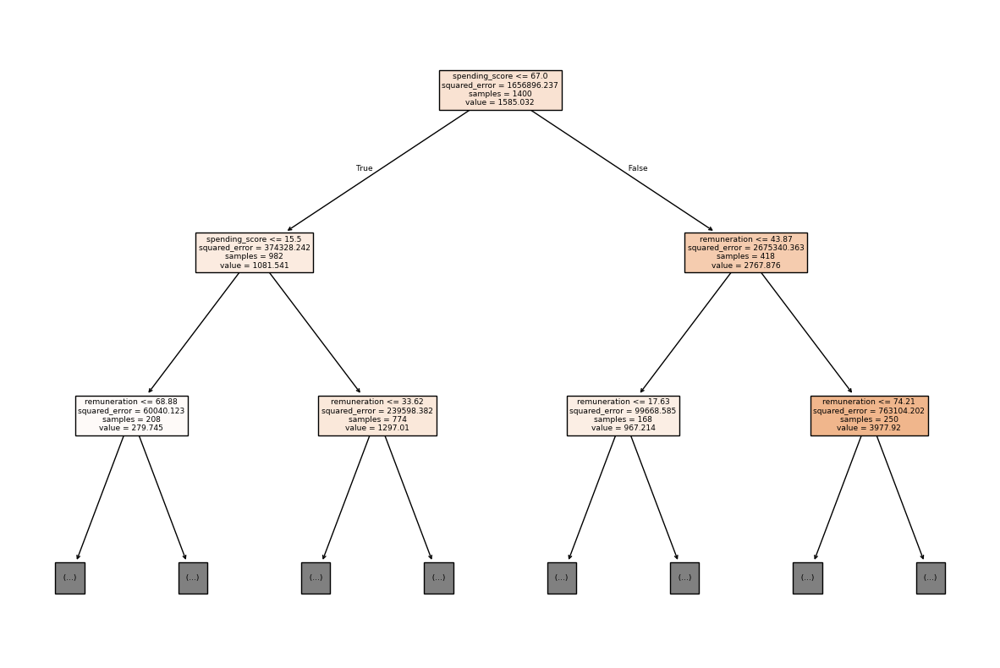

In [118]:
# Visualize the decision tree

plt.figure(figsize=(15, 10))
plot_tree(dtr_pruned, feature_names=feature_cols, max_depth=2, filled=True)
plt.show()

## 5. Discuss: Insights and observations

**Full Tree vs. Pruned Tree:**


**Full Tree:**
- Typically has low training error (may even be close to zero) since it fits the data very closely.
- The test error is higher due to overfitting (the model memorizes the data rather than generalizing well).
  
**Pruned Tree:**
- The training error is higher than the full tree since pruning reduces the tree’s complexity.
- The test error is lower or similar to the full tree. This would indicate better generalization and reduced overfitting.

**Other observations.**
- remuneration and spending_score are the two features that contribute the most to the model and explain the highest relationship with loyalty_points. 
- Both full and pruned models may be prone to large errors due to relatively higher RMSE than MAE test errors for both models (Pruned 53.61, Full: 60.19)

## 6. Random Forest Regressor

In [119]:
# Create and train the Random Forest regressor
rfg = RandomForestRegressor(random_state=42)
rfg.fit(X_train, y_train)

# Predictions
y_train_pred_rfg = rfg.predict(X_train)
y_test_pred_rfg = rfg.predict(X_test)

# Calculate Training and Test Errors
train_mse = mean_squared_error(y_train, y_train_pred_rfg)
test_mse = mean_squared_error(y_test, y_test_pred_rfg)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = r2_score(y_train, y_train_pred_rfg)
test_r2 = r2_score(y_test, y_test_pred_rfg)
train_mae = mean_absolute_error(y_train, y_train_pred_rfg)
test_mae = mean_absolute_error(y_test, y_test_pred_rfg)

print(f"Random Forest rfg - Train MSE: {train_mse}, Train RMSE: {train_rmse}, Train R²: {train_r2}, Train MAE: {train_mae}")
print(f"Radom Forest rfg - Test MSE: {test_mse}, Test RMSE: {test_rmse}, Test R²: {test_r2}, Test MAE: {test_mae}")

n_trees = rfg.n_estimators
print(f"Number of trees in Random Forest rfg: {n_trees}")

Random Forest rfg - Train MSE: 886.3467942142855, Train RMSE: 29.77157695209116, Train R²: 0.9994650559434468, Train MAE: 8.935907142857143
Radom Forest rfg - Test MSE: 6086.479593499998, Test RMSE: 78.0158932109349, Test R²: 0.9962424428546242, Test MAE: 26.589450000000003
Number of trees in Random Forest rfg: 100


In [120]:
# Create and train the Random Forest regressor
rfg2 = RandomForestRegressor(random_state=42)
rfg2.fit(X_train_reduced, y_train)

# Predictions
y_train_pred_rfg2 = rfg2.predict(X_train_reduced)
y_test_pred_rfg2 = rfg2.predict(X_test_reduced)

## Calculate Training and Test Errors
train_mse = mean_squared_error(y_train, y_train_pred_rfg2)
test_mse = mean_squared_error(y_test, y_test_pred_rfg2)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = r2_score(y_train, y_train_pred_rfg2)
test_r2 = r2_score(y_test, y_test_pred_rfg2)
train_mae = mean_absolute_error(y_train, y_train_pred_rfg2)
test_mae = mean_absolute_error(y_test, y_test_pred_rfg2)

print(f"Random Forest rfg2 - Train MSE: {train_mse}, Train RMSE: {train_rmse}, Train R²: {train_r2}, Train MAE: {train_mae}")
print(f"Unpruned Random Forest rfg2 - Test MSE: {test_mse}, Test RMSE: {test_rmse}, Test R²: {test_r2}, Test MAE: {test_mae}")

n_trees = rfg.n_estimators
print(f"Number of trees in Random Forest rfg2: {n_trees}")

Random Forest rfg2 - Train MSE: 788.6900840714285, Train RMSE: 28.083626618929195, Train R²: 0.9995239954883456, Train MAE: 7.824892857142854
Unpruned Random Forest rfg2 - Test MSE: 4641.222773833331, Test RMSE: 68.12652034144509, Test R²: 0.997134688529027, Test MAE: 22.00078333333333
Number of trees in Random Forest rfg2: 100


In [121]:
# Make predictions on new data
new_customer = pd.DataFrame({'remuneration': [19.68],
                             'spending_score': [73],
                             'age': [27]})

predicted_points = rfg2.predict(new_customer)
print(f"Predicted Loyalty Points for new customer: {predicted_points[0]:.2f}")

Predicted Loyalty Points for new customer: 840.00


**Both Random Forest models typically perform better than the single Decision Trees because they reduce overfitting by averaging multiple trees.**

- Both models trained and tested on the same data split - therefore comparisons may be made.
- Random Forests have lower MAE, MSE, RMSE than single Decision Trees because they reduce variance.

**Based on the metrics provided, Random Forest rfg2 is the better model:**
For test data (which is most important for evaluating model performance):

* rfg2 has lower Test MSE: 4641.22 vs 6086.48 for rfg
* rfg2 has lower Test RMSE: 68.13 vs 78.02 for rfg
* rfg2 has higher Test R-squared: 0.9971 vs 0.9962 for rfg
* rfg2 has lower Test MAE: 22.00 vs 26.59 for rfg

The training metrics are also better for rfg2 across all measures, suggesting it fits the training data better without overfitting.

# Week 3 assignment: Clustering with *k*-means using Python

The marketing department also wants to better understand the usefulness of renumeration and spending scores but do not know where to begin. You are tasked to identify groups within the customer base that can be used to target specific market segments. Use *k*-means clustering to identify the optimal number of clusters and then apply and plot the data using the created segments.

**Instructions**
1. Prepare the data for clustering. 
    1. Import the CSV file you have prepared in Week 1.
    2. Create a new DataFrame (e.g. `df3`) containing the `renumeration` and `spending_score` columns.
    3. Explore the new DataFrame. 
2. Plot the renumeration versus spending score.
    1. Create a scatterplot.
    2. Create a pairplot.
3. Use the Silhouette and Elbow methods to determine the optimal number of clusters for *k*-means clustering.
    1. Plot both methods and explain how you determine the number of clusters to use.
    2. Add titles and legends to the plot.
4. Evaluate the usefulness of at least three values for *k* based on insights from the Elbow and Silhoutte methods.
    1. Plot the predicted *k*-means.
    2. Explain which value might give you the best clustering.
5. Fit a final model using your selected value for *k*.
    1. Justify your selection and comment on the respective cluster sizes of your final solution.
    2. Check the number of observations per predicted class.
6. Plot the clusters and interpret the model.

## 1. Load and explore the data

In [122]:
# Load the CSV file(s) as df2.
df3 = reviews[['remuneration', 'spending_score']]

# View DataFrame.
df3.info()
df3.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   remuneration    2000 non-null   float64
 1   spending_score  2000 non-null   int64  
dtypes: float64(1), int64(1)
memory usage: 31.4 KB


,remuneration,spending_score
0,12.30,39
1,12.30,81
2,13.12,6
3,13.12,77
4,13.94,40


In [123]:
# Descriptive statistics.

df3.describe()

,remuneration,spending_score
count,2000.000000,2000.000000
mean,48.079060,50.000000
std,23.123984,26.094702
min,12.300000,1.000000
25%,30.340000,32.000000
50%,47.150000,50.000000
75%,63.960000,73.000000
max,112.340000,99.000000


## 2. Plot

<Axes: xlabel='remuneration', ylabel='spending_score'>

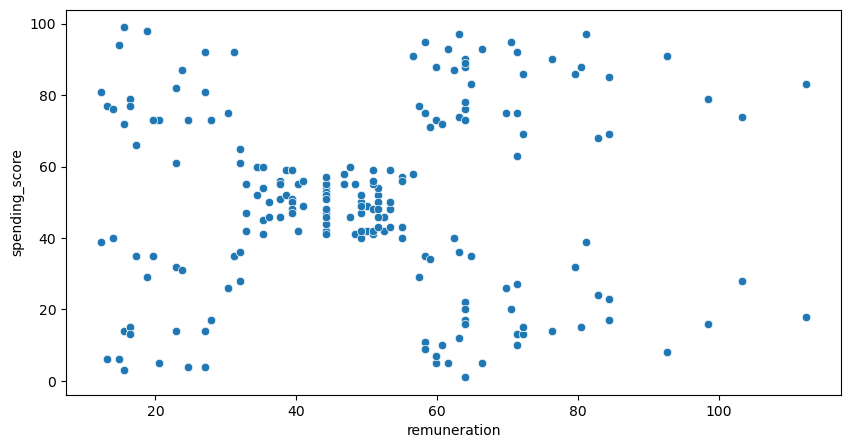

In [124]:
# Create a scatterplot with Seaborn.
sns.scatterplot(x='remuneration',
                y='spending_score',
                data=df3)

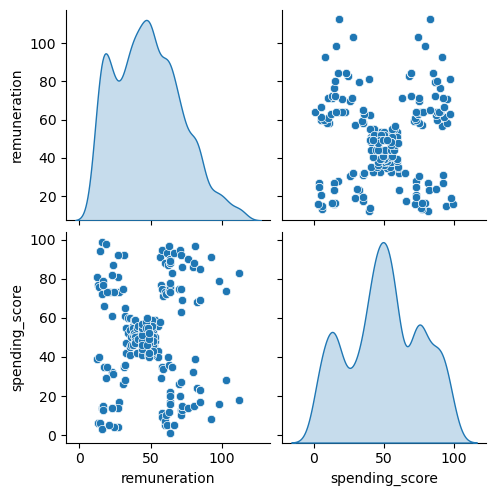

In [125]:
# Create a pairplot with Seaborn.
sns.pairplot(df3,
             diag_kind='kde')

Scatterplots appear to show 5 distinct clusters.

## 3. Elbow and silhoutte methods

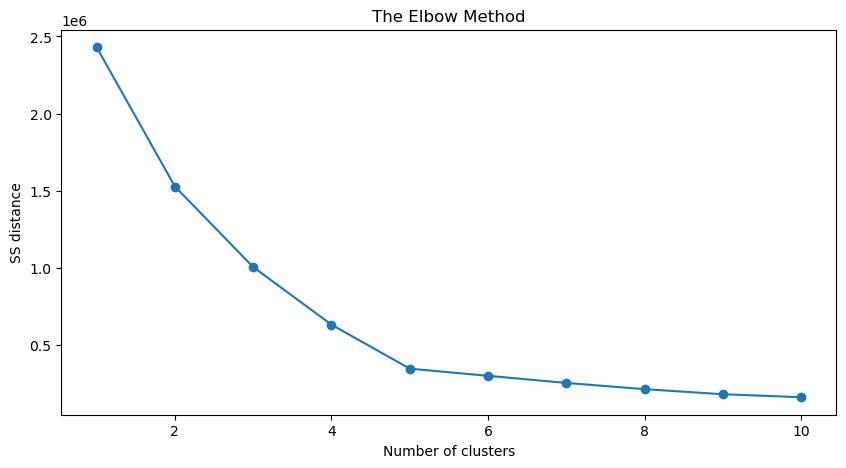

In [126]:
# Determine the number of clusters: Elbow method.
ss= [] 
for i in range (1, 11): 
    kmeans = KMeans(n_clusters=i,
                    init='k-means++',
                    max_iter=300,
                    n_init=10,
                    random_state=42)
    kmeans.fit(df3)
    ss.append(kmeans.inertia_)

# Plot the elbow method.
plt.plot(range(1, 11),
         ss,
         marker='o')

plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("SS distance")

plt.show()          

The Elbow Method suggests k=5 to be appropriate given the kink. This is in line with scatterplots above. 

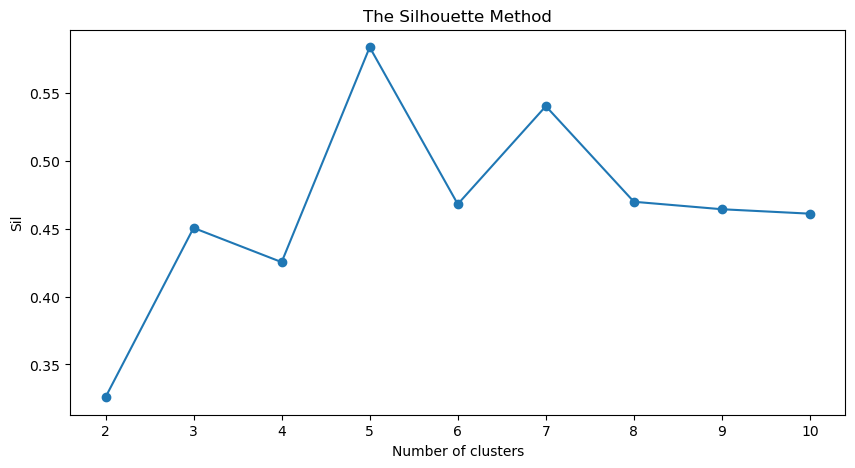

In [127]:
# Determine the number of clusters: Silhouette method.
sil = []
kmax = 10

for k in range(2, kmax+1):
    kmeans_s = KMeans(n_clusters=k).fit(df3)
    labels = kmeans_s.labels_
    sil.append(silhouette_score(df3, labels, metric='euclidean'))

# Plot the silhouette method.
plt.plot(range(2, kmax+1),
         sil,
         marker='o')

plt.title("The Silhouette Method")
plt.xlabel("Number of clusters")
plt.ylabel("Sil")

plt.show()

The Silhouette Method substantiates the Elbow Method and scatterplots as it shows k=5 to the be right number of clusters.

## 4. Evaluate k-means model at different values (k=4, k=5, k=6)

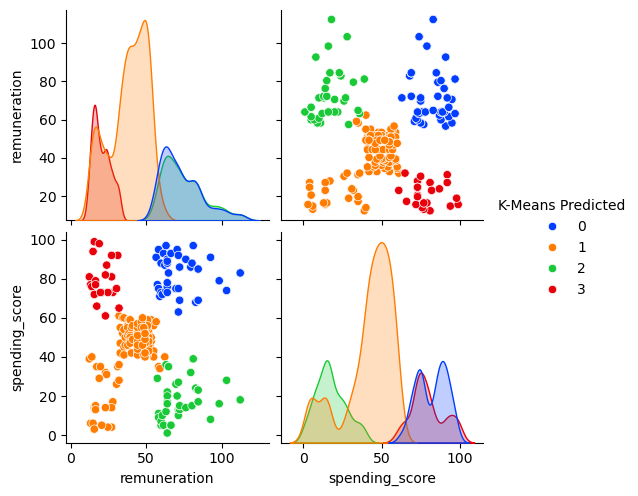

In [128]:
kmeans = KMeans(n_clusters = 4,
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(df3)

clusters = kmeans.labels_

df3['K-Means Predicted'] = clusters

sns.pairplot(df3,
             hue='K-Means Predicted',
             diag_kind = 'kde',
            palette='bright')

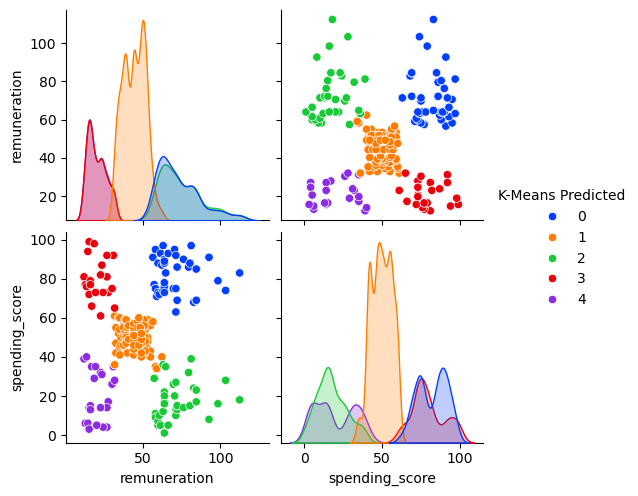

In [129]:
kmeans = KMeans(n_clusters = 5,
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(df3)

clusters = kmeans.labels_

df3['K-Means Predicted'] = clusters

sns.pairplot(df3,
             hue='K-Means Predicted',
             diag_kind = 'kde',
            palette='bright')

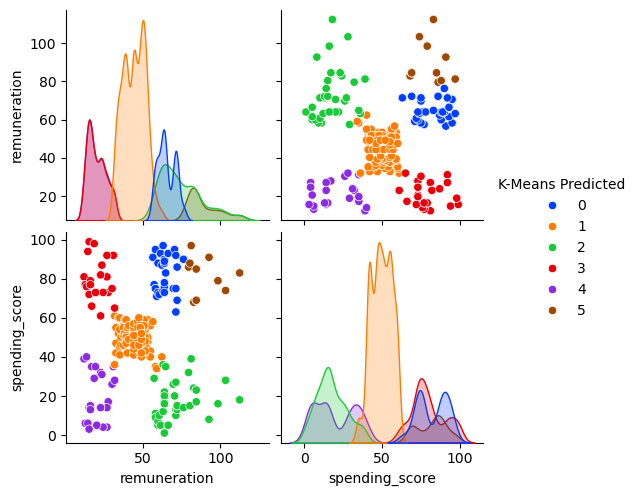

In [130]:
kmeans = KMeans(n_clusters = 6,
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(df3)

clusters = kmeans.labels_

df3['K-Means Predicted'] = clusters

sns.pairplot(df3,
             hue='K-Means Predicted',
             diag_kind = 'kde',
            palette='bright')

## 5. Fit final model and justify your choice

As per scatterplots, Elbow method and Silhouette method, five clusters (k=5) looks to be optimal. 

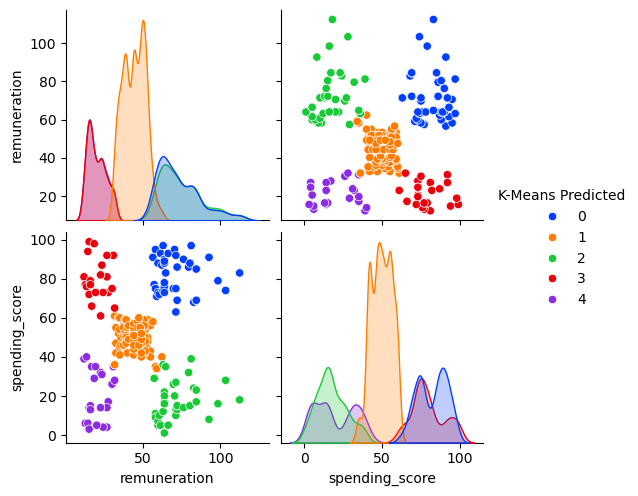

In [131]:
# Apply the final model.
kmeans = KMeans(n_clusters = 5,
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(df3)

clusters = kmeans.labels_

df3['K-Means Predicted'] = clusters

sns.pairplot(df3,
             hue='K-Means Predicted',
             diag_kind = 'kde',
            palette='bright')

In [132]:
# Check the number of observations per predicted class.
df3['K-Means Predicted'].value_counts()

K-Means Predicted
1    774
0    356
2    330
4    271
3    269
Name: count, dtype: int64

## 6. Plot and interpret the clusters

In [133]:
# View the K-Means predicted.
df3.head()

,remuneration,spending_score,K-Means Predicted
0,12.30,39,4
1,12.30,81,3
2,13.12,6,4
3,13.12,77,3
4,13.94,40,4


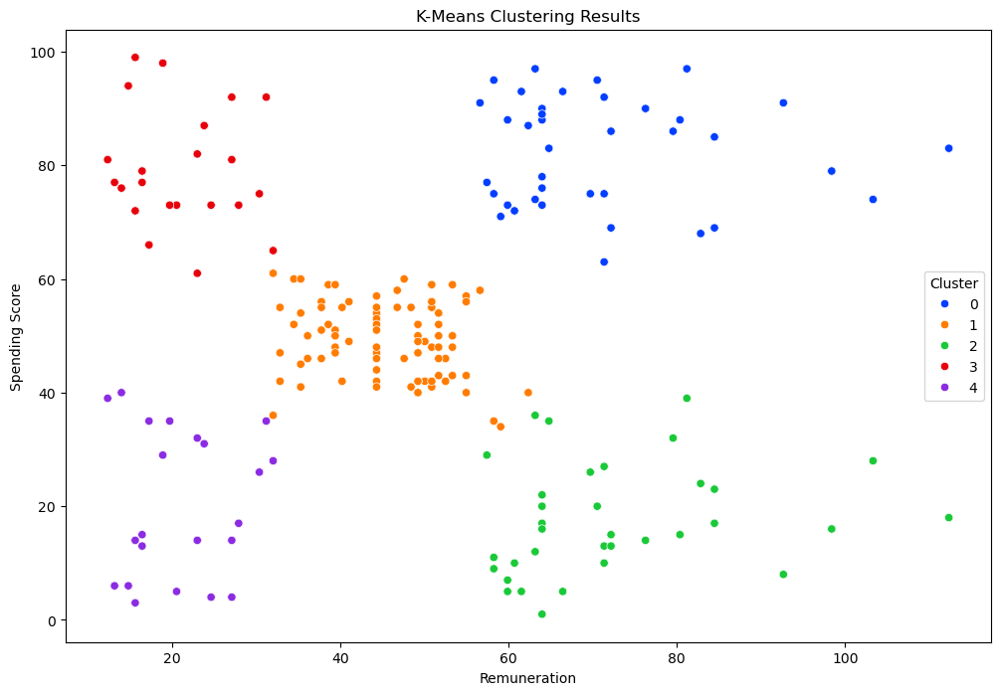

In [134]:
# Visualising the clusters.

# Set plot size
plt.figure(figsize=(12, 8))

# Set style to white (no grid)
plt.style.use('default')
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

# Create a scatterplot
sns.scatterplot(x='remuneration', 
                y='spending_score',
                data=df3,
                hue='K-Means Predicted',
                palette='bright')

plt.grid(False)

plt.title('K-Means Clustering Results')
plt.xlabel('Remuneration')
plt.ylabel('Spending Score')
plt.legend(title='Cluster')
plt.show()

## 7. Discuss: Insights and observations (superseded by commentary below - see section 10a)

- The data points clearly group into five separate clusters, with both the Elbow and Silhouette methods indicating that 5 is the optimal number of clusters (k) for the k-means model.

-  The scatterplots support this, showing that the five distinct classes are clearly separated (no overlap).

-  Based on this analysis, customers can be categorized into these five groups based on their remuneration and spending_score.

## 8. Adding a third feature to k-means clustering model

In [135]:
# Load the CSV file(s) as df2.
df3d = reviews[['age', 'remuneration', 'spending_score']]

# View DataFrame.
df3d.info()
df3d.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             2000 non-null   int64  
 1   remuneration    2000 non-null   float64
 2   spending_score  2000 non-null   int64  
dtypes: float64(1), int64(2)
memory usage: 47.0 KB


,age,remuneration,spending_score
0,18,12.30,39
1,23,12.30,81
2,22,13.12,6
3,25,13.12,77
4,33,13.94,40


In [136]:
# Now we calculate the Within Cluster Sum of Squared Errors (WSS) for different values of k.
wcss = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(df3d)
    wcss.append(kmeans.inertia_)

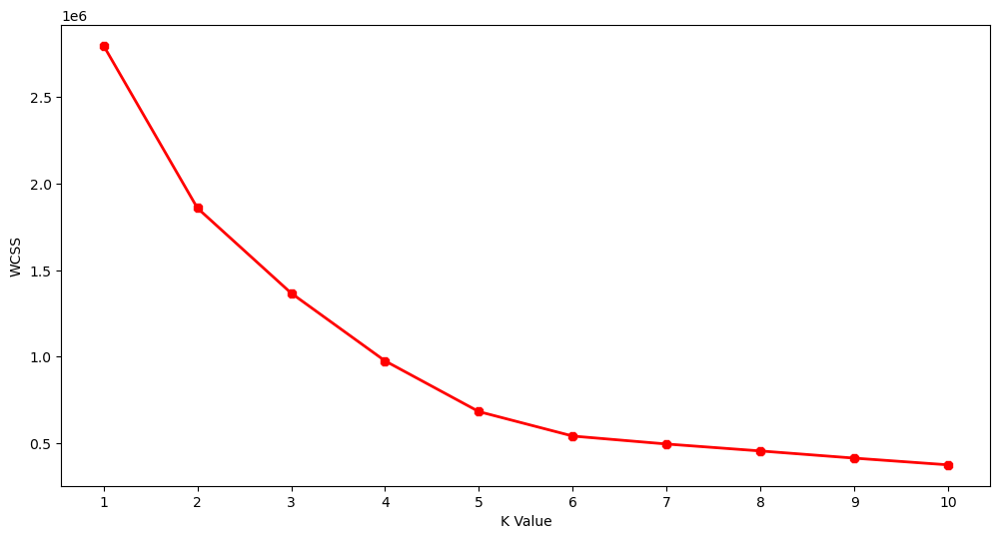

In [137]:
# Let's plot this

plt.figure(figsize=(12,6))    
plt.plot(range(1,11),wcss, linewidth=2, color="red", marker ="8")
plt.xlabel("K Value")
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS")
plt.show()
df3de = reviews

In [138]:
# Again, let's use 5 clusters

# We choose the k for which WSS starts to reduce

# Sets the model
km2 = KMeans(n_clusters=5, init = 'k-means++', random_state=42)

In [139]:
# Determines the clusers
y2 = km2.fit_predict(df3d)

In [140]:
#Create a new dataframe which has the same data as our initial data 
df3de=reviews[['age', 'remuneration', 'spending_score']]

# add the predicted cluser
df3de["label"] = y2

# Here is our data with clusters
df3de.head()

,age,remuneration,spending_score,label
0,18,12.30,39,1
1,23,12.30,81,3
2,22,13.12,6,1
3,25,13.12,77,3
4,33,13.94,40,1


In [141]:
df3de["label"].unique()

array([1, 3, 2, 0, 4], dtype=int32)

In [142]:
# Save the DataFrame to a CSV file
#df3de.to_csv("df3de.csv", index=False)

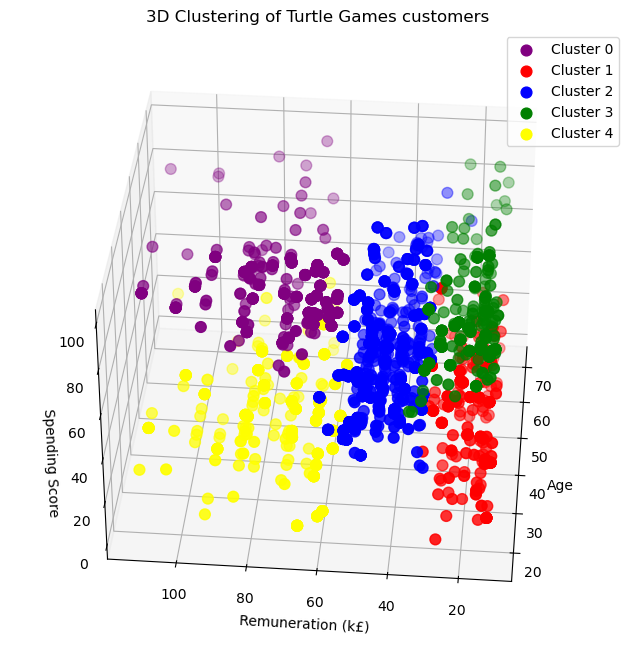

<Figure size 640x480 with 0 Axes>

In [143]:
# Here is a 3D Plot as we did the clustering on the basis of 3 input features
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='3d')

# Create scatter plots with labels for the legend
cluster0 = ax.scatter(df3de.age[df3de.label == 0], df3de.remuneration[df3de.label == 0], df3de.spending_score[df3de.label == 0], c='purple', s=60, label='Cluster 0')
cluster1 = ax.scatter(df3de.age[df3de.label == 1], df3de.remuneration[df3de.label == 1], df3de.spending_score[df3de.label == 1], c='red', s=60, label='Cluster 1')
cluster2 = ax.scatter(df3de.age[df3de.label == 2], df3de.remuneration[df3de.label == 2], df3de.spending_score[df3de.label == 2], c='blue', s=60, label='Cluster 2')
cluster3 = ax.scatter(df3de.age[df3de.label == 3], df3de.remuneration[df3de.label == 3], df3de.spending_score[df3de.label == 3], c='green', s=60, label='Cluster 3')
cluster4 = ax.scatter(df3de.age[df3de.label == 4], df3de.remuneration[df3de.label == 4], df3de.spending_score[df3de.label == 4], c='yellow', s=60, label='Cluster 4')

# Add a legend
ax.legend()

ax.view_init(35, 185)
plt.xlabel("Age")
plt.ylabel("Remuneration (k£)")
ax.set_zlabel('Spending Score')
plt.title("3D Clustering of Turtle Games customers")
plt.show()
plt.savefig('test')

## 9. Hierarchical Clustering to substantiate 3D K-Means Clustering results

In [144]:
# Perform Agglomerative Clustering with 5 clusters and ward linkage
hierarchical_clustering = AgglomerativeClustering(n_clusters=5, linkage='ward')  # affinity is not needed with 'ward' linkage
hierarchical_labels = hierarchical_clustering.fit_predict(df3de)

# Copy the feature data and add the cluster labels as a new column 'Species'
df3de_copy = df3de.copy()
df3de_copy['Hierarchical Predicted'] = hierarchical_labels

# Sample 10 random rows to check
print(df3de_copy.sample(10, random_state=42))

# Check the distribution of clusters
print(df3de_copy['Hierarchical Predicted'].value_counts())

      age  remuneration  spending_score  label  Hierarchical Predicted
1860   72         24.60               4      1                       1
353    38         63.96              76      0                       4
1333   33         59.04              71      0                       4
905    23         50.84              42      2                       0
1289   49         47.56              46      2                       0
1273   62         41.00              56      2                       0
938    18         60.68              10      4                       2
1731   39         19.68              73      3                       3
65     19         39.36              59      2                       0
1323   39         56.58              91      0                       4
Hierarchical Predicted
0    780
4    356
2    330
1    286
3    248
Name: count, dtype: int64


In [145]:
df3de_copy['label'].value_counts()

label
2    776
0    356
4    330
1    270
3    268
Name: count, dtype: int64

In [146]:
df3de_copy['Hierarchical Predicted'].value_counts()

Hierarchical Predicted
0    780
4    356
2    330
1    286
3    248
Name: count, dtype: int64

- The cluster labels are nominal in nature and not the interchangeable from model to model (When cluster labels are not interchangeable from model to model, it means that the specific labels assigned to clusters in one model (e.g., k-means) may not correspond to the same clusters in another model (e.g., hierarchical clustering), even if the underlying data points are the same.

- It is evident that k-means and hierarchical clustering have come up with similar numbers in five clusters. 

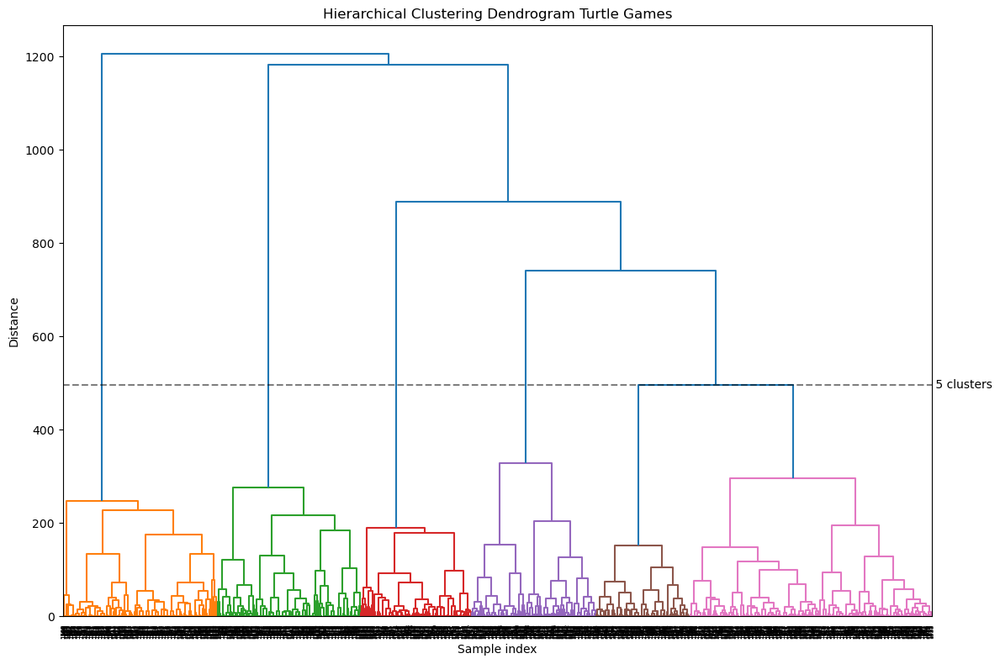

In [147]:
# Drop non-feature columns like 'K-Means Predicted'
X = df3de_copy.drop(columns='label') 

# Compute the linkage matrix (using 'ward' method)
Z = linkage(X, method='ward')

# Sort the distances in the linkage matrix (the 3rd column represents the distance)
distances = sorted(Z[:, 2], reverse=True)

# The 4th largest distance will give 5 clusters (n-k+1)
five_cluster_threshold = distances[4]

# Cut the dendrogram to get 5 clusters
clusters_5 = fcluster(Z, 5, criterion='maxclust')

# Add the cluster labels to your dataframe
#df3de_copy['hierarchical_cluster_5'] = clusters_5

# Visualize the dendrogram with the 5-cluster cut line
plt.figure(figsize=(12, 8))
dendrogram(
    Z,
    labels=df3de_copy.index.tolist(),
    orientation='top',
    color_threshold=five_cluster_threshold  # This will color the 5 clusters differently
)

# Draw the horizontal line at the appropriate height for 5 clusters
plt.axhline(y=five_cluster_threshold, c='k', linestyle='--', alpha=0.5)
plt.text(plt.xlim()[1], five_cluster_threshold, ' 5 clusters', va='center', ha='left')
plt.title('Hierarchical Clustering Dendrogram Turtle Games')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()

The dendrogram is cut as low as possible with the highest distance separating consecutive splits, i.e. cut at the point where there is the largest gap or difference between two consecutive splits, which indicates a significant change in how the data is being clustered.

## 10. Support Vector Machine Classifier to substantiate 3D K-Means Clustering results

Accuracy Score:  0.9825

Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        63
           1       1.00      0.98      0.99        53
           2       0.96      1.00      0.98       153
           3       1.00      0.94      0.97        52
           4       1.00      0.96      0.98        79

    accuracy                           0.98       400
   macro avg       0.99      0.98      0.98       400
weighted avg       0.98      0.98      0.98       400



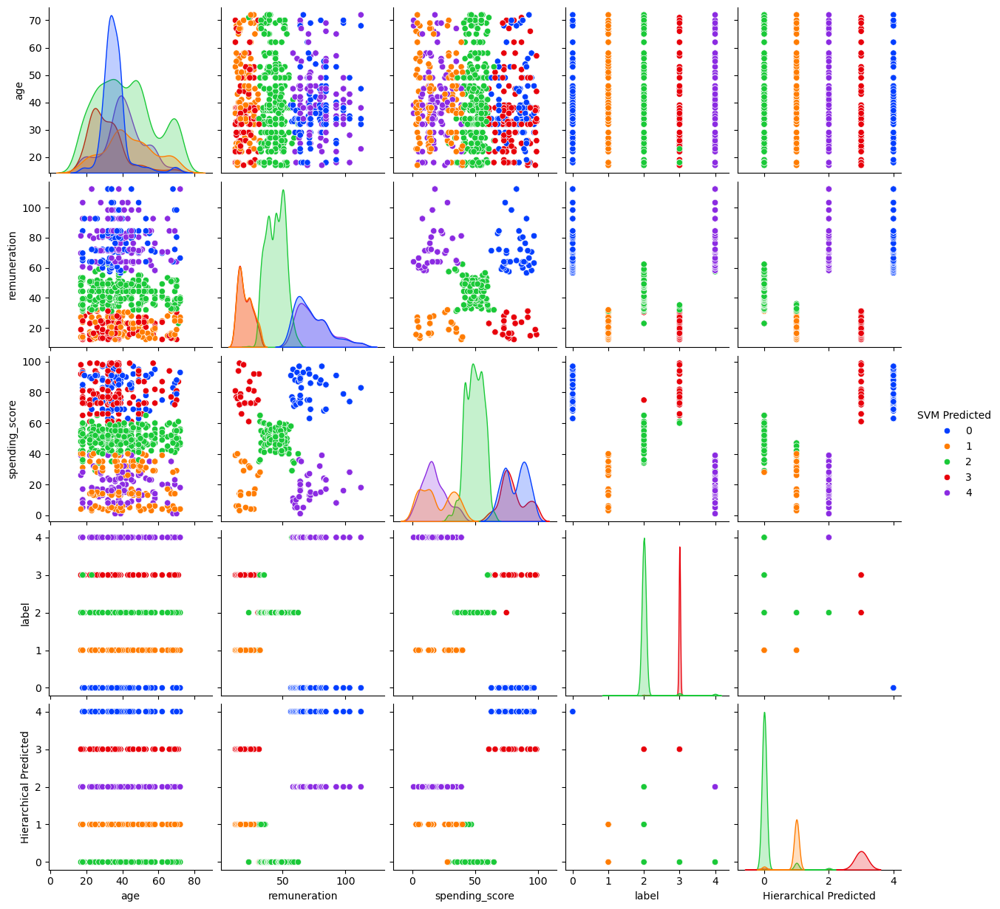

In [148]:
X = df3de_copy.drop(columns=['label'])  # Features (excluding target column)
y = df3de_copy['label']  # Target (K-Means cluster labels)

# Split the data into training and testing sets (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the SVM classifier (can experiment with different kernels like 'linear', 'poly', 'rbf', etc.)
svm = SVC(kernel='rbf')  # RBF kernel used

# Train the SVM model
svm.fit(X_train, y_train)

# Make predictions on the test set
y_pred = svm.predict(X_test)

# Evaluate the model's performance
print("Accuracy Score: ", accuracy_score(y_test, y_pred))
print("\nClassification Report: ")
print(classification_report(y_test, y_pred))

# Optional: Visualizing with pairplot again, just to see the SVM results
df3de_copy['SVM Predicted'] = svm.predict(X)  # Predicting the whole dataset to visualize
sns.pairplot(df3de_copy, hue='SVM Predicted', diag_kind='kde', palette='bright')

**Results of Support Vector Machine (SVM) classifier to validate K-Means clustering results.**


- The evaluation metrics:

- Precision: The ratio of true positive predictions to all positive predictions. It answers "Of all instances predicted as class X, how many actually belong to class X?" High precision means few false positives.
  
- Recall: The ratio of true positive predictions to all actual positives. It answers "Of all instances that actually belong to class X, how many were correctly predicted?" High recall means few false negatives.

- F1-score: The harmonic mean of precision and recall, providing a single metric that balances both concerns. It's particularly useful when classes are imbalanced.

- An accuracy score of 0.9825 (98.25%), which is very high, indicating that the SVM model can effectively learn the cluster patterns identified by K-Means.

uality of the K-Means clustering results - if clusters weren't well-formed, the SVM would struggle to classify points accurately.

The approach essentially validates the clustering by showing that a supervised learning algorithm can reliably predict the cluster assignments, indicating that the clusters represent meaningful patterns in the data.

# Week 4 assignment: NLP using Python
Customer reviews were downloaded from the website of Turtle Games. This data will be used to steer the marketing department on how to approach future campaigns. Therefore, the marketing department asked you to identify the 15 most common words used in online product reviews. They also want to have a list of the top 20 positive and negative reviews received from the website. Therefore, you need to apply NLP on the data set.

**Instructions**
1. Load and explore the data. 
    1. Sense-check the DataFrame.
    2. You only need to retain the `review` and `summary` columns.
    3. Determine if there are any missing values.
2. Prepare the data for NLP
    1. Change to lower case and join the elements in each of the columns respectively (`review` and `summary`).
    2. Replace punctuation in each of the columns respectively (`review` and `summary`).
    3. Drop duplicates in both columns (`review` and `summary`).
3. Tokenise and create wordclouds for the respective columns (separately).
    1. Create a copy of the DataFrame.
    2. Apply tokenisation on both columns.
    3. Create and plot a wordcloud image.
4. Frequency distribution and polarity.
    1. Create frequency distribution.
    2. Remove alphanumeric characters and stopwords.
    3. Create wordcloud without stopwords.
    4. Identify 15 most common words and polarity.
5. Review polarity and sentiment.
    1. Plot histograms of polarity (use 15 bins) for both columns.
    2. Review the sentiment scores for the respective columns.
6. Identify and print the top 20 positive and negative reviews and summaries respectively.
7. Include your insights and observations.

## 1. Load and explore the data

In [149]:
# Load the data set as df3.
df3 = reviews[['review', 'summary']]

# View DataFrame.
df3.head()

,review,summary
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,As my review of GF9's previous screens these w...,Money trap


In [150]:
# Determine if there are any missing values.
df3.isnull().sum()

review     0
summary    0
dtype: int64

## 2. Prepare the data for NLP
### 2a) Change to lower case and join the elements in each of the columns respectively (review and summary)

In [151]:
# Review: Change all to lower case and join with a space.
df3['review'] = df3['review'].str.lower()

In [152]:
# Summary: Change all to lower case and join with a space.
df3['summary'] = df3['summary'].str.lower()

### 2b) Replace punctuation in each of the columns respectively (review and summary)

In [153]:
# Replace all the punctuations in review column.
df3['review'] = [re.sub('[^\w\s]+', '', r) for r in df3['review'].tolist()]

# View output.
df3.head()

,review,summary
0,when it comes to a dms screen the space on the...,the fact that 50% of this space is wasted on a...
1,an open letter to galeforce9\n\nyour unpainted...,another worthless dungeon master's screen from...
2,nice art nice printing why two panels are fil...,"pretty, but also pretty useless"
3,amazing buy bought it as a gift for our new dm...,five stars
4,as my review of gf9s previous screens these we...,money trap


In [154]:
# Replace all the puncuations in summary column.
df3['summary'] = [re.sub('[^\w\s]+', '', s) for s in df3['summary'].tolist()]

# View output.
df3.head()

,review,summary
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,an open letter to galeforce9\n\nyour unpainted...,another worthless dungeon masters screen from ...
2,nice art nice printing why two panels are fil...,pretty but also pretty useless
3,amazing buy bought it as a gift for our new dm...,five stars
4,as my review of gf9s previous screens these we...,money trap


### 2c) Drop duplicates in both columns

In [155]:
df3.duplicated().sum()

39

In [156]:
# Drop duplicates in both columns.
df3.drop_duplicates(inplace=True, ignore_index=True)
df3.reset_index()

# View DataFrame.
#df3.head()
df3.shape

(1961, 2)

## 3. Tokenise and create wordclouds

In [157]:
# Create new DataFrame (copy DataFrame).
df3_copy = df3.copy()

# View DataFrame.
df3_copy

,review,summary
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,an open letter to galeforce9\n\nyour unpainted...,another worthless dungeon masters screen from ...
2,nice art nice printing why two panels are fil...,pretty but also pretty useless
3,amazing buy bought it as a gift for our new dm...,five stars
4,as my review of gf9s previous screens these we...,money trap
...,...,...
1956,the perfect word game for mixed ages with mom ...,the perfect word game for mixed ages with mom
1957,great game did not think i would like it when...,super fun
1958,great game for all\nkeeps the mind nimble,great game
1959,fun game,four stars


In [158]:
# Apply tokenisation to both columns.
df3_copy['review_tokens'] = df3_copy['review'].apply(lambda x: word_tokenize(x))
df3_copy['summary_tokens'] = df3_copy['summary'].apply(lambda x: word_tokenize(x))


# View DataFrame.
df3_copy

,review,summary,review_tokens,summary_tokens
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was..."
1,an open letter to galeforce9\n\nyour unpainted...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,..."
2,nice art nice printing why two panels are fil...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]"
3,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]"
4,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]"
...,...,...,...,...
1956,the perfect word game for mixed ages with mom ...,the perfect word game for mixed ages with mom,"[the, perfect, word, game, for, mixed, ages, w...","[the, perfect, word, game, for, mixed, ages, w..."
1957,great game did not think i would like it when...,super fun,"[great, game, did, not, think, i, would, like,...","[super, fun]"
1958,great game for all\nkeeps the mind nimble,great game,"[great, game, for, all, keeps, the, mind, nimble]","[great, game]"
1959,fun game,four stars,"[fun, game]","[four, stars]"


In [159]:
# Create and plot word cloud images
def word_cloud(column_name):
    """
    Creates and displays a word cloud visualization from tokenized text data.
    
    This function takes a column of tokenized text (a list of lists of tokens),
    flattens it into a single string, and generates a word cloud visualization.
    
    Parameters:
    -----------
    column_name : list or pandas.Series
        A collection of tokenized text data, where each element is a list of tokens.
        For example: [['hello', 'world'], ['another', 'example', 'here']]
    
    Returns:
    --------
    None
        Displays the word cloud visualization inline.
    
    Notes:
    ------
    - Uses WordCloud with a white background and 1600x900 dimensions
    - Uses bilinear interpolation for smoother rendering
    - Requires matplotlib and wordcloud packages to be installed
    """
    # Flatten the list of tokenized words and join them into a single string
    text = ' '.join(' '.join(tokens) for tokens in column_name)
    
    # Create and plot the word cloud
    wordcloud = WordCloud(width=1600, height=900, background_color='white').generate(text)
    plt.figure(figsize=(16, 9))
    plt.imshow(wordcloud, interpolation='bilinear') # less pixelated and more visually appealing image.
    plt.axis('off')
    plt.show()

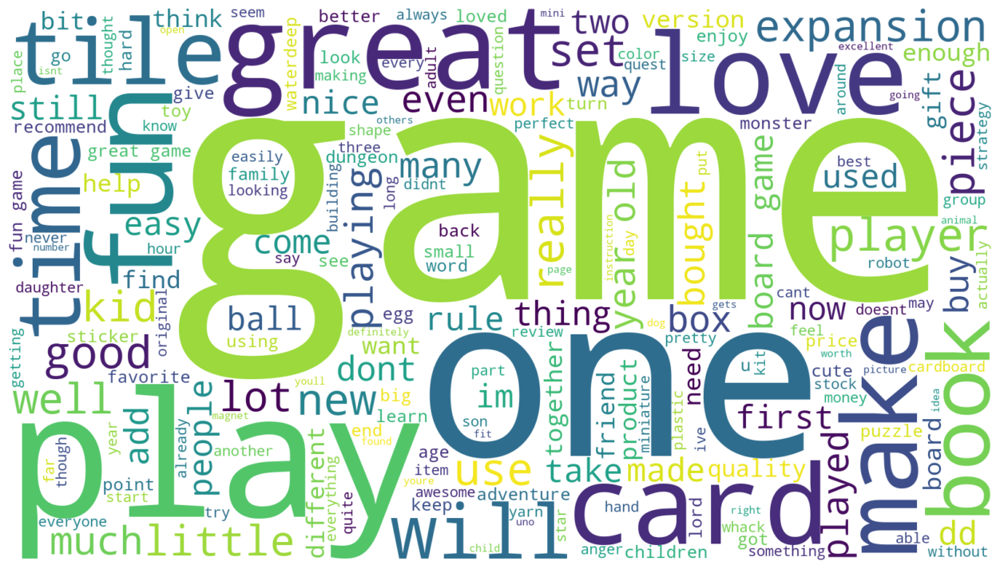

In [160]:
# Review: Plot the WordCloud image.
word_cloud(df3_copy['review_tokens'])

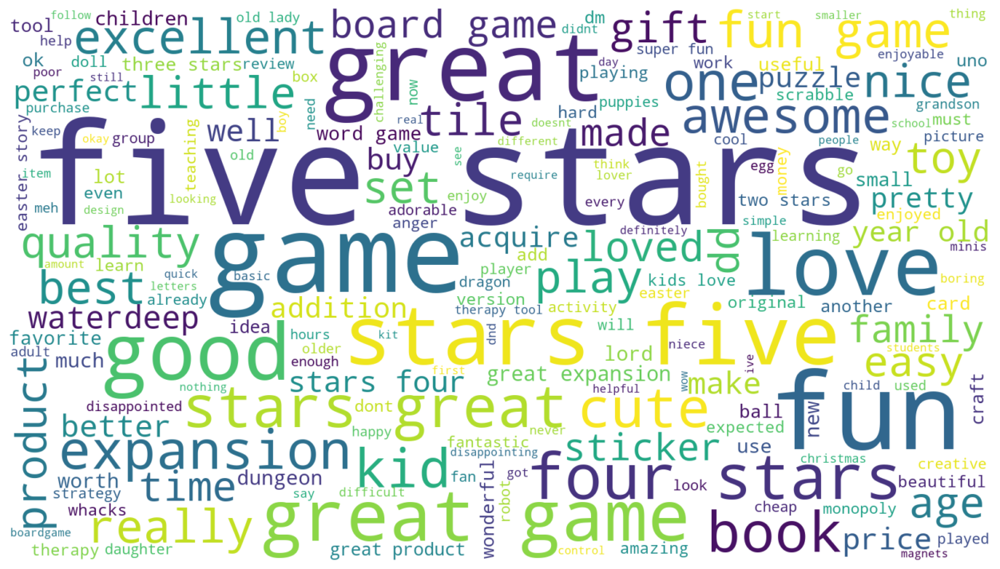

In [161]:
# Summary: Plot the WordCloud image.
word_cloud(df3_copy['summary_tokens'])

## 4. Frequency distribution and polarity
### 4a) Create frequency distribution

In [162]:
# Calculate the frequency distribution.
all_review_words = [word for tokens in df3_copy['review_tokens'] for word in tokens]
fdist_review = FreqDist(all_review_words)

# Preview data.
fdist_review

FreqDist({'the': 5451, 'and': 3233, 'to': 3162, 'a': 3160, 'of': 2488, 'i': 2090, 'it': 2083, 'is': 1782, 'this': 1776, 'game': 1671, ...})

In [163]:
all_summary_words = [word for tokens in df3_copy['summary_tokens'] for word in tokens]

# Calculate the frequency distribution.
fdist_summary = FreqDist(all_summary_words)

# Preview data.
fdist_summary

FreqDist({'stars': 427, 'five': 342, 'game': 319, 'great': 295, 'the': 261, 'a': 240, 'for': 232, 'fun': 218, 'to': 192, 'and': 168, ...})

### 4b) Remove alphanumeric characters and stopwords

In [164]:
# Function to remove alphanum and stopwords
# Delete all the alpanum.
# Remove all the stopwords
def preprocess_text(tokens):
    """
    Preprocesses tokenized text by removing non-alphabetic characters and stopwords.
    
    This function takes a list of tokens, converts them to lowercase, filters out
    any non-alphabetic tokens (numbers, symbols, etc.), and removes English stopwords.
    
    Parameters:
    -----------
    tokens : list
        A list of string tokens to process.
        
    Returns:
    --------
    list
        A cleaned list of lowercase alphabetic tokens with stopwords removed.
        
    Notes:
    ------
    - Uses NLTK's English stopwords list
    - Requires the nltk package with stopwords corpus downloaded
    - Example usage: clean_tokens = preprocess_text(['Hello', 'world', '123', 'the'])
      would return ['hello', 'world']
    """
    stop_words = set(stopwords.words('english'))
    tokens = [word.lower() for word in tokens if word.isalpha() and word.lower() not in stop_words]
    return tokens

In [165]:
df3_copy['review_tokens_no_sw'] = df3_copy['review_tokens'].apply(preprocess_text)
df3_copy['summary_tokens_no_sw'] = df3_copy['summary_tokens'].apply(preprocess_text)

In [166]:
# Frequency Distribution of review tokens post removal of alphanumeric characters and stopwords.
all_review_words1 = [word for tokens in df3_copy['review_tokens_no_sw'] for word in tokens]
fdist_review1 = FreqDist(all_review_words1)
fdist_review1

FreqDist({'game': 1671, 'great': 580, 'fun': 552, 'one': 530, 'play': 502, 'like': 414, 'love': 323, 'really': 319, 'get': 319, 'cards': 301, ...})

In [167]:
# Frequency Distribution of summary tokens post removal of alphanumeric characters and stopwords.
all_summary_words1= [word for tokens in df3_copy['summary_tokens_no_sw'] for word in tokens]
fdist_summary1 = FreqDist(all_summary_words1)
fdist_summary1

FreqDist({'stars': 427, 'five': 342, 'game': 319, 'great': 295, 'fun': 218, 'love': 93, 'good': 92, 'four': 58, 'like': 54, 'expansion': 52, ...})

In [168]:
df3_copy

,review,summary,review_tokens,summary_tokens,review_tokens_no_sw,summary_tokens_no_sw
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was...","[comes, dms, screen, space, screen, absolute, ...","[fact, space, wasted, art, terribly, informati..."
1,an open letter to galeforce9\n\nyour unpainted...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,...","[open, letter, unpainted, miniatures, bad, spe...","[another, worthless, dungeon, masters, screen]"
2,nice art nice printing why two panels are fil...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]","[nice, art, nice, printing, two, panels, fille...","[pretty, also, pretty, useless]"
3,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]","[amazing, buy, bought, gift, new, dm, perfect]","[five, stars]"
4,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]","[review, previous, screens, completely, unnece...","[money, trap]"
...,...,...,...,...,...,...
1956,the perfect word game for mixed ages with mom ...,the perfect word game for mixed ages with mom,"[the, perfect, word, game, for, mixed, ages, w...","[the, perfect, word, game, for, mixed, ages, w...","[perfect, word, game, mixed, ages, mom, perhap...","[perfect, word, game, mixed, ages, mom]"
1957,great game did not think i would like it when...,super fun,"[great, game, did, not, think, i, would, like,...","[super, fun]","[great, game, think, would, like, first, recei...","[super, fun]"
1958,great game for all\nkeeps the mind nimble,great game,"[great, game, for, all, keeps, the, mind, nimble]","[great, game]","[great, game, keeps, mind, nimble]","[great, game]"
1959,fun game,four stars,"[fun, game]","[four, stars]","[fun, game]","[four, stars]"


### 4c) Create wordcloud without stopwords

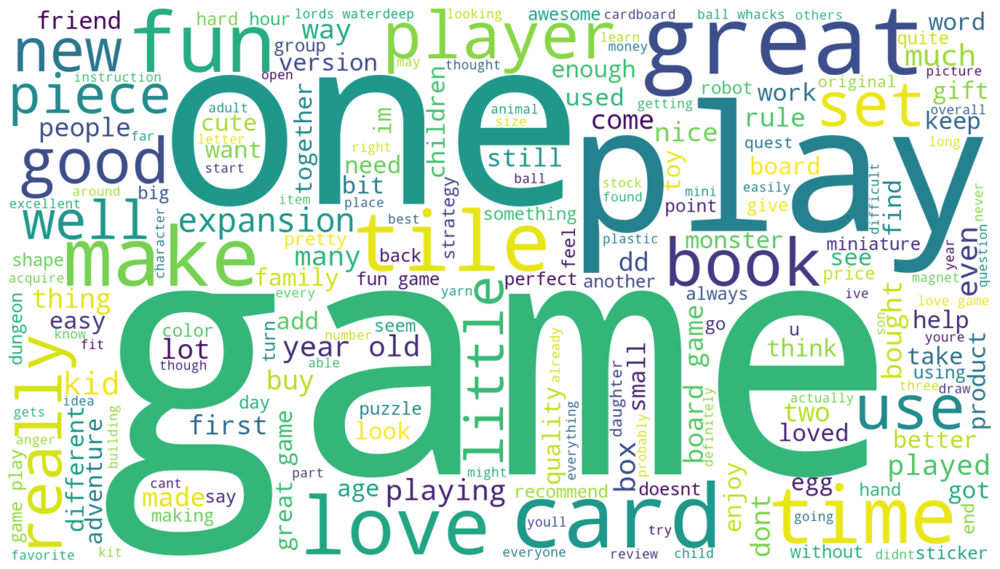

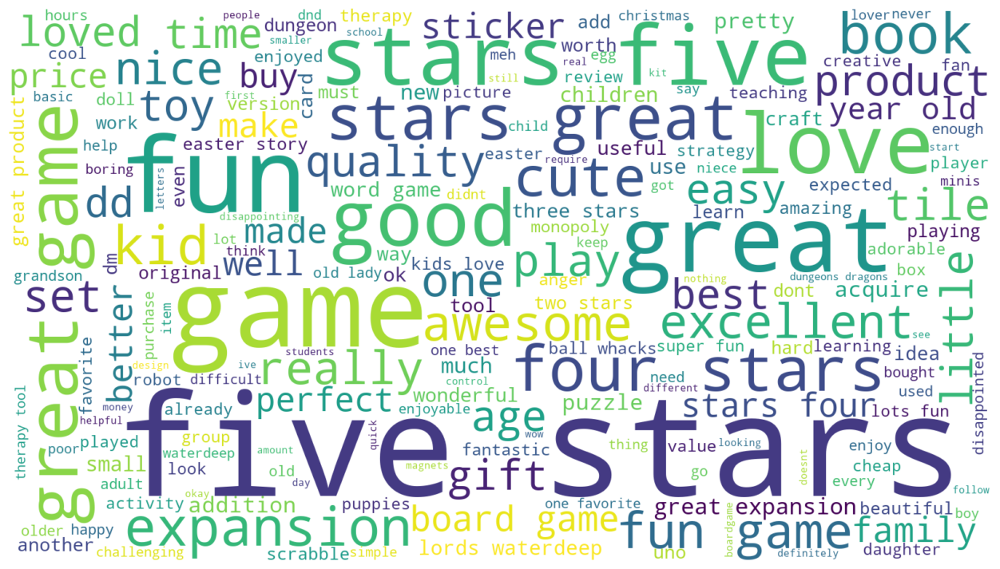

In [169]:
# Plot the wordcloud image.
word_cloud(df3_copy['review_tokens_no_sw'])
word_cloud(df3_copy['summary_tokens_no_sw'])


### 4d) TextBlob: Identify 15 most common words and polarity

In [170]:
review_no_sw = df3_copy['review_tokens_no_sw']

In [171]:
# Determine the 15 most common words and calculate their sentiment polarity.

# Flatten the list of lists (assuming review_no_sw is a list of lists)
flat_list = [word for sublist in review_no_sw for word in sublist]

# Generate a DataFrame from Counter
review_counts = pd.DataFrame(Counter(flat_list).most_common(15),
                             columns=['Word', 'Frequency']).set_index('Word')

# Function to calculate polarity for each word
def calculate_polarity(word):
   """
   Calculates the sentiment polarity score for a given word.
   
   This function uses TextBlob to determine the sentiment polarity
   of a single word, with scores ranging from -1 (negative) to 1 (positive).
   
   Parameters:
   -----------
   word : str
       The word for which to calculate sentiment polarity.
       
   Returns:
   --------
   float
       The sentiment polarity score rounded to 2 decimal places.
       Values range from -1.0 (very negative) to 1.0 (very positive),
       with 0.0 representing neutral sentiment.
       
   Notes:
   ------
   - Requires the textblob package to be installed
   - Single words may not have the same sentiment as when they appear in context
   """
   blob = TextBlob(word)
   return round(blob.sentiment.polarity, 2)  # Round to 2 decimal places
    
# Apply the function to the 'Word' column of the review_counts DataFrame
review_counts['Polarity'] = review_counts.index.to_series().apply(calculate_polarity)

# Set display option to show 2 decimal places for floating-point values
pd.set_option('display.float_format', '{:.2f}'.format)

# Preview the data
review_counts

,Frequency,Polarity
Word,,
game,1671,-0.40
great,580,0.80
fun,552,0.30
one,530,0.00
play,502,0.00
like,414,0.00
love,323,0.50
really,319,0.20
get,319,0.00


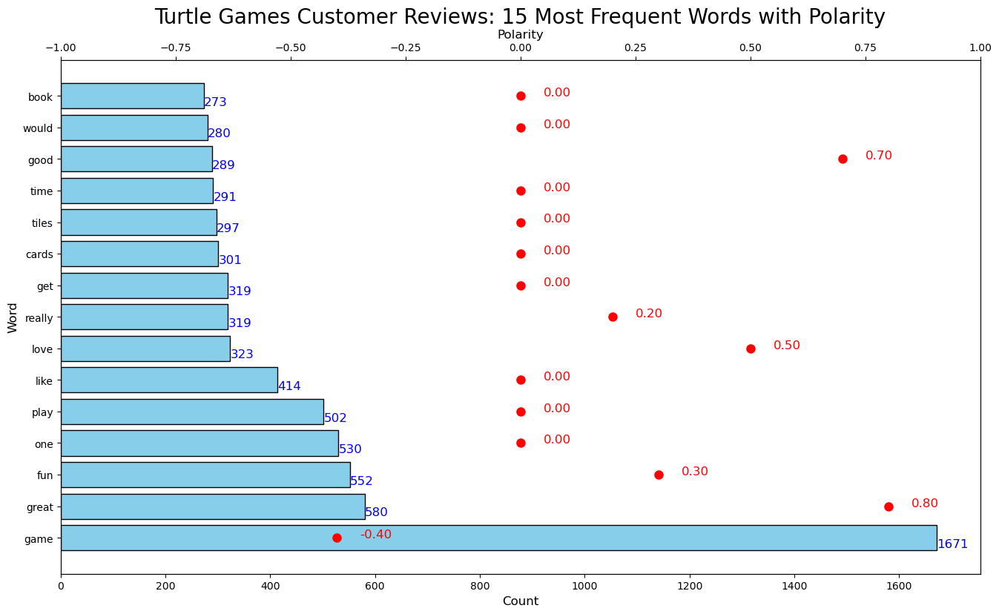

In [172]:
# Set the plot type for frequency on the primary axis.
fig, ax1 = plt.subplots(figsize=(16, 9))

# Plot frequency (bars on the first axis)
ax1.barh(review_counts.index, review_counts['Frequency'], color='skyblue', edgecolor='black')
ax1.set_xlabel('Count', fontsize=12)
ax1.set_ylabel('Word', fontsize=12)
ax1.set_title("Turtle Games Customer Reviews: 15 Most Frequent Words with Polarity", fontsize=20)

# Draw the frequency labels.
for i in ax1.patches:
    ax1.text(i.get_width() + 0.41, i.get_y() + 0.1, str(round(i.get_width(), 2)), fontsize=12, color='blue')

# Create a secondary axis for polarity.
ax2 = ax1.twiny()  # Twin axes sharing the same y-axis.

# Plot polarity on the secondary axis.
ax2.plot(review_counts['Polarity'], review_counts.index, 'o', color='red', markersize=8, label='Polarity')
ax2.set_xlabel('Polarity', fontsize=12)

# Set the limits for the secondary axis.
ax2.set_xlim(-1, 1)

# Draw the polarity labels next to the points (adjust the x position to avoid overlap).
for i, word in enumerate(review_counts.index):
    ax2.text(
        review_counts['Polarity'].iloc[i] + 0.05,  # Slightly adjust the x-position for better visibility
        i,
        f'{review_counts["Polarity"].iloc[i]:.2f}',
        fontsize=12, 
        color='red', 
        ha='left'
    )

# Show the plot.
plt.show()


In [173]:
summary_no_sw = df3_copy['summary_tokens_no_sw']

In [174]:
# Determine the 15 most common words and calculate their sentiment polarity.

# Flatten the list of lists (assuming review_no_sw is a list of lists)
flat_list2 = [word for sublist in summary_no_sw for word in sublist]

# Generate a DataFrame from Counter
summary_counts = pd.DataFrame(Counter(flat_list2).most_common(15),
                             columns=['Word', 'Frequency']).set_index('Word')

# Apply the function to the 'Word' column of the review_counts DataFrame
summary_counts['Polarity'] = summary_counts.index.to_series().apply(calculate_polarity)

# Set display option to show 2 decimal places for floating-point values
pd.set_option('display.float_format', '{:.2f}'.format)

# Preview the data

summary_counts

,Frequency,Polarity
Word,,
stars,427,0.00
five,342,0.00
game,319,-0.40
great,295,0.80
fun,218,0.30
love,93,0.50
good,92,0.70
four,58,0.00
like,54,0.00


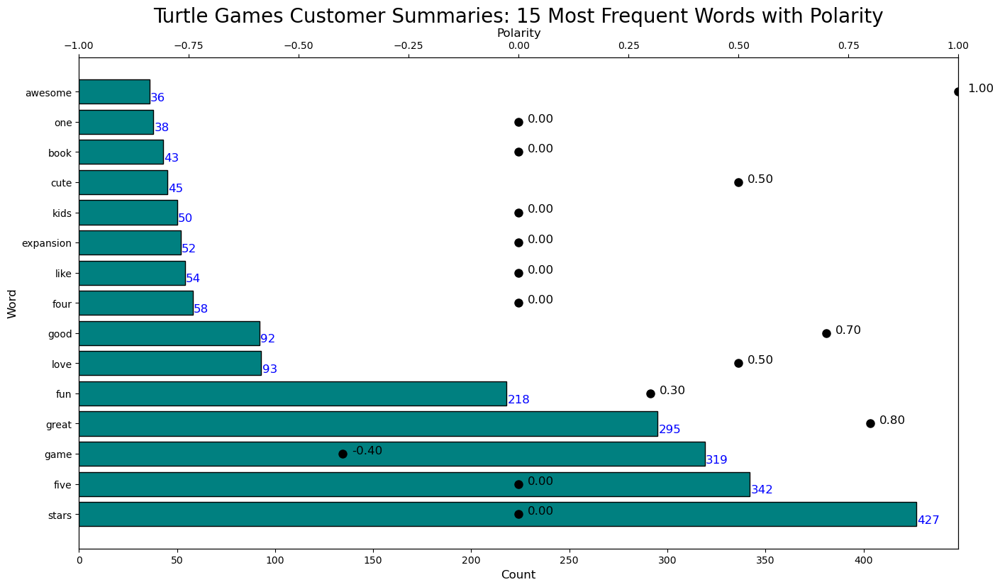

In [175]:
# Set the plot type for frequency on the primary axis.
fig, ax1 = plt.subplots(figsize=(16, 9))

# Plot frequency (bars on the first axis)
ax1.barh(summary_counts.index, summary_counts['Frequency'], color='teal', edgecolor='black')
ax1.set_xlabel('Count', fontsize=12)
ax1.set_ylabel('Word', fontsize=12)
ax1.set_title("Turtle Games Customer Summaries: 15 Most Frequent Words with Polarity", fontsize=20)

# Draw the frequency labels.
for i in ax1.patches:
    ax1.text(i.get_width() + 0.41, i.get_y() + 0.1, str(round(i.get_width(), 2)), fontsize=12, color='blue')

# Create a secondary axis for polarity.
ax2 = ax1.twiny()  # Twin axes sharing the same y-axis.

# Plot polarity on the secondary axis.
ax2.plot(summary_counts['Polarity'], summary_counts.index, 'o', color='black', markersize=8, label='Polarity')
ax2.set_xlabel('Polarity', fontsize=12)

# Set the limits for the secondary axis.
ax2.set_xlim(-1, 1)

# Draw the polarity labels next to the points (adjust the x position to avoid overlap).
for i, word in enumerate(summary_counts.index):
    ax2.text(
        summary_counts['Polarity'].iloc[i] + 0.02,  # Slightly adjust the x-position for better visibility
        i,
        f'{summary_counts["Polarity"].iloc[i]:.2f}',
        fontsize=12, 
        color='black', 
        ha='left'
    )

# Show the plot.
plt.show()


**Sentiment Polarity**

- Most words have either neutral (0.0) or positive polarity (between 0.3-0.8)
- "Game" is the only word with negative polarity (-0.4) in both charts

## 5. TextBlob: Review polarity and subjectivity: Plot histograms of polarity (use 15 bins) and subjectivity scores for the respective columns

In [176]:
# Provided function.
def generate_polarity(comment):
   """
   Extracts the sentiment polarity score for a given text comment.
   
   This function uses TextBlob to analyze the sentiment of the input text
   and returns a polarity score indicating whether the sentiment is 
   negative, neutral, or positive.
   
   Parameters:
   -----------
   comment : str
       The text comment to analyze for sentiment.
       
   Returns:
   --------
   float
       The sentiment polarity score, ranging from -1.0 (very negative)
       to 1.0 (very positive), with 0.0 representing neutral sentiment.
       
   Notes:
   ------
   - Requires the textblob package to be installed
   - Accesses only the polarity component [0] of TextBlob's sentiment tuple
   - The sentiment analysis is based on TextBlob's built-in algorithms
   """
   return TextBlob(comment).sentiment[0]

In [177]:
# Determine polarity of both columns. 
df3_copy['review_polarity'] = df3_copy['review'].apply(generate_polarity)
df3_copy['summary_polarity'] = df3_copy['summary'].apply(generate_polarity)

# View output.
df3_copy.head(10)

,review,summary,review_tokens,summary_tokens,review_tokens_no_sw,summary_tokens_no_sw,review_polarity,summary_polarity
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was...","[comes, dms, screen, space, screen, absolute, ...","[fact, space, wasted, art, terribly, informati...",-0.04,0.15
1,an open letter to galeforce9\n\nyour unpainted...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,...","[open, letter, unpainted, miniatures, bad, spe...","[another, worthless, dungeon, masters, screen]",0.04,-0.80
2,nice art nice printing why two panels are fil...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]","[nice, art, nice, printing, two, panels, fille...","[pretty, also, pretty, useless]",0.12,0.00
3,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]","[amazing, buy, bought, gift, new, dm, perfect]","[five, stars]",0.58,0.00
4,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]","[review, previous, screens, completely, unnece...","[money, trap]",-0.32,0.00
5,grandson loves,five stars,"[grandson, loves]","[five, stars]","[grandson, loves]","[five, stars]",0.00,0.00
6,i have bought many gm screens over the years b...,best gm screen ever,"[i, have, bought, many, gm, screens, over, the...","[best, gm, screen, ever]","[bought, many, gm, screens, years, one, best, ...","[best, gm, screen, ever]",0.66,1.00
7,came in perfect condition,five stars,"[came, in, perfect, condition]","[five, stars]","[came, perfect, condition]","[five, stars]",1.00,0.00
8,could be better but its still great i love the...,great but could be even better,"[could, be, better, but, its, still, great, i,...","[great, but, could, be, even, better]","[could, better, still, great, love, things, dm...","[great, could, even, better]",0.37,0.65
9,my review will mirror others in that this kind...,another missed opportunity not a value add to...,"[my, review, will, mirror, others, in, that, t...","[another, missed, opportunity, not, a, value, ...","[review, mirror, others, kind, misses, mark, l...","[another, missed, opportunity, value, add, pro...",0.15,0.00


In [178]:
def generate_subjectivity(comment):
   """
   Extracts the subjectivity score for a given text comment.
   
   This function uses TextBlob to analyze the subjectivity of the input text
   and returns a score indicating whether the text is objective or subjective.
   
   Parameters:
   -----------
   comment : str
       The text comment to analyze for subjectivity.
       
   Returns:
   --------
   float
       The subjectivity score, ranging from 0.0 (completely objective)
       to 1.0 (completely subjective).
       
   Notes:
   ------
   - Requires the textblob package to be installed
   - Accesses only the subjectivity component [1] of TextBlob's sentiment tuple
   - Objective text typically states facts, while subjective text expresses
     opinions, emotions, or personal perspectives
   """
   return TextBlob(comment).sentiment[1]

In [179]:
# Determine subjectivity of both columns. 
df3_copy['review_subjectivity'] = df3_copy['review'].apply(generate_subjectivity)
df3_copy['summary_subjectivity'] = df3_copy['summary'].apply(generate_subjectivity)
df3_copy.head(10)

,review,summary,review_tokens,summary_tokens,review_tokens_no_sw,summary_tokens_no_sw,review_polarity,summary_polarity,review_subjectivity,summary_subjectivity
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was...","[comes, dms, screen, space, screen, absolute, ...","[fact, space, wasted, art, terribly, informati...",-0.04,0.15,0.49,0.50
1,an open letter to galeforce9\n\nyour unpainted...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,...","[open, letter, unpainted, miniatures, bad, spe...","[another, worthless, dungeon, masters, screen]",0.04,-0.80,0.44,0.90
2,nice art nice printing why two panels are fil...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]","[nice, art, nice, printing, two, panels, fille...","[pretty, also, pretty, useless]",0.12,0.00,0.43,0.73
3,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]","[amazing, buy, bought, gift, new, dm, perfect]","[five, stars]",0.58,0.00,0.78,0.00
4,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]","[review, previous, screens, completely, unnece...","[money, trap]",-0.32,0.00,0.32,0.00
5,grandson loves,five stars,"[grandson, loves]","[five, stars]","[grandson, loves]","[five, stars]",0.00,0.00,0.00,0.00
6,i have bought many gm screens over the years b...,best gm screen ever,"[i, have, bought, many, gm, screens, over, the...","[best, gm, screen, ever]","[bought, many, gm, screens, years, one, best, ...","[best, gm, screen, ever]",0.66,1.00,0.70,0.30
7,came in perfect condition,five stars,"[came, in, perfect, condition]","[five, stars]","[came, perfect, condition]","[five, stars]",1.00,0.00,1.00,0.00
8,could be better but its still great i love the...,great but could be even better,"[could, be, better, but, its, still, great, i,...","[great, but, could, be, even, better]","[could, better, still, great, love, things, dm...","[great, could, even, better]",0.37,0.65,0.46,0.62
9,my review will mirror others in that this kind...,another missed opportunity not a value add to...,"[my, review, will, mirror, others, in, that, t...","[another, missed, opportunity, not, a, value, ...","[review, mirror, others, kind, misses, mark, l...","[another, missed, opportunity, value, add, pro...",0.15,0.00,0.49,0.00


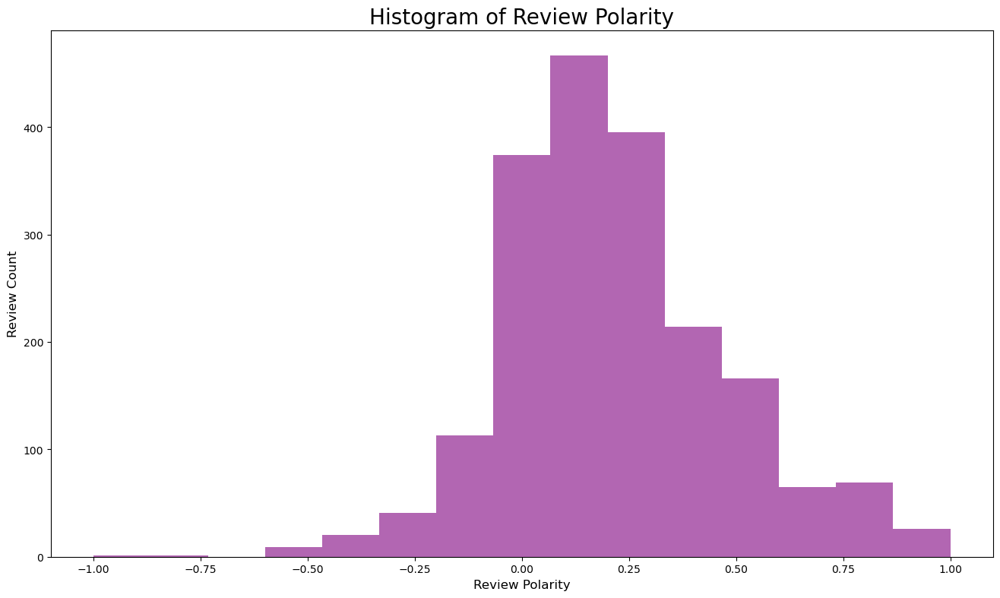

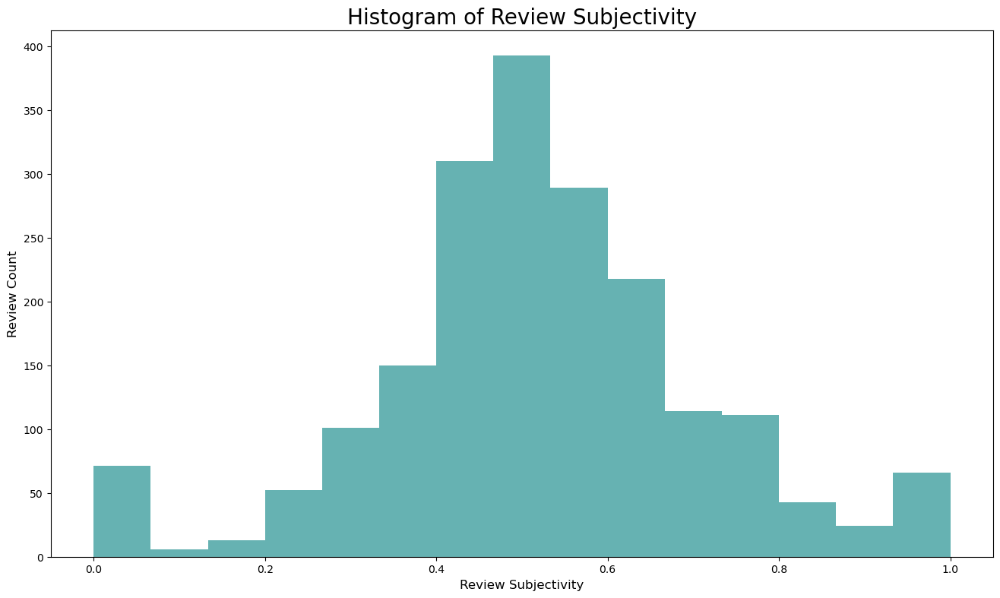

In [180]:
# Review: Create a histogram plot with bins = 15.

# Histogram of polarity

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df3_copy['review_polarity'], bins=15, facecolor='purple', alpha=0.6)

# Set the labels.
plt.xlabel('Review Polarity', fontsize=12)
plt.ylabel('Review Count', fontsize=12)
plt.title('Histogram of Review Polarity', fontsize=20)

plt.show()


# Histogram of sentiment score

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df3_copy['review_subjectivity'], bins=15, facecolor='teal', alpha=0.6)

# Set the labels.
plt.xlabel('Review Subjectivity', fontsize=12)
plt.ylabel('Review Count', fontsize=12)
plt.title('Histogram of Review Subjectivity', fontsize=20)

plt.show()

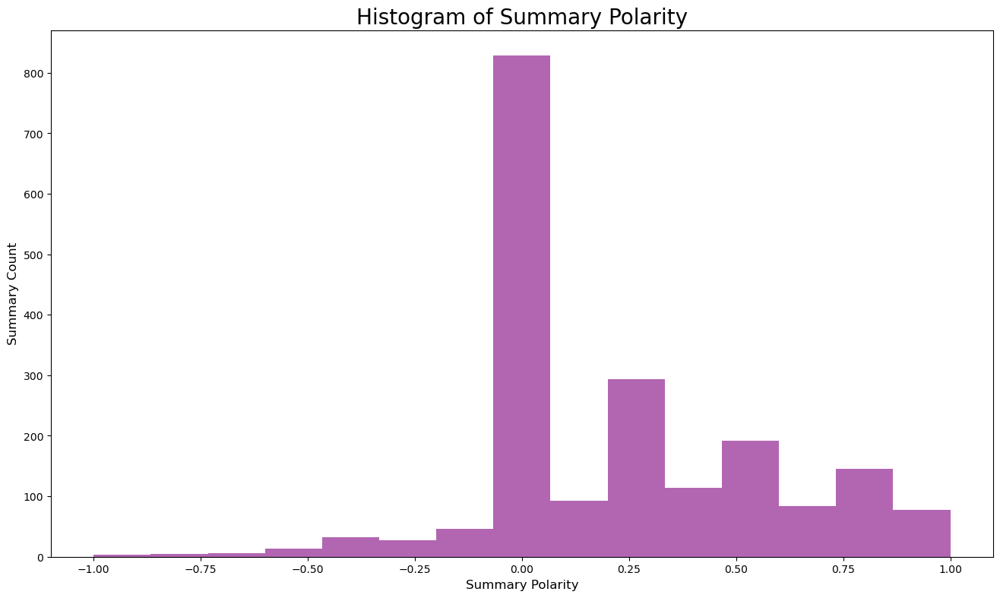

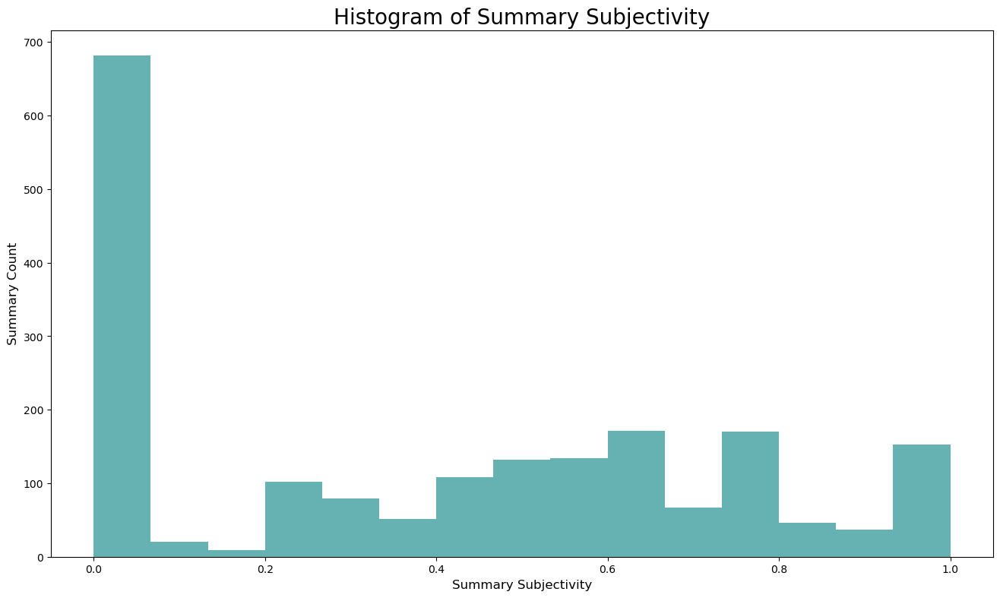

In [181]:
# Summary: Create a histogram plot with bins = 15.
# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df3_copy['summary_polarity'], bins=15, facecolor='purple', alpha=0.6)

# Set the labels.
plt.xlabel('Summary Polarity', fontsize=12)
plt.ylabel('Summary Count', fontsize=12)
plt.title('Histogram of Summary Polarity', fontsize=20)

plt.show()


# Histogram of sentiment score

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df3_copy['summary_subjectivity'], bins=15, facecolor='teal', alpha=0.6)

# Set the labels.
plt.xlabel('Summary Subjectivity', fontsize=12)
plt.ylabel('Summary Count', fontsize=12)
plt.title('Histogram of Summary Subjectivity', fontsize=20)

plt.show()


- The extreme difference between review and summary subjectivity distributions suggests that summaries may be deliberately crafted to be more objective, even when based on subjective reviews. Perhaps it is harder to convey enough emotions/feelings when writing summaries.

## 6. TextBlob: Identify top 20 positive and negative reviews and summaries respectively

In [182]:
# Top 20 negative reviews.
pd.set_option('display.max_colwidth', None) 

top_negative_reviews = df3_copy.sort_values(by='review_polarity', ascending=True).head(20)

# Reset the index to start at 0 and increment it by 1 to start at 1
top_negative_reviews = top_negative_reviews.reset_index(drop=True)
top_negative_reviews.index += 1

# Create a DataFrame with the 'review_polarity' column
top_negative_reviews_df = top_negative_reviews[['review', 'review_polarity']]

# Format the 'review_polarity' column to display values rounded to 3 decimal places
top_negative_reviews_df['review_polarity'] = top_negative_reviews_df['review_polarity'].apply(lambda x: round(x, 3))

# Display the entire DataFrame with a table format
print("\nTop 20 Negative Reviews:")
display(top_negative_reviews_df)


Top 20 Negative Reviews:


,review,review_polarity
1,booo unles you are patient know how to measure i didnt have the patience neither did my daughter boring unless you are a craft person which i am not,-1.00
2,incomplete kit very disappointing,-0.78
3,im sorry i just find this product to be boring and to be frank juvenile,-0.58
4,one of my staff will be using this game soon so i dont know how well it works as yet but after looking at the cards i believe it will be helpful in getting a conversation started regarding anger and what to do to control it,-0.55
5,expensive for what you get,-0.50
6,i bought this as a christmas gift for my grandson its a sticker book so how can i go wrong with this gift,-0.50
7,i found the directions difficult,-0.50
8,instructions are complicated to follow,-0.50
9,difficult,-0.50
10,this was a gift for my daughter i found it difficult to use,-0.50


In [183]:
# Top 20 negative summaries.
pd.set_option('display.max_colwidth', None) 

# Sort the DataFrame by 'summary_polarity' in ascending order to get the most negative summaries first
top_negative_summaries = df3_copy.sort_values(by='summary_polarity', ascending=True).head(20)

# Reset the index to start at 0 and increment it by 1 to start at 1
top_negative_summaries = top_negative_summaries.reset_index(drop=True)
top_negative_summaries.index += 1

# Create a DataFrame with the 'summary' and 'summary_polarity' columns
top_negative_summaries_df = top_negative_summaries[['summary', 'summary_polarity']]

# Format the 'summary_polarity' column to display values rounded to 3 decimal places
top_negative_summaries_df['summary_polarity'] = top_negative_summaries_df['summary_polarity'].apply(lambda x: round(x, 3))


# Display the entire DataFrame with a table format
print("\nTop 20 Negative Summaries:")
display(top_negative_summaries_df)


Top 20 Negative Summaries:


,summary,summary_polarity
1,boring unless you are a craft person which i am,-1.00
2,the worst value ive ever seen,-1.00
3,boring,-1.00
4,before this i hated running any rpg campaign dealing with towns because it,-0.90
5,another worthless dungeon masters screen from galeforce9,-0.80
6,disappointed,-0.75
7,disappointed,-0.75
8,disappointed,-0.75
9,disappointed,-0.75
10,promotes anger instead of teaching calming methods,-0.70


In [184]:
# Top 20 positive reviews.
pd.set_option('display.max_colwidth', None) 

# Sort the DataFrame by 'review_polarity' in descending order to get the most positive reviews first.
top_positive_reviews = df3_copy.sort_values(by='review_polarity', ascending=False).head(20)

# Reset the index to start at 0 and increment it by 1 to start at 1
top_positive_reviews = top_positive_reviews.reset_index(drop=True)
top_positive_reviews.index += 1

# Create a DataFrame with the 'review_polarity' column
top_positive_reviews_df = top_positive_reviews[['review', 'review_polarity']]

# Format the 'review_polarity' column to display values rounded to 3 decimal places
top_positive_reviews_df['review_polarity'] = round(top_positive_reviews_df['review_polarity'], 3)

# Display the entire DataFrame with a table format
print("\nTop 20 Positive Reviews:")
display(top_positive_reviews_df)


Top 20 Positive Reviews:


,review,review_polarity
1,perfect,1.00
2,excellent toy to simulate thought,1.00
3,awesome gift,1.00
4,perfect for tutoring my grandson in spelling,1.00
5,awesome addition to my rpg gm system,1.00
6,best set buy 2 if you have the means,1.00
7,perfect just what i ordered,1.00
8,awesome toy,1.00
9,it is the best thing to play with and also mind blowing in some ways,1.00
10,wonderful for my grandson to learn the resurrection story,1.00


In [185]:
# Top 20 positive summaries.
pd.set_option('display.max_colwidth', None) 

top_positive_summaries = df3_copy.sort_values(by='summary_polarity', ascending=False).head(20)

# Reset the index to start at 0 and increment it by 1 to start at 1
top_positive_summaries = top_positive_summaries.reset_index(drop=True)
top_positive_summaries.index += 1

# Create a DataFrame with the 'summary' and 'summary_polarity' columns
top_positive_summaries_df = top_positive_summaries[['summary', 'summary_polarity']]

# Format the 'summary_polarity' column to display values rounded to 3 decimal places
top_positive_summaries_df['summary_polarity'] = round(top_positive_summaries_df['summary_polarity'], 3)


# Display the entire DataFrame with a table format
print("\nTop 20 Positive Summaries:")
display(top_positive_summaries_df)


Top 20 Positive Summaries:


,summary,summary_polarity
1,one of the best,1.00
2,excellent,1.00
3,one of the best games ever,1.00
4,awesome learning tool,1.00
5,he was very happy with his gift,1.00
6,best orcs from wotc,1.00
7,awesome expansion,1.00
8,perfect gift,1.00
9,awesome sticker activity for the price,1.00
10,awesome,1.00


**Positive Aspects**

- Many items are highly praised as "perfect gifts" with consistent 1.00 polarity ratings
- Educational value is emphasized (tutoring, teaching self-management, learning tools)


**Negative Aspects**

- Difficulty level is a common complaint ("instructions are complicated," "difficult")
- Many users found certain products "boring" unless they have specific interests
- Some products appear to have quality/completeness issues ("incomplete kit," "bad quality")
- Value concerns ("expensive for what you get")
- Age appropriateness issues (some items too difficult for intended child users)

**Mixed Signals**

- Interestingly, some negative reviews (items 15, 16, 19, 20) appear positive in content ("loves the game," "this game is a blast") despite negative polarity scores
- Some reviews suggest items are too complex for children but might be appropriate for adults (improper labelling?)

In [186]:
df3_copy.describe()

,review_polarity,summary_polarity,review_subjectivity,summary_subjectivity
count,1961.00,1961.00,1961.00,1961.00
mean,0.21,0.22,0.52,0.39
std,0.26,0.34,0.19,0.34
min,-1.00,-1.00,0.00,0.00
25%,0.05,0.00,0.42,0.00
50%,0.18,0.10,0.51,0.40
75%,0.35,0.47,0.60,0.65
max,1.00,1.00,1.00,1.00


## 7. Discuss: Insights and observations

***See relevant sections above***

## 8. VADER Analysis

In [187]:
# Load the data set as df3.
df6 = reviews[['review', 'summary']]

# View DataFrame.
df6.head()

,review,summary
0,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...
1,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves.\n\nIn short, stop making crap DM screens.",Another worthless Dungeon Master's screen from GaleForce9
2,"Nice art, nice printing. Why two panels are filled with a general Forgotten Realms map is beyond me. Most of one of them is all blue ocean. Such a waste.\n\nI don't understand why they can't make these DM Screens more useful for these ""kinds of adventures"" rather than solely the specific adventure. You're supposed to be able to transpose this adventure to other lands outside the Forgotten Realms. So even just a list of new monsters or NPCs would at least be useful than the map. Even more would just be stuff related to running the game but broad-use stuff related to giants.\n\nSame thing with Curse of Strahd. Why not make it useful for raven loft, undead or horror campaigns in general... instead a huge amount of screen space is solely mapping out Castle Ravenloft, which is only useful during a small fraction of the time even for the Curse of Strahd adventure, let alone various other Ravenloft adventuring.\n\nThey really kill the extended use of these screens by not thinking about their potential use, both for the adventure in question, as well as use in a broader sense.\n\nThe Rage of Demons screen is far more useful for broad under dark adventuring - covering a lot of rules for the various conditions you may suffer... and the map is only one panel.\n\nThis Storm Giants one is decent for a few tables it includes - but really misses the mark. Maybe they should ask a few DMs what they would use?","pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new dm and it's perfect!,Five Stars
4,"As my review of GF9's previous screens these were completely unnecessary and nearly useless. Skip them, this is the definition of a waste of money.",Money trap


In [188]:
df6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   review   2000 non-null   object
 1   summary  2000 non-null   object
dtypes: object(2)
memory usage: 31.4+ KB


In [189]:
# Determine if there are any missing values.
df6.isnull().sum()

review     0
summary    0
dtype: int64

In [190]:
df6.duplicated().sum()

18

In [191]:
# View duplicates
df6dup = df6[df6.duplicated(keep=False)]
df6dup

,review,summary
48,love it,Five Stars
55,Great!,Five Stars
94,great,Five Stars
294,Good,Five Stars
326,love it,Five Stars
371,Great!,Five Stars
408,great,Five Stars
416,love it,Five Stars
430,Love it,Five Stars
702,Love these!,Five Stars


In [192]:
# Drop duplicated in df3.
#df6.drop_duplicates(inplace=True, ignore_index=True)

# Reset the index
#df6.reset_index()

# Check shape of df3
#df6.shape

### 8a) Text Processing

In [193]:
# Preprocessing function
def preprocess_text(text):
   """
   Preprocesses text data for natural language processing tasks.
   
   This function performs multiple text cleaning operations to standardize
   and simplify text for analysis, including expanding contractions, removing
   URLs, hashtags, and punctuation, converting to lowercase, and removing
   stopwords (except 'not').
   
   Parameters:
   -----------
   text : str
       The raw text string to be preprocessed.
       
   Returns:
   --------
   str
       The cleaned and preprocessed text.
       
   Notes:
   ------
   - Requires the contractions, re, and nltk.corpus.stopwords packages
   - Preserves the word 'not' which is important for sentiment analysis
   - Processing steps:
     1. Expands contractions (e.g., "don't" → "do not")
     2. Removes URLs
     3. Removes hashtag symbols
     4. Removes punctuation and special characters
     5. Converts text to lowercase
     6. Removes English stopwords except 'not'
   """
   text = contractions.fix(text)  # Expand contractions
   text = re.sub(r'http\S+', '', text)  # Remove URLs
   text = re.sub(r'#', '', text)  # Remove hashtags 
   text = re.sub(r'[^\w\s]', '', text)  # Remove non-alphanumeric characters (keeping spaces)
   text = text.lower()  # Convert to lowercase
   
   # Remove stopwords, excluding 'not'
   stop_words = set(stopwords.words('english')) - {'not'}
   text = ' '.join([word for word in text.split() if word not in stop_words])
   
   return text

# Apply the cleaning function to your DataFrame
df6['cleaned_review'] = df6['review'].apply(preprocess_text)
df6['cleaned_summary'] = df6['summary'].apply(preprocess_text)

In [194]:
df6.head()

,review,summary,cleaned_review,cleaned_summary
0,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,comes dms screen space screen absolute premium fact 50 space wasted art not terribly informative needed art well makes completely useless reason gave 2 stars not 1 technically speaking least still stand block notes dice rolls drops ball completely,fact 50 space wasted art not terribly informative needed art
1,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves.\n\nIn short, stop making crap DM screens.",Another worthless Dungeon Master's screen from GaleForce9,open letter galeforce9 unpainted miniatures not bad spell cards great board games meh dm screens however freaking terrible still waiting single screen not polluted pointless artwork useful referenceable tables created single use screen useful running storm kings thunder adventure even despite fact geared adventure path usefulness negligible best massive swath inner panel wasted artwork bloated overland map could easily reduced single panel size table nighuseless short stop making crap dm screens,another worthless dungeon masters screen galeforce9
2,"Nice art, nice printing. Why two panels are filled with a general Forgotten Realms map is beyond me. Most of one of them is all blue ocean. Such a waste.\n\nI don't understand why they can't make these DM Screens more useful for these ""kinds of adventures"" rather than solely the specific adventure. You're supposed to be able to transpose this adventure to other lands outside the Forgotten Realms. So even just a list of new monsters or NPCs would at least be useful than the map. Even more would just be stuff related to running the game but broad-use stuff related to giants.\n\nSame thing with Curse of Strahd. Why not make it useful for raven loft, undead or horror campaigns in general... instead a huge amount of screen space is solely mapping out Castle Ravenloft, which is only useful during a small fraction of the time even for the Curse of Strahd adventure, let alone various other Ravenloft adventuring.\n\nThey really kill the extended use of these screens by not thinking about their potential use, both for the adventure in question, as well as use in a broader sense.\n\nThe Rage of Demons screen is far more useful for broad under dark adventuring - covering a lot of rules for the various conditions you may suffer... and the map is only one panel.\n\nThis Storm Giants one is decent for a few tables it includes - but really misses the mark. Maybe they should ask a few DMs what they would use?","pretty, but also pretty useless",nice art nice printing two panels filled general forgotten realms map beyond one blue ocean waste not understand cannot make dm screens useful kinds adventures rather solely specific adventure supposed able transpose adventure lands outside forgotten realms even list new monst

### 8b) Tokenization

In [195]:
df6['tokenized_review'] = df6['cleaned_review'].apply(word_tokenize)
df6['tokenized_summary'] = df6['cleaned_summary'].apply(word_tokenize)

In [196]:
df6.head()

,review,summary,cleaned_review,cleaned_summary,tokenized_review,tokenized_summary
0,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,comes dms screen space screen absolute premium fact 50 space wasted art not terribly informative needed art well makes completely useless reason gave 2 stars not 1 technically speaking least still stand block notes dice rolls drops ball completely,fact 50 space wasted art not terribly informative needed art,"[comes, dms, screen, space, screen, absolute, premium, fact, 50, space, wasted, art, not, terribly, informative, needed, art, well, makes, completely, useless, reason, gave, 2, stars, not, 1, technically, speaking, least, still, stand, block, notes, dice, rolls, drops, ball, completely]","[fact, 50, space, wasted, art, not, terribly, informative, needed, art]"
1,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves.\n\nIn short, stop making crap DM screens.",Another worthless Dungeon Master's screen from GaleForce9,open letter galeforce9 unpainted miniatures not bad spell cards great board games meh dm screens however freaking terrible still waiting single screen not polluted pointless artwork useful referenceable tables created single use screen useful running storm kings thunder adventure even despite fact geared adventure path usefulness negligible best massive swath inner panel wasted artwork bloated overland map could easily reduced single panel size table nighuseless short stop making crap dm screens,another worthless dungeon masters screen galeforce9,"[open, letter, galeforce9, unpainted, miniatures, not, bad, spell, cards, great, board, games, meh, dm, screens, however, freaking, terrible, still, waiting, single, screen, not, polluted, pointless, artwork, useful, referenceable, tables, created, single, use, screen, useful, running, storm, kings, thunder, adventure, even, despite, fact, geared, adventure, path, usefulness, negligible, best, massive, swath, inner, panel, wasted, artwork, bloated, overland, map, could, easily, reduced, single, panel, size, table, nighuseless, short, stop, making, crap, dm, screens]","[another, worthless, dungeon, masters, screen, galeforce9]"
2,"Nice art, nice printing. Why two panels are filled with a general Forgotten Realms map is beyond me. Most of one of them is all blue ocean. Such a waste.\n\nI don't understand why they can't make these DM Screens more useful for these ""kinds of adventures"" rather than solely the specific adventure. You're supposed to be able to transpose this adventure to other lands outside the Forgotten Realms. So even just a list of new monsters or NPCs would at least be useful than the map. Even more would just be stuff related to running the game but broad-use stuff related to giants.\n\nSame thing with Curse of Strahd. Why not make it useful for raven loft, undead or horror campaigns in general.

### 8c) Lemmatization

In [197]:
# Mapping of POS tags to WordNet POS tags - Part of Speech Tagging
tag_map = defaultdict(lambda: wn.NOUN)
tag_map['J'] = wn.ADJ
tag_map['V'] = wn.VERB
tag_map['R'] = wn.ADV

lemma_function = WordNetLemmatizer()

def lemmatize_tokens(tokens):
   """
   Lemmatizes a list of tokens with part-of-speech awareness.
   
   This function performs lemmatization on each token while considering its 
   part-of-speech tag to improve accuracy. It converts words to their base or 
   dictionary form (e.g., "running" → "run", "better" → "good").
   
   Parameters:
   -----------
   tokens : list
       A list of string tokens to be lemmatized.
       
   Returns:
   --------
   list
       A list of lemmatized tokens.
       
   Notes:
   ------
   - Requires the nltk.tag.pos_tag function
   - Uses a global lemmatizer object (lemma_function)
   - Relies on a global tag_map dictionary that maps NLTK POS tags to WordNet POS tags
   - The POS tagging improves lemmatization accuracy by providing context
   
   Example:
   --------
   >>> lemmatize_tokens(['running', 'better', 'cars'])
   ['run', 'good', 'car']
   """
   lemmatized_tokens = [lemma_function.lemmatize(token, tag_map[tag[0]]) for token, tag in pos_tag(tokens)]
   return lemmatized_tokens

In [198]:
df6['lemmatized_review'] = df6['tokenized_review'].apply(lemmatize_tokens)
df6['lemmatized_summary'] = df6['tokenized_summary'].apply(lemmatize_tokens)

In [199]:
df6.head()

,review,summary,cleaned_review,cleaned_summary,tokenized_review,tokenized_summary,lemmatized_review,lemmatized_summary
0,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,comes dms screen space screen absolute premium fact 50 space wasted art not terribly informative needed art well makes completely useless reason gave 2 stars not 1 technically speaking least still stand block notes dice rolls drops ball completely,fact 50 space wasted art not terribly informative needed art,"[comes, dms, screen, space, screen, absolute, premium, fact, 50, space, wasted, art, not, terribly, informative, needed, art, well, makes, completely, useless, reason, gave, 2, stars, not, 1, technically, speaking, least, still, stand, block, notes, dice, rolls, drops, ball, completely]","[fact, 50, space, wasted, art, not, terribly, informative, needed, art]","[come, dms, screen, space, screen, absolute, premium, fact, 50, space, waste, art, not, terribly, informative, need, art, well, make, completely, useless, reason, give, 2, star, not, 1, technically, speak, least, still, stand, block, note, dice, roll, drop, ball, completely]","[fact, 50, space, waste, art, not, terribly, informative, need, art]"
1,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves.\n\nIn short, stop making crap DM screens.",Another worthless Dungeon Master's screen from GaleForce9,open letter galeforce9 unpainted miniatures not bad spell cards great board games meh dm screens however freaking terrible still waiting single screen not polluted pointless artwork useful referenceable tables created single use screen useful running storm kings thunder adventure even despite fact geared adventure path usefulness negligible best massive swath inner panel wasted artwork bloated overland map could easily reduced single panel size table nighuseless short stop making crap dm screens,another worthless dungeon masters screen galeforce9,"[open, letter, galeforce9, unpainted, miniatures, not, bad, spell, cards, great, board, games, meh, dm, screens, however, freaking, terrible, still, waiting, single, screen, not, polluted, pointless, artwork, useful, referenceable, tables, created, single, use, screen, useful, running, storm, kings, thunder, adventure, even, despite, fact, geared, adventure, path, usefulness, negligible, best, massive, swath, inner, panel, wasted, artwork, bloated, overland, map, could, easily, reduced, single, panel, size, table, nighuseless, short, stop, making, crap, dm, screens]","[another, worthless, dungeon, masters, screen, galeforce9]","[open, letter, galeforce9, unpainted, miniature, not, bad, spell, card, great, board, game, meh, dm, screen, however, freak, terrible, still, wait, single, screen, not, polluted, pointless, artwork, useful, referenceable, table, create, single, use, screen, useful, run, storm, king, thunder, adventure, even, d

### 8d) Applying Sentiment (VADER)

In [200]:
analyzer = SentimentIntensityAnalyzer()

def analyze_sentiment(text):
   """
   Performs sentiment analysis on tokenized text using VADER.
   
   This function calculates sentiment scores for a list of tokens by joining them
   into a single string and passing it to the VADER sentiment analyzer, which
   returns a dictionary of sentiment metrics.
   
   Parameters:
   -----------
   text : list
       A list of tokens (strings) to analyze for sentiment.
       
   Returns:
   --------
   dict
       A dictionary containing sentiment scores with the following keys:
       - 'neg': Negative sentiment score (0-1)
       - 'neu': Neutral sentiment score (0-1)
       - 'pos': Positive sentiment score (0-1)
       - 'compound': Normalized aggregate score (-1 to +1)
       
   Notes:
   ------
   - Requires the NLTK VADER sentiment analyzer
   - Uses a global 'analyzer' object which should be instantiated as
     nltk.sentiment.vader.SentimentIntensityAnalyzer()
   - The compound score is the most useful metric for a single dimension 
     of sentiment (-1 being extremely negative, +1 being extremely positive)
   """
   return analyzer.polarity_scores(' '.join(text))

df6['sentiment_scores_review'] = df6['lemmatized_review'].apply(analyze_sentiment)
df6['sentiment_scores_summary'] = df6['lemmatized_summary'].apply(analyze_sentiment)

In [201]:
df6.head()

,review,summary,cleaned_review,cleaned_summary,tokenized_review,tokenized_summary,lemmatized_review,lemmatized_summary,sentiment_scores_review,sentiment_scores_summary
0,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,comes dms screen space screen absolute premium fact 50 space wasted art not terribly informative needed art well makes completely useless reason gave 2 stars not 1 technically speaking least still stand block notes dice rolls drops ball completely,fact 50 space wasted art not terribly informative needed art,"[comes, dms, screen, space, screen, absolute, premium, fact, 50, space, wasted, art, not, terribly, informative, needed, art, well, makes, completely, useless, reason, gave, 2, stars, not, 1, technically, speaking, least, still, stand, block, notes, dice, rolls, drops, ball, completely]","[fact, 50, space, wasted, art, not, terribly, informative, needed, art]","[come, dms, screen, space, screen, absolute, premium, fact, 50, space, waste, art, not, terribly, informative, need, art, well, make, completely, useless, reason, give, 2, star, not, 1, technically, speak, least, still, stand, block, note, dice, roll, drop, ball, completely]","[fact, 50, space, waste, art, not, terribly, informative, need, art]","{'neg': 0.223, 'neu': 0.675, 'pos': 0.103, 'compound': -0.7067}","{'neg': 0.204, 'neu': 0.583, 'pos': 0.213, 'compound': 0.032}"
1,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves.\n\nIn short, stop making crap DM screens.",Another worthless Dungeon Master's screen from GaleForce9,open letter galeforce9 unpainted miniatures not bad spell cards great board games meh dm screens however freaking terrible still waiting single screen not polluted pointless artwork useful referenceable tables created single use screen useful running storm kings thunder adventure even despite fact geared adventure path usefulness negligible best massive swath inner panel wasted artwork bloated overland map could easily reduced single panel size table nighuseless short stop making crap dm screens,another worthless dungeon masters screen galeforce9,"[open, letter, galeforce9, unpainted, miniatures, not, bad, spell, cards, great, board, games, meh, dm, screens, however, freaking, terrible, still, waiting, single, screen, not, polluted, pointless, artwork, useful, referenceable, tables, created, single, use, screen, useful, running, storm, kings, thunder, adventure, even, despite, fact, geared, adventure, path, usefulness, negligible, best, massive, swath, inner, panel, wasted, artwork, bloated, overland, map, could, easily, reduced, single, panel, size, table, nighuseless, short, stop, making, crap, dm, screens]","[another, worthless, dungeon, masters, screen, galeforce9]","[open, letter, galeforce9, unpainted, miniature, not, bad, spell, card, great, board, game, meh, dm, screen, however, freak, terribl

**VADER Metrics:**

- These three scores represent ratios of text that fall into each category (they sum to 1)
1. Positive sentiment (0.0 to 1.0)
2. Neutral sentiment (0.0 to 1.0)
3. Negative sentiment (0.0 to 1.0)

4. Compound sentiment (-1.0 to 1.0)
- A normalized, weighted score of overall sentiment.
- Interpreted as: > 0.05 = Positive, between -0.05 and 0.05 = Neutral, < -0.05 = Negative

In [202]:
# Extract individual sentiment scores (review)
df6['neg_review'] = df6['sentiment_scores_review'].apply(lambda x: x['neg'])
df6['neu_review'] = df6['sentiment_scores_review'].apply(lambda x: x['neu'])
df6['pos_review'] = df6['sentiment_scores_review'].apply(lambda x: x['pos'])
df6['compound_review'] = df6['sentiment_scores_review'].apply(lambda x: x['compound'])

# Determine overall sentiment
def get_sentiment_label_review(compound_review):
    """
    Convert a compound sentiment score into a sentiment label(review).
    """
    if compound_review >= 0.05:
        return 'positive'
    elif compound_review <= -0.05:
        return 'negative'
    else:
        return 'neutral'
        
df6['overall_sentiment_review'] = df6['compound_review'].apply(get_sentiment_label_review)

In [203]:
# Extract individual sentiment scores (summary)
df6['neg_summary'] = df6['sentiment_scores_summary'].apply(lambda x: x['neg'])
df6['neu_summary'] = df6['sentiment_scores_summary'].apply(lambda x: x['neu'])
df6['pos_summary'] = df6['sentiment_scores_summary'].apply(lambda x: x['pos'])
df6['compound_summary'] = df6['sentiment_scores_summary'].apply(lambda x: x['compound'])

# Determine overall sentiment
def get_sentiment_label_summary(compound_summary):
    """
    Convert a compound sentiment score into a sentiment label(summary).
    """
    if compound_summary >= 0.05:
        return 'positive'
    elif compound_summary <= -0.05:
        return 'negative'
    else:
        return 'neutral'
        
df6['overall_sentiment_summary'] = df6['compound_summary'].apply(get_sentiment_label_summary)

In [204]:
df6.head()

,review,summary,cleaned_review,cleaned_summary,tokenized_review,tokenized_summary,lemmatized_review,lemmatized_summary,sentiment_scores_review,sentiment_scores_summary,neg_review,neu_review,pos_review,compound_review,overall_sentiment_review,neg_summary,neu_summary,pos_summary,compound_summary,overall_sentiment_summary
0,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,comes dms screen space screen absolute premium fact 50 space wasted art not terribly informative needed art well makes completely useless reason gave 2 stars not 1 technically speaking least still stand block notes dice rolls drops ball completely,fact 50 space wasted art not terribly informative needed art,"[comes, dms, screen, space, screen, absolute, premium, fact, 50, space, wasted, art, not, terribly, informative, needed, art, well, makes, completely, useless, reason, gave, 2, stars, not, 1, technically, speaking, least, still, stand, block, notes, dice, rolls, drops, ball, completely]","[fact, 50, space, wasted, art, not, terribly, informative, needed, art]","[come, dms, screen, space, screen, absolute, premium, fact, 50, space, waste, art, not, terribly, informative, need, art, well, make, completely, useless, reason, give, 2, star, not, 1, technically, speak, least, still, stand, block, note, dice, roll, drop, ball, completely]","[fact, 50, space, waste, art, not, terribly, informative, need, art]","{'neg': 0.223, 'neu': 0.675, 'pos': 0.103, 'compound': -0.7067}","{'neg': 0.204, 'neu': 0.583, 'pos': 0.213, 'compound': 0.032}",0.22,0.68,0.10,-0.71,negative,0.20,0.58,0.21,0.03,neutral
1,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves.\n\nIn short, stop making crap DM screens.",Another worthless Dungeon Master's screen from GaleForce9,open letter galeforce9 unpainted miniatures not bad spell cards great board games meh dm screens however freaking terrible still waiting single screen not polluted pointless artwork useful referenceable tables created single use screen useful running storm kings thunder adventure even despite fact geared adventure path usefulness negligible best massive swath inner panel wasted artwork bloated overland map could easily reduced single panel size table nighuseless short stop making crap dm screens,another worthless dungeon masters screen galeforce9,"[open, letter, galeforce9, unpainted, miniatures, not, bad, spell, cards, great, board, games, meh, dm, screens, however, freaking, terrible, still, waiting, single, screen, not, polluted, pointless, artwork, useful, referenceable, tables, created, single, use, screen, useful, running, storm, kings, thunder, adventure, even, despite, fact, geared, adventure, path, usefulness, negligible, best, massive, swath, inner, panel, wasted, artwork, bloated, overland, map, could, easily, reduced, single, panel, size, table, nighuseless, short, stop, making, cra

### 8e) Plot Generation

In [205]:
sentiment_labels_review = df6['overall_sentiment_review']
sentiment_labels_summary = df6['overall_sentiment_summary']

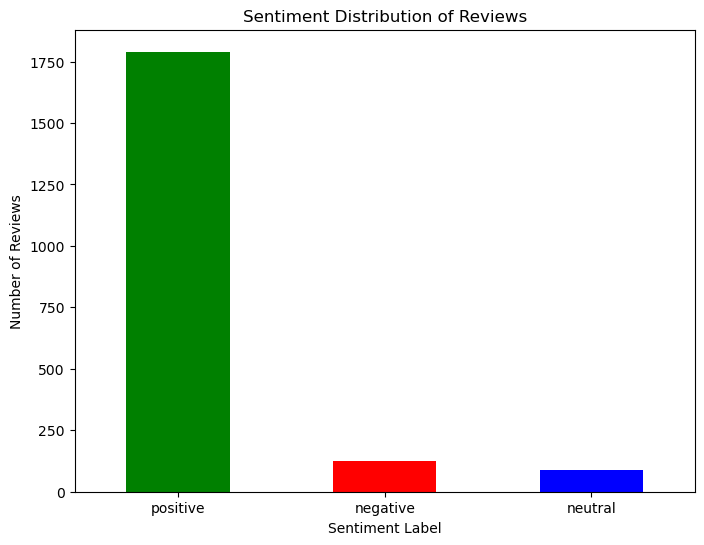

In [206]:
# Sentiment distribution visualization
plt.figure(figsize=(8, 6))
pd.Series(sentiment_labels_review).value_counts().plot(kind='bar', color=['green', 'red', 'blue'])
plt.title("Sentiment Distribution of Reviews")
plt.xlabel("Sentiment Label")
plt.ylabel("Number of Reviews")
plt.xticks(rotation=0)
plt.show()

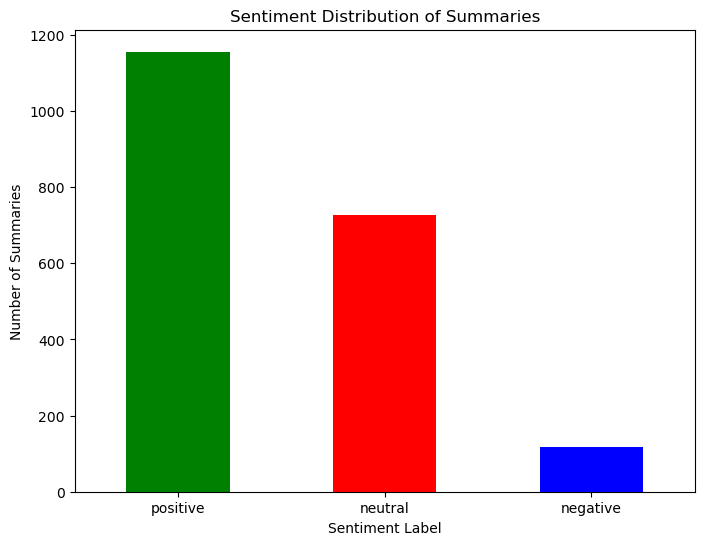

In [207]:
# Sentiment distribution visualization
plt.figure(figsize=(8, 6))
pd.Series(sentiment_labels_summary).value_counts().plot(kind='bar', color=['green', 'red', 'blue'])
plt.title("Sentiment Distribution of Summaries")
plt.xlabel("Sentiment Label")
plt.ylabel("Number of Summaries")
plt.xticks(rotation=0)
plt.show()

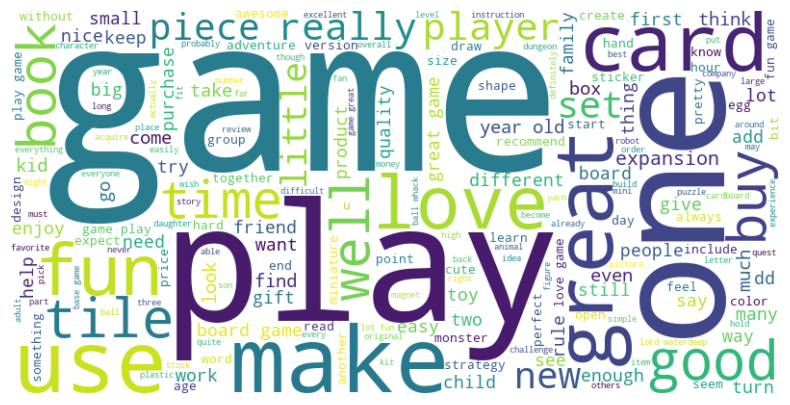

In [208]:
# Combine all lemmatized words into a single string
all_words_review = ' '.join([' '.join(text) for text in df6['lemmatized_review']])

# Generate the word cloud
wordcloud_review = WordCloud(width=800, height=400, background_color='white').generate(all_words_review)


# List of unwanted words
#unwanted_words = ['br'] #can add more here i.e unwanted_words = ['br', 'amazon']

# Remove unwanted words
#filtered_words = ' '.join([word for word in all_words.split() if word not in unwanted_words])

# Generate the word cloud
#wordcloud = WordCloud(width=800, height=400, background_color='white').generate(filtered_words)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_review, interpolation='bilinear') #shows image
plt.axis('off')  # Hide the axes
plt.show()

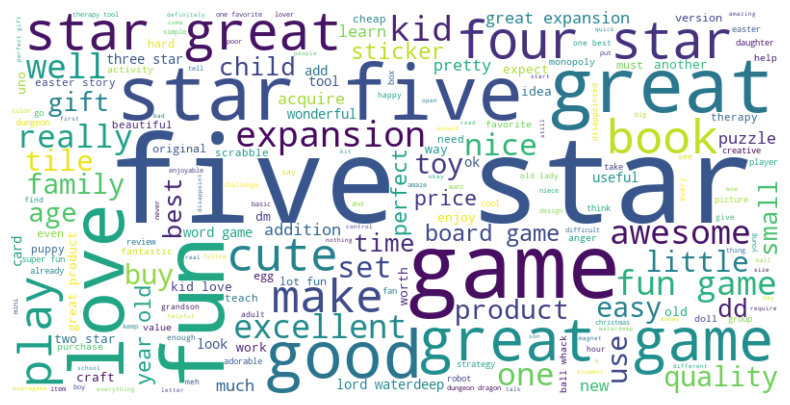

In [209]:
# Combine all lemmatized words into a single string
all_words_summary = ' '.join([' '.join(text) for text in df6['lemmatized_summary']])

# Generate the word cloud
wordcloud_summary = WordCloud(width=800, height=400, background_color='white').generate(all_words_summary)

# List of unwanted words
#unwanted_words = ['br'] #can add more here i.e unwanted_words = ['br', 'amazon']

# Remove unwanted words
#filtered_words = ' '.join([word for word in all_words.split() if word not in unwanted_words])

# Generate the word cloud
#wordcloud = WordCloud(width=800, height=400, background_color='white').generate(filtered_words)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_summary, interpolation='bilinear') #shows image
plt.axis('off')  # Hide the axes
plt.show()

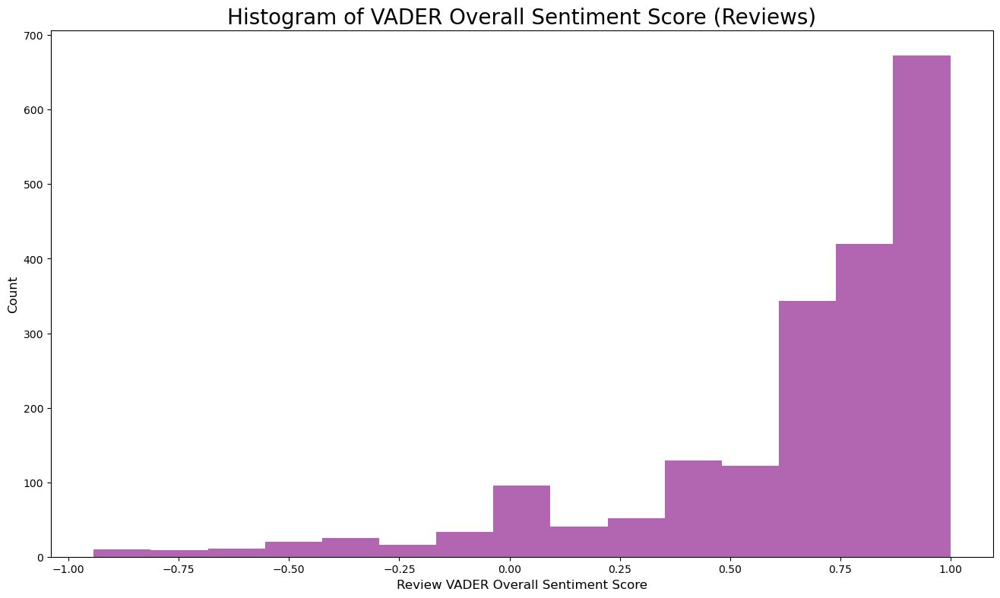

In [210]:
# Review: Create a histogram plot with bins = 15.

# Histogram of VADER Overall Sentiment Score (Reviews)

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df6['compound_review'], bins=15, facecolor='purple', alpha=0.6)

# Set the labels.
plt.xlabel('Review VADER Overall Sentiment Score', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of VADER Overall Sentiment Score (Reviews)', fontsize=20)

plt.show()

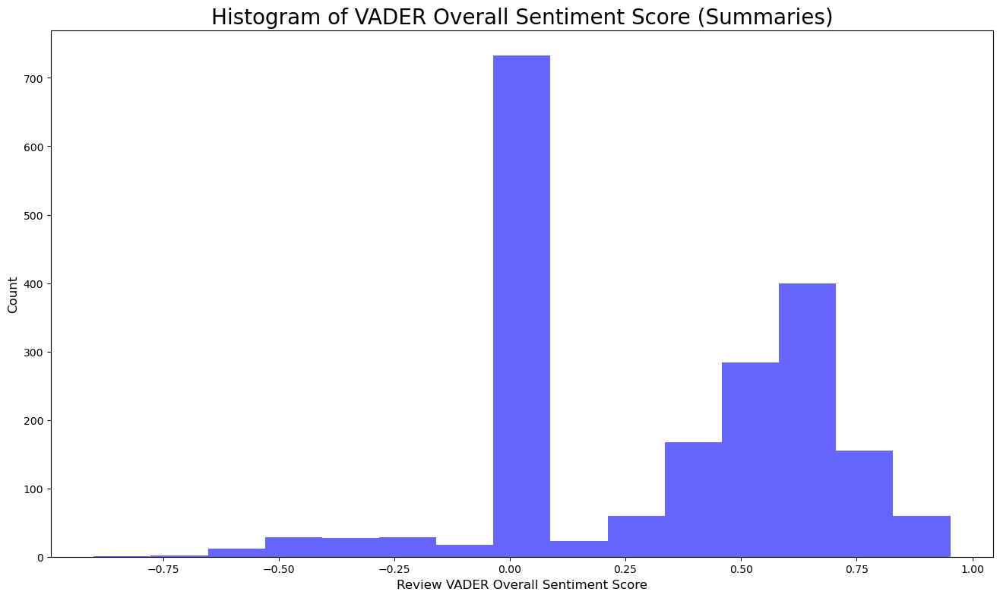

In [211]:
# Histogram of VADER Overall Sentiment Score (Summaries)

# Set the plot area.
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df6['compound_summary'], bins=15, facecolor='blue', alpha=0.6)

# Set the labels.
plt.xlabel('Review VADER Overall Sentiment Score', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of VADER Overall Sentiment Score (Summaries)', fontsize=20)

plt.show()

## 9. Additional VADER Analysis

### 9a) Gender Differences in Overall VADER Sentiment Score

In [212]:
# Select the columns from df6 and df3de
columns_from_df6 = ['compound_review', 'compound_summary'] 
columns_from_reviews = ['gender', 'review', 'summary']
columns_from_df3de = ['label']

# Create the new DataFrame by combining the selected columns from all DataFrames
df7 = pd.concat(
    [df3de[columns_from_df3de], df6[columns_from_df6], reviews[columns_from_reviews]], 
    axis=1
)

In [213]:
df7.head()

,label,compound_review,compound_summary,gender,review,summary
0,1,-0.71,0.03,Male,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...
1,3,0.91,-0.44,Male,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves.\n\nIn short, stop making crap DM screens.",Another worthless Dungeon Master's screen from GaleForce9
2,1,-0.23,0.56,Female,"Nice art, nice printing. Why two panels are filled with a general Forgotten Realms map is beyond me. Most of one of them is all blue ocean. Such a waste.\n\nI don't understand why they can't make these DM Screens more useful for these ""kinds of adventures"" rather than solely the specific adventure. You're supposed to be able to transpose this adventure to other lands outside the Forgotten Realms. So even just a list of new monsters or NPCs would at least be useful than the map. Even more would just be stuff related to running the game but broad-use stuff related to giants.\n\nSame thing with Curse of Strahd. Why not make it useful for raven loft, undead or horror campaigns in general... instead a huge amount of screen space is solely mapping out Castle Ravenloft, which is only useful during a small fraction of the time even for the Curse of Strahd adventure, let alone various other Ravenloft adventuring.\n\nThey really kill the extended use of these screens by not thinking about their potential use, both for the adventure in question, as well as use in a broader sense.\n\nThe Rage of Demons screen is far more useful for broad under dark adventuring - covering a lot of rules for the various conditions you may suffer... and the map is only one panel.\n\nThis Storm Giants one is decent for a few tables it includes - but really misses the mark. Maybe they should ask a few DMs what they would use?","pretty, but also pretty useless"
3,3,0.88,0.00,Female,Amazing buy! Bought it as a gift for our new dm and it's perfect!,Five Stars
4,1,-0.71,-0.32,Female,"As my review of GF9's previous screens these were completely unnecessary and nearly useless. Skip them, this is the definition of a waste of money.",Money trap


In [214]:
df7.shape

(2000, 6)

In [215]:
df7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   label             2000 non-null   int32  
 1   compound_review   2000 non-null   float64
 2   compound_summary  2000 non-null   float64
 3   gender            2000 non-null   object 
 4   review            2000 non-null   object 
 5   summary           2000 non-null   object 
dtypes: float64(2), int32(1), object(3)
memory usage: 86.1+ KB


In [216]:
# Convert cluster to a categorical variable.
df7['label'] = df7['label'].astype('category')

In [217]:
df7.dtypes

label               category
compound_review      float64
compound_summary     float64
gender                object
review                object
summary               object
dtype: object

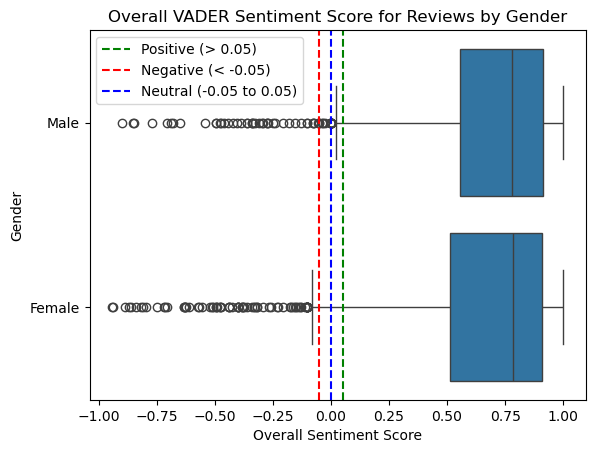

In [218]:
sns.boxplot(x='compound_review', y='gender', data=df7)

# Adding horizontal lines to indicate the thresholds for positive, neutral, and negative
plt.axvline(x=0.05, color='g', linestyle='--', label='Positive (> 0.05)')
plt.axvline(x=-0.05, color='r', linestyle='--', label='Negative (< -0.05)')
plt.axvline(x=0, color='b', linestyle='--', label='Neutral (-0.05 to 0.05)')

plt.title('Overall VADER Sentiment Score for Reviews by Gender')
plt.xlabel('Overall Sentiment Score')
plt.ylabel('Gender')

           
# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()

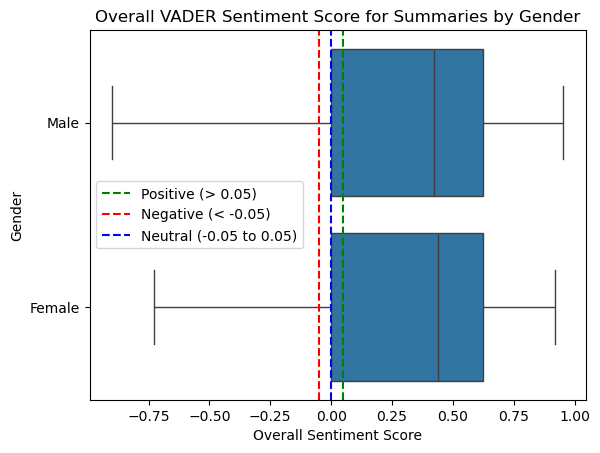

In [219]:
sns.boxplot(x='compound_summary', y='gender', data=df7)

# Adding horizontal lines to indicate the thresholds for positive, neutral, and negative
plt.axvline(x=0.05, color='g', linestyle='--', label='Positive (> 0.05)')
plt.axvline(x=-0.05, color='r', linestyle='--', label='Negative (< -0.05)')
plt.axvline(x=0, color='b', linestyle='--', label='Neutral (-0.05 to 0.05)')

plt.title('Overall VADER Sentiment Score for Summaries by Gender')
plt.xlabel('Overall Sentiment Score')
plt.ylabel('Gender')

           
# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()

### 9b) Overall VADER Sentiment Score of 3D K-Means Clusters

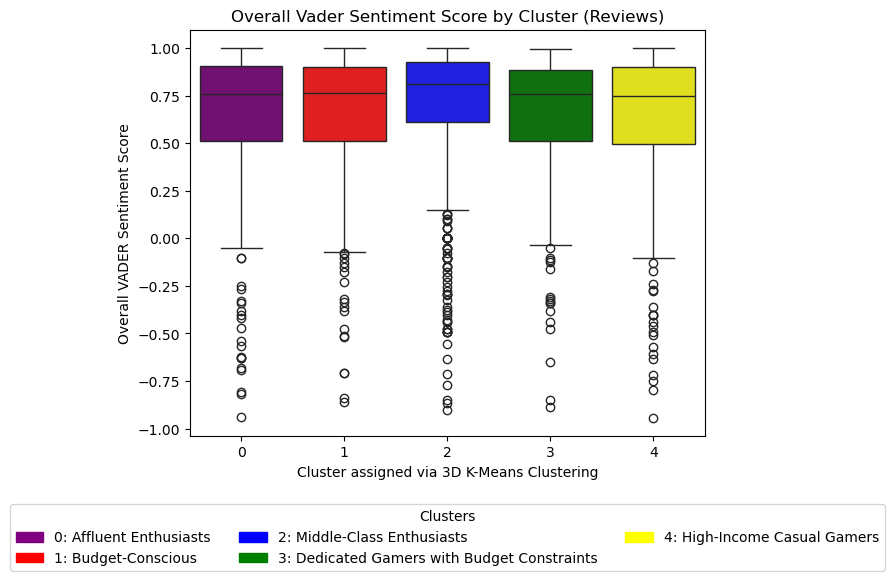

In [220]:
# Create a custom color palette with string keys based on the labels
palette = {'0': 'purple', '1': 'red', '2': 'blue', '3': 'green', '4': 'yellow'}

# Convert the label column to string type
df7['label'] = df7['label'].astype(str)

# Create the box plot with the order of labels 0 to 4
plt.figure(figsize=(8, 6))
sns.boxplot(x='label', y='compound_review', data=df7, palette=palette, order=['0', '1', '2', '3', '4'])

# Set plot labels and title
plt.xlabel('Cluster assigned via 3D K-Means Clustering')
plt.ylabel('Overall VADER Sentiment Score')
plt.title('Overall Vader Sentiment Score by Cluster (Reviews)')

# Create a custom legend
legend_labels = ['0: Affluent Enthusiasts', '1: Budget-Conscious',
                 '2: Middle-Class Enthusiasts', '3: Dedicated Gamers with Budget Constraints', 
                 '4: High-Income Casual Gamers']
legend_colors = ['purple', 'red', 'blue', 'green', 'yellow']

# Create the legend patches
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(legend_colors, legend_labels)]

# Place the legend below the plot (adjust `bbox_to_anchor` as needed)
plt.legend(handles=patches, title='Clusters', bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=3)

# Adjust the plot layout to accommodate the legend below
plt.tight_layout()

# Display the plot
plt.show()

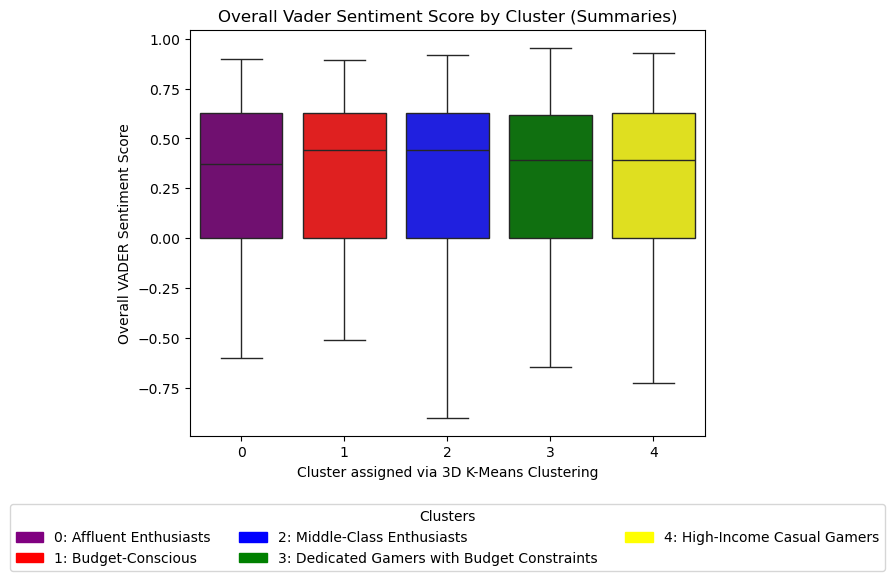

In [221]:
# Create a custom color palette with string keys based on the labels
palette = {'0': 'purple', '1': 'red', '2': 'blue', '3': 'green', '4': 'yellow'}

# Convert the label column to string type
df7['label'] = df7['label'].astype(str)

# Create the box plot with the order of labels 0 to 4
plt.figure(figsize=(8, 6))
sns.boxplot(x='label', y='compound_summary', data=df7, palette=palette, order=['0', '1', '2', '3', '4'])

# Set plot labels and title
plt.xlabel('Cluster assigned via 3D K-Means Clustering')
plt.ylabel('Overall VADER Sentiment Score')
plt.title('Overall Vader Sentiment Score by Cluster (Summaries)')

# Create a custom legend
legend_labels = ['0: Affluent Enthusiasts', '1: Budget-Conscious',
                 '2: Middle-Class Enthusiasts', '3: Dedicated Gamers with Budget Constraints', 
                 '4: High-Income Casual Gamers']
legend_colors = ['purple', 'red', 'blue', 'green', 'yellow']

# Create the legend patches
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(legend_colors, legend_labels)]

# Place the legend below the plot (adjust `bbox_to_anchor` as needed)
plt.legend(handles=patches, title='Clusters', bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=3)

# Adjust the plot layout to accommodate the legend below
plt.tight_layout()

# Display the plot
plt.show()


## End of notebook